# **<div align=center>Влияние гормональной терапии<br>дексаметазоном и преднизолоном<br>на гемодинамический статус у детей с тяжелой политравмой.</div>**
### <div align=right>**Пшениснов Константин Викторович / Pshenisnov Konstantin Victorovich**<br>кандидат медицинских наук,<br>доцент кафедры анестезиологии, реаниматологии и неотложной педиатрии факультета<br> послевузовского и дополнительного профессионального образования<br>ФГБОУ ВО «Санкт-Петербургский государственный педиатрический медицинский университет» Минздрава России<br><br>**Александрович Юрий Станиславович / Aleksandrovich Yurii Stanislavovich**<br> доктор медицинских наук,<br>профессор, заведующий кафедрой анестезиологии, реаниматологии и неотложной педиатрии факультета<br>послевузовского и дополнительного профессионального образования<br>ФГБОУ ВО «Санкт-Петербургский государственный педиатрический медицинский университет Минздрава России<br><br>**Липин Андрей Сергеевич / Lipin Andrei Sergeevich**<br>врач анестезиолог-реаниматолог, аналитик данных</div>

In [1]:
# This application (further - The Program) is a method to execute
# analysis of clinic and alaboratory features in multiple injured
# children while treatment in ICU by prednisolone and dexamethazone.
# This software is an example of realisation of analytic methods by
# which we conducted our survey, created patient samples and making
# comparison analysis between them.
# Copyright (C) 2020, by Konstantin Pshenisnov, Yurii Aleksandrovich and Andrei Lipin
#
# This program is free software: you can redistribute it and/or modify
# it under the terms of the GNU General Public License as published by
# the Free Software Foundation, either version 3 of the License, or
# (at your option) any later version.
#
# This program is distributed in the hope that it will be useful,
# but WITHOUT ANY WARRANTY; without even the implied warranty of
# MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.  See the
# GNU General Public License for more details.
# You should have received a copy of the GNU General Public License
# along with this program.  If not, see http://www.gnu.org/licenses/

# The Program is presented in several files;
# one of them is a python-notebook with the Python3-based code and
# is an unseparated part of The Program with the same
# legal base, namely GNU General Public License.
# All other files distributed as unseparated parts of this Program
# are available on the link:
# https://github.com/docinit/hormone_therapy_in_children_with_multiple_injuries

# Данное приложение является методом анализа клинико-лабораторных данных
# у пациентов с тяжелой сочетанной травмой, которые получали или не получали
# кортикостероидную терапию преднизолоном и/или дексаметазоном.
# В данном приложении описаны ход работы, методы формирования выборок
# и подходы к проведению аналитической работы с этими выборками.
# Также представлен метод реализации проведения данного анализа
# с помощью python v.3 и дополнительных библиотек.
#
# Эта программа - свободное программное обеспечение;
# вы можете распространять и/или модифицировать ее на
# условиях лицензии GNU General Public License,
# опубликованной Free Software Foundation, а именно ее версии 3
# или, по Вашему выбору, любой более поздней.
#
# Эта программа распространяется в надежде на ее пользу,
# но БЕЗ ЛЮБЫХ ГАРАНТИЙ; в т.ч. без финансовых гарантий или
# гарантии пользы в практическом применении.
# Если Вы хотите более детально ознакомиться, это можно сделать,
# открыв полный текст GNU General Public License.
#
# Вам должны предоставить копию GNU General Public License вместе
# с этой программой. В случае, если вы не получили копию
# GNU General Public License, откройте и ознакомьтесь с ней
# на http://www.gnu.org/licenses/
#
# Программа представлена в виде нескольких файлов
# один из них - python-ноутбук с кодом на языке программирования Python.
# он является неотъемлемой частью данной Программы.
# Все остальные файлы, являющиеся неотъемлемой частью данной Программы и
# распространяющиеся вместе с этой Программой,
# предоставляются на условиях той же лицензии
# GNU General Public License, что и Программа.
# Программа и файлы, распространяющиеся с ней, доступны по адресу
# https://github.com/docinit/hormone_therapy_in_children_with_multiple_injuries
#
# Authors
# 1. Pshenisnov Konstantin Viktorovich, psh_k@mail.ru
##  * concept and investigation design creation;
##  * data gathering;
##  * data analysis;
##  * text writing;
##  * text redaction.
# 2. Aleksandrovich Yurii Stanislavovich
##  * text redaction.
# 3. Lipin Andrei Sergeevich, andrey.s.lipin@gmail.com
##  * concept and investigation design creation
##  * data analysis:
###   * data cleaning;
###   * data transformation;
###   * data generation;
###   * results interpretation;
##  * statistical analysis;
##  * writing.
#
# Авторы:
# 1. Пшениснов Константин Викторович, psh_k@mail.ru:
## * концепция и дизайн исследования;
## * сбор данных:
## * обработка данных;
## * текст работы;
## * редактирование.
# 2. Александрович Юрий Станиславович
##  * редактирование работы.
# 3. Липин Андрей Сергеевич, andrey.s.lipin@gmail.com:
## * концепция и дизайн исследования;
## * обработка данных:
###  * очистка данных;
###  * преобразование данных;
###  * генерация новых признаков;
###  * интерпретация результатов работы;
## * статистическая обработка данных;
## * текст работы.

In [2]:
import pandas as pd
import numpy as np
from scipy import stats
from matplotlib import pyplot as plt
import seaborn as sns

sns.set(style='whitegrid', rc={"grid.linewidth": 0.1})
sns.set_context("paper", font_scale=1.8)

### В данном исследовании разбираются вопросы связи гормональной терапии (преднизолом и дексаметазоном) и клинико-лабораторных (гемодинамических и биохимических) изменений у пациентов до 18 лет с тяжелой сочетанной травмой.

* Обозначения:
    * ГТ = гормональная терапия
    * ГТ+ - получение гормональной терапии
    * ГТ- - гормональная терапия не использовалась

**Исследуемые параметры**:
* систолическое артериальное давление (САД);
* диастолическое артериальное давление (ДАД);
* среднее артериальное давление (СрАД);
* частота сердечных сокращений;
* индекс Альговера;
* насыщение крови кислородом (SpO2);
* масса тела;
* хлор в крови;
* лактат в крови;
* АЛТ в крови;
* АСТ в крови;
* АЧТВ
* инфузия (в процентах от физиологической потребности);
* катехоламиновый индекс;
* площадь тела;
* диурез;
* исход заболевания.

* Анализ состава пацентов: диагнозы

In [3]:
df = pd.read_csv('improved_08_2020_svm.csv',index_col=0)
# загрузка диагнозов пациентов
df_ds = pd.read_csv("ID_DS.csv")
# диагнозы - в списки
df_ds.Diagnos = [i.split('.') for i in df_ds.Diagnos]
# загрузка предварительно (вручную) обработанных диагнозов (разбиты по группам)
df_ds_class = pd.read_csv('df_ds2.csv')
df_ds = df_ds.explode('Diagnos')
for k,items in enumerate(df_ds_class['Diagnos']):
#     items_list=items.split(',')
#     for item in items_list:
    df_ds.loc[df_ds['Diagnos']==items,'Class'] = df_ds_class['Класс'][k]
#         if 'Многооскольчатый перелом нижней челюсти ' in item:
#             print(item)
# теперь в таблице диагнозов имеется и группа, к которым они относятся:
# повреждения головы, головного мозга, конечностей и др.
df_ds.head(50)

,ID,Diagnos,Class
0,1,Кататравма,Кататравма
0,1,Сочетанная травма,Другое
0,1,ЗЧМТ,Головной мозг
0,1,Ушиб ГМ легкой степени,Головной мозг
0,1,Многооскольчатый перелом нижней челюсти со сме...,Голова
0,1,"Двусторонний перелом нижних стенок глазниц,гем...",Голова
0,1,Гематосинус с двух сторон,Гемосинус
0,1,Закрытый перелом правого бедра в среднй трети ...,Конечности
0,1,Постгеморрагическая анемия тяжелой степени,Кровотечение
0,1,,NaN


In [4]:
df_ds.dropna(inplace=True)
df_ds.Class = [list(set(i.split(','))) for i in df_ds.Class]

import numpy as np
df_ds = df_ds.explode('Class')
a = [df_ds.loc[df_ds.ID==i,['ID','Class']] for i in df_ds.ID.unique()]
for index in range(len(a)):
    a[index].Class= a[index].Class.apply(lambda x: [i for i in a[index].Class.values])
    a[index] = a[index].values[0]
    a[index][1] = list(set([i for i in a[index][1]]))

pd.options.display.max_rows=300
a = pd.DataFrame(a)
columns = pd.DataFrame(a).explode(1)[1].unique()
patients_ds = pd.DataFrame(columns=columns,index = pd.DataFrame(a)[0])
for i in columns:
    for index in patients_ds.index:
        patients_ds[i][index] = 1 if i in a.loc[a[0]==index,1].values[0] else 0
        
patients_ds.head()
patients_ds.loc[patients_ds[['Вклинение ГМ','Кома','Спинной мозг','ВЖК','САК','Головной мозг']].sum(axis=1)>0,'ЦНС']=1
patients_ds.loc[patients_ds[['Ателектазы','Гидроторакс','Аспирация','Гемоторакс','Пневмоторакс','Легкие']].sum(axis=1)>0,'Органы грудной клетки']=1
patients_ds.loc[patients_ds[['МПС','Живот']].sum(axis=1)>0,'Травма живота']=1
patients_ds.loc[patients_ds[['Гемосинус','Голова']].sum(axis=1)>0,'Голова']=1
patients_ds.loc[patients_ds[['Позвонки','Грудь','Голова','Конечности']].sum(axis=1)>0,'ОДА']=1
patients_ds.loc[patients_ds[['ЦНС','ОДА']].sum(axis=1)>0,'ЦНС + ОДА']=1
patients_ds.loc[patients_ds[['ЦНС','Органы грудной клетки']].sum(axis=1)>0,'ЦНС + Органы грудной клетки']=1
patients_ds.loc[patients_ds[['ЦНС','Травма живота']].sum(axis=1)>0,'ЦНС + Травма живота']=1
patients_ds.loc[patients_ds[['ЦНС','Голова']].sum(axis=1)>0,'ЦНС + Голова']=1
patients_ds.loc[patients_ds[['ЦНС','ОДА' ,'Голова']].sum(axis=1)>0,'ЦНС + ОДА + Голова']=1
patients_ds.loc[patients_ds[['ЦНС','ОДА','Органы грудной клетки']].sum(axis=1)>0,'ЦНС + ОДА + Органы грудной клетки']=1
patients_ds.loc[patients_ds[['ЦНС','ОДА','Травма живота']].sum(axis=1)>0,'ЦНС + ОДА + Травма живота']=1
patients_ds.loc[patients_ds[['ЦНС','ОДА','Травма живота','Органы грудной клетки']].sum(axis=1)>0,'ЦНС + ОДА + Травма живота + Органы грудной клетки']=1
patients_ds.loc[patients_ds[['ЦНС','ОДА','Органы грудной клетки','Голова']].sum(axis=1)>0,'ЦНС + ОДА + Органы грудной клетки + Голова']=1
patients_ds.loc[patients_ds[['ЦНС','Травма живота','Органы грудной клетки','Голова']].sum(axis=1)>0,'ЦНС + Травма живота + Органы грудной клетки + Голова']=1
patients_ds.loc[patients_ds[['ЦНС','Травма живота','Голова']].sum(axis=1)>0,'ЦНС + Травма живота + Голова']=1
patients_ds.loc[patients_ds[['ЦНС','Органы грудной клетки','Голова']].sum(axis=1)>0,'ЦНС + Органы грудной клетки + Голова']=1
patients_ds.loc[patients_ds[['ЦНС','Голова']].sum(axis=1)>0,'ЦНС + Голова']=1

### Загрузка данных и описательная статистика всей выборки

In [5]:
# чтение данных
df_plot = df = pd.read_csv('../Datasets/improved_08_2020.csv',index_col=0)
# выбор параметров
target_columns = ['AGE','GT','SBP','DBP','MBP','HR','IA','SpO2','Weight','Cl-','LACT','AMYL','ALT','AST','APTV','VOL_%','CI','B_surface','Diur_p_kg', 'OUTCOME']
df = df[['ID','Day'] + target_columns]
# переименование
df.columns = target_columns = ['ID','Day','Возраст','GT','САД', 'ДАД','СрАД','ЧСС','ИА','SpO2','Масса тела','Cl-','Лактат','Амилаза','АЛТ','АСТ','АЧТВ','Инфузия, % от N','КИ','Площадь тела','Диурез, мл/кг', 'OUTCOME']
# описательная статистика
df[2:].describe().T

,count,mean,std,min,25%,50%,75%,max
ID,1390.0,89.139568,53.483134,1.000000,56.000000,84.000000,119.000000,216.000000
Day,1390.0,7.479137,7.851433,1.000000,2.000000,5.000000,9.000000,49.000000
Возраст,1390.0,9.973351,5.452043,0.250000,5.000000,11.000000,15.000000,18.000000
GT,1390.0,0.323022,0.467799,0.000000,0.000000,0.000000,1.000000,1.000000
САД,1390.0,111.279856,15.730912,45.000000,100.000000,110.000000,120.000000,170.000000
ДАД,1390.0,64.853237,12.544982,5.000000,58.000000,65.000000,73.000000,119.000000
СрАД,1390.0,80.328777,12.699138,26.333333,73.333333,80.166667,88.333333,120.666667
ЧСС,1390.0,105.741727,23.503876,24.000000,90.000000,106.000000,120.000000,186.000000
ИА,1390.0,0.975362,0.294496,0.200000,0.781818,0.946333,1.105263,3.100000
SpO2,1390.0,98.374820,3.334239,26.000000,98.000000,99.000000,100.000000,110.000000


In [6]:
print(sorted(df.loc[:,'Cl-'].unique()))

[0.0, 1.2, 31.0, 60.6, 85.0, 87.0, 92.0, 93.0, 93.1, 93.3, 94.0, 95.0, 95.5, 95.8, 96.0, 96.7, 97.0, 97.1, 97.7, 98.0, 98.2, 98.3, 98.4, 98.6, 98.7, 98.9, 99.0, 99.3, 99.4, 99.5, 99.6, 99.7, 99.8, 99.9, 100.0, 100.1, 100.2, 100.3, 100.4, 100.6, 100.7, 100.8, 100.9, 101.0, 101.1, 101.2, 101.3, 101.35, 101.5, 101.6, 101.7, 101.8, 101.9, 102.0, 102.1, 102.3, 102.35, 102.4, 102.45, 102.6, 102.7, 103.0, 103.1, 103.2, 103.3, 103.4, 103.5, 103.6, 103.8, 103.9, 104.0, 104.15, 104.3, 104.4, 104.5, 104.7, 104.8, 105.0, 105.3, 105.6, 105.7, 105.8, 105.9, 106.0, 106.2, 106.5, 106.6, 106.7, 106.9, 107.0, 107.3, 107.4, 107.6, 107.7, 107.8, 108.0, 108.4, 108.5, 108.6, 108.7, 109.0, 109.1, 109.5, 109.8, 109.9, 110.0, 110.2, 110.3, 110.5, 110.7, 111.0, 111.2, 111.5, 111.6, 111.7, 111.9, 112.0, 112.1, 112.3, 112.6, 113.0, 113.4, 113.7, 114.0, 114.2, 115.0, 115.3, 116.0, 116.7, 117.0, 118.0, 118.5, 119.0, 120.0, 121.0, 122.0, 122.6, 123.0, 124.0, 125.0, 126.0, 127.0, 128.0, 129.0, 130.0, 131.0, 132.0, 13

In [7]:
# Исправление ошибочных записей;
# Перед этим были проанализированы результаты, получаемые без исправлений:
# выводы, которые получаются в двух случаях, не меняются; исправление влияет только на p-value
# в результатах, касающихся хлоремии
# sorted(df['Cl-'].unique())
df.loc[df['Cl-'] == 1.2,'Cl-'] = 102
df.loc[df['Cl-'] == 0,'Cl-'] = df['Cl-'].mean().copy()
df.loc[df['Cl-'] == 1102,'Cl-'] = 110.2
df.loc[df['Cl-'] == 200.4,'Cl-'] = 100.4
df.loc[df['Cl-'] == 507,'Cl-'] = 107

In [8]:
ds_stat = pd.DataFrame(patients_ds[patients_ds.index.isin(df.ID)].fillna(0).astype(int).sum(axis=0)).sort_values(0)
fig, ax = plt.subplots(figsize=(4,20),dpi=600)
plt.barh(y=ds_stat.index[-25:], width=ds_stat[0][-25:])
plt.xticks(rotation='vertical')
ax.xaxis.tick_top()
ax.set_xlabel('Количество пациентов с повреждениями')    
ax.xaxis.set_label_position('top')
plt.show()

In [9]:
ds_stat[-25:]

,0
САК,48
Кататравма,58
Автотравма,63
Легкие,66
Органы грудной клетки,73
Живот,92
Конечности,100
Травма живота,101
Голова,128
Другое,130



 Мальчики и девочки, %: 		 63.55, 36.45 
 Пациенты без ВЖК и с ВЖК, %: 		 66.5, 33.5 
 Выживших и умерших, %: 		 90.64, 9.36 
 Получавших и не получавших ГТ, %: 	 55.67, 44.33


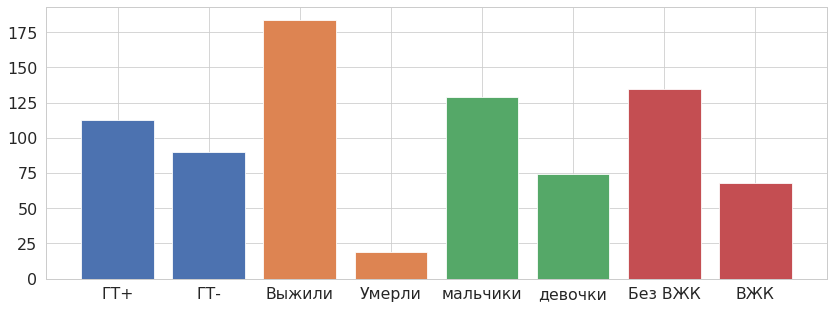

In [10]:
df_stat = pd.read_csv('../Datasets/improved_08_2020.csv',index_col=0)
print('\n','Мальчики и девочки, %: \t\t',str([round(i/203 * 100,2) for i in df_stat.groupby('ID').min().SEX.value_counts().values])[1:-1],'\n',\
     'Пациенты без ВЖК и с ВЖК, %: \t\t',str([round(i/203 * 100,2) for i in df_stat.groupby('ID').min().ICH.value_counts().values])[1:-1],'\n',\
     'Выживших и умерших, %: \t\t',str([round(i/203 * 100,2) for i in df_stat.groupby('ID').min().OUTCOME.value_counts()])[1:-1],'\n',\
     'Получавших и не получавших ГТ, %: \t',str([round(i/203 * 100,2) for i in df_stat.groupby('ID').max().GT.value_counts()])[1:-1])
plt.figure(figsize=(14,5))
plt.bar(x=['ГТ+', 'ГТ-'],height=df_stat.groupby('ID').max()['GT'].value_counts());
plt.bar(x=['Выжили','Умерли'],height=df_stat.groupby('ID').min()['OUTCOME'].value_counts());
plt.bar(x=['мальчики','девочки'],height=df_stat.groupby('ID').min().SEX.value_counts());
plt.bar(x=['Без ВЖК','ВЖК'],height=df_stat.groupby('ID').min()['ICH'].value_counts());

* Количество пациентов

In [11]:
df_stat.groupby('ID').min()[['AIS','PTS','TCMV','TH_count']].describe().set_axis(['AIS','PTS','Время ИВЛ, дни','Время лечения в ОРИТ, дни'],axis=1).\
                                                                        set_axis(['Количество','Среднее','Стандартное отклонение','Минимальное значение','25-квантиль','Медиана','75-квантиль','Максимальное значение'],axis=0)

,AIS,PTS,"Время ИВЛ, дни","Время лечения в ОРИТ, дни"
Количество,203.000000,203.000000,203.000000,203.000000
Среднее,36.812808,5.206897,74.689655,6.926108
Стандартное отклонение,15.763237,3.587182,124.144707,6.965933
Минимальное значение,2.000000,-2.000000,0.000000,1.000000
25-квантиль,25.000000,2.000000,0.000000,2.000000
Медиана,34.000000,5.000000,12.000000,5.000000
75-квантиль,48.000000,8.000000,97.500000,8.000000
Максимальное значение,86.000000,12.000000,677.000000,49.000000


В данном исследовании пациенты отбирались по следующим критериям:

    * наличие сочетанной травмы;
    * отсутствие сопутствующих заболеваний;
    * возраст до 18 лет;
    * необходимость лечения в отделении реанимации и интенсивной терапии.

На графиках бокс-плот видно, что выжившие и умершие пациенты, мальчики и девочки, имеют сходные массу тела и возраст.

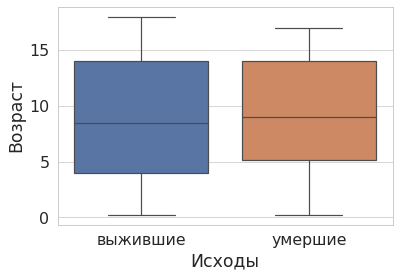

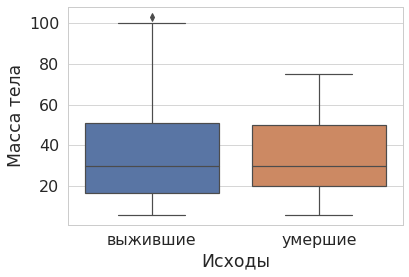

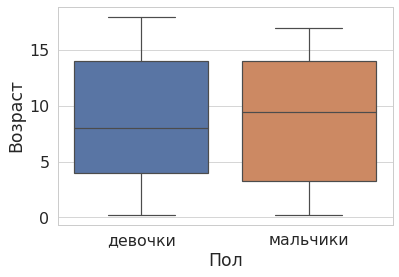

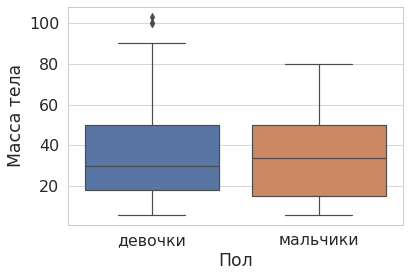

In [12]:
df_plot = df_plot[['ID','AGE','SEX','OUTCOME','Weight','Day']].groupby('ID',as_index=False).max()
sns.boxplot(x=df_plot['OUTCOME'].replace({'Died':'умершие','Survived':'выжившие'}),y = df_plot['AGE'])
plt.ylabel('Возраст')
plt.xlabel('Исходы')
plt.show()
sns.boxplot(x=df_plot['OUTCOME'].replace({'Died':'умершие','Survived':'выжившие'}),y = df_plot['Weight'])
plt.ylabel('Масса тела')
plt.xlabel('Исходы')
plt.show()
sns.boxplot(x=df_plot['SEX'].replace({0:'девочки',1:'мальчики'}),y = df_plot['AGE'])
plt.ylabel('Возраст')
plt.xlabel('Пол')
plt.show()
sns.boxplot(x=df_plot['SEX'].replace({0:'девочки',1:'мальчики'}),y = df_plot['Weight'])
plt.ylabel('Масса тела')
plt.xlabel('Пол')
plt.show()

---

## Анализ различий между параметрами в разные дни

**Первый день в ОРИТ:<br>значения клинико-лабораторных данных при поступлении (т.е. в первый день) могут сильно отличаться от средних значений соответствующих параметров каждого пациента в другие дни из-за проводимой терапии**.<br>
**Проведенный ниже тест Вилкоксона показывает, что имеется существенная разница между параметрами в 1й день и средними значениями за последующие дни**

* 1 день и 2-10 дни

In [13]:
from scipy.stats import wilcoxon
df0_ = df.loc[(df.Day>1)&(df.Day<=10),:].groupby('ID',as_index=False).mean().drop('Day',axis=1).copy()
df1_ = df.loc[df.Day==1,:].drop('Day',axis=1).copy()
ids = df0_.ID.unique() # смотрим только пациентов, которые оставались в ОРИТ в период 2-10 день
columns = list(df0_.columns[2:-1])
columns.remove('Масса тела')
columns.remove('Площадь тела')
results = []
break_line = '\n'
for i in columns:
    statistics, p = stats.wilcoxon(df0_[i],df1_[df1_.ID.isin(ids)][i])
    results.append([i,round(p,3),f'{round(df0_[i].median(),2)} [{round(df0_[i].quantile([0.25]).values[0],2)}-{round(df0_[i].quantile([0.75]).values[0],2)}]',\
                   f'{round(df1_[df1_.ID.isin(ids)][i].median(),2)} [{round(df1_[df1_.ID.isin(ids)][i].quantile([0.25]).values[0],2)}-{round(df1_[df1_.ID.isin(ids)][i].quantile([0.75]).values[0],2)}]',f'Различие значимо' if p<0.05 else f'Не значимое различие'])
pd.DataFrame(results).set_axis(['Параметр','p_value','1 день','2-10 дни','Значимость'],axis=1)

,Параметр,p_value,1 день,2-10 дни,Значимость
0,GT,0.001,0.12 [0.0-0.75],0.0 [0.0-1.0],Различие значимо
1,САД,0.005,110.0 [102.67-117.22],108.0 [95.0-120.0],Различие значимо
2,ДАД,0.019,64.33 [58.89-70.0],61.0 [55.0-70.0],Различие значимо
3,СрАД,0.008,79.78 [73.33-84.78],77.33 [68.33-86.67],Различие значимо
4,ЧСС,0.000,105.71 [94.0-115.56],110.0 [92.0-125.0],Различие значимо
5,ИА,0.000,0.95 [0.83-1.11],1.0 [0.83-1.24],Различие значимо
6,SpO2,0.685,98.78 [98.0-99.78],99.0 [98.0-100.0],Не значимое различие
7,Cl-,0.700,108.89 [104.6-112.89],108.74 [104.0-112.0],Не значимое различие
8,Лактат,0.000,1.2 [0.0-1.7],1.1 [0.0-2.6],Различие значимо
9,Амилаза,0.000,35.25 [0.0-94.0],18.3 [0.0-49.7],Различие значимо


* Эти результаты пригодятся позже

* Для сравнения: подобный анализ сделан для 2го дня и средних значений за последующие дни;
* То же самое - для 3го дня.
* В результате можно видеть, что уже к 3му дню различия значительно менее выражены

* 2 день и 3-10 дни

In [14]:
# 2 день и 3-10 дни
df0_ = df.loc[(df.Day!=1)&(df.Day!=2)&(df.Day<=10),['ID']+['Day']+columns].groupby('ID',as_index=False).mean().drop('Day',axis=1).copy()
df1_ = df.loc[df.Day==2,['ID']+['Day']+columns].drop('Day',axis=1).copy()
ids = df0_.ID.unique().copy() # смотрим только пациентов, которые оставались в ОРИТ в период 3-10 день

results = []
for i in columns:
    statistics, p = stats.wilcoxon(df0_[i],df1_[df1_.ID.isin(ids)][i])
    results.append([i,round(p,3),f'Различие значимо' if p<0.05 else f'Не значимое различие'])
print("Различия между значениями параметров на 2й день и средними значениями за последующие дни (до 10го дня)")
pd.DataFrame(results).set_axis(['Параметр','p_value','Значимость'],axis=1)

Различия между значениями параметров на 2й день и средними значениями за последующие дни (до 10го дня)


,Параметр,p_value,Значимость
0,GT,0.002,Различие значимо
1,САД,0.001,Различие значимо
2,ДАД,0.001,Различие значимо
3,СрАД,0.000,Различие значимо
4,ЧСС,0.000,Различие значимо
5,ИА,0.000,Различие значимо
6,SpO2,0.012,Различие значимо
7,Cl-,0.002,Различие значимо
8,Лактат,0.072,Не значимое различие
9,Амилаза,0.278,Не значимое различие


* 3 день и 4-10 дни

In [15]:
# в выборку за третий день не попал пациент №17 с неполными данными (строка удалена)
df[df.ID==17][['ID','Day']]

,ID,Day
91,17,1
92,17,2
93,17,4


In [16]:
# 3 день и 4-10 дни
df0_ = df.loc[(~df.Day.isin([1,2,3]))&(df.Day<=10),['ID']+['Day']+columns].groupby('ID',as_index=False).mean().drop('Day',axis=1).copy()
df1_ = df.loc[df.Day==3,['ID']+['Day']+columns].drop('Day',axis=1).copy()
ids = df0_.ID.unique() # смотрим только пациентов, которые оставались в ОРИТ в период 4-10 день
ids = ids[~np.isin(ids,17)].copy()
# columns = list(df0_.columns[2:-1])
# columns.remove('Масса тела')
# columns.remove('Площадь тела')
results = []
for i in columns:
    statistics, p = stats.wilcoxon(df0_[df0_.ID.isin(ids)][i],df1_[df1_.ID.isin(ids)][i])
    results.append([i,round(p,3),f'Различие значимо' if p<0.05 else f'Не значимое различие'])
print("Различия между значениями параметров на 3й день и средними значениями за последующие дни (до 10го дня)")
pd.DataFrame(results)

Различия между значениями параметров на 3й день и средними значениями за последующие дни (до 10го дня)


,0,1,2
0,GT,0.000,Различие значимо
1,САД,0.011,Различие значимо
2,ДАД,0.310,Не значимое различие
3,СрАД,0.066,Не значимое различие
4,ЧСС,0.670,Не значимое различие
5,ИА,0.181,Не значимое различие
6,SpO2,0.233,Не значимое различие
7,Cl-,0.000,Различие значимо
8,Лактат,0.266,Не значимое различие
9,Амилаза,0.017,Различие значимо


---

## Анализ различий между значениями параметров разных ГТ-групп пациентов

#### На основе получения ГТ и исходов заболевания было сформировано 9 групп пациентов:
1. Общая группа (все пациенты)
2. Пациенты, получавшие ГТ
3. Пациенты, не получавшие ГТ
4. Выжившие пациенты
5. Выжившие пациенты, получавшие ГТ
6. Выжившие пациенты, не получавшие ГТ
7. Умершие пациенты
8. Умершие пациенты, получавшие ГТ
9. Умершие пациенты, не получавшие ГТ

In [17]:
days = list(range(1,8))
df_all = df.loc[df.Day==7,'ID'].unique().copy()
df_all = df.loc[(df.ID.isin(df_all))&(df.Day.isin(days)),:].copy()
df_gt_users = df_all.loc[df_all.GT==1,'ID'].unique().copy()
df_gt = df_all.loc[df_all.ID.isin(df_gt_users),:].copy()
df_nogt = df_all.loc[~df_all.ID.isin(df_gt_users),:].copy()
df_surv = df_all.loc[df_all.OUTCOME=='Survived',:].copy()
# df_surv_gt_users = df_all.loc[(df_all.OUTCOME=='Survived')&(df_all.GT==1),'ID'].unique()
df_surv_gt = df_gt.loc[df_gt.OUTCOME=='Survived',:].copy()
df_surv_nogt = df_nogt.loc[df_nogt.OUTCOME=='Survived',:].copy()
df_died = df_all.loc[df_all.OUTCOME=='Died',:].copy()
# df_died_gt_users = df_all.loc[(df_all.OUTCOME=='Died')&(df_all.GT==1),'ID'].unique()
df_died_gt = df_gt.loc[df_gt.OUTCOME=='Died',:].copy()
df_died_nogt = df_nogt.loc[df_nogt.OUTCOME=='Died',:].copy()

print(f'Всего пациентов, лечившихся 7 и более дней: {df_all.ID.nunique()}\n\
всего пациентов, получавших ГТ: {df_gt.ID.nunique()}\n\
всего пациентов, не получавших ГТ: {df_nogt.ID.nunique()}\n\
выживших пациентов: {df_surv.ID.nunique()}\n\
выживших, получавших ГТ: {df_surv_gt.ID.nunique()}\n\
выживших, не получавших ГТ: {df_surv_nogt.ID.nunique()}\n\
умерших пациентов: {df_died.ID.nunique()}\n\
умерших, получавших ГТ: {df_died_gt.ID.nunique()}\n\
умерших, не получавших ГТ: {df_died_nogt.ID.nunique()}\n\
')

Всего пациентов, лечившихся 7 и более дней: 82
всего пациентов, получавших ГТ: 58
всего пациентов, не получавших ГТ: 24
выживших пациентов: 68
выживших, получавших ГТ: 47
выживших, не получавших ГТ: 21
умерших пациентов: 14
умерших, получавших ГТ: 11
умерших, не получавших ГТ: 3



### Поиск внутригрупповых различий в разные дни производили с помощью теста Фридмана
1. Изучение 1, 2, 3, 4, 5, 6, 7 дней

In [18]:
from scipy.stats import friedmanchisquare
def highlight(x):
    color = 'lightgreen' if float(x.split(' ')[-1])<=0.01 else 'lightblue'
    return 'background-color: %s' % color


params = list(set(df_all.columns[4:-1])-set(['Масса тела','Площадь тела']))
tab_lists = ['Все пациенты','Получали ГТ','Не получали ГТ', 'Выжили', 'Выжили, получали ГТ', 'Выжили, не получали ГТ', 'Умерли', 'Умерли, получали ГТ','Умерли, не получали ГТ']
results = []
for i in params:
#     print('*'*5,i,'*'*(50-len(list(i))))
    for k,z in enumerate([df_all,df_gt,df_nogt, df_surv, df_surv_gt, df_surv_nogt, df_died, df_died_gt, df_died_nogt]):
        stat,p = friedmanchisquare(z.loc[z.Day==1,i],z.loc[z.Day==2,i],z.loc[z.Day==3,i],z.loc[z.Day==4,i],z.loc[z.Day==5,i],z.loc[z.Day==6,i],z.loc[z.Day==7,i])
#         print(tab_lists[k],round(p,4))
        values = [round(z[i].median(),2),round(z[i].quantile(0.25),2),round(z[i].quantile(0.75),2),round(p,4)]
        results.append([i,tab_lists[k],str(values[0])+';\r\n ['+str(values[1])+', '+str(values[2])+'] p_value ='+' '+str(values[-1])])

a = pd.DataFrame(results)
a = a.pivot(columns = 1,index = 0,values = 2).rename_axis(None, axis=0).rename_axis('Параметры', axis=1).style.applymap(highlight)
a

Параметры,Все пациенты,Выжили,"Выжили, не получали ГТ","Выжили, получали ГТ",Не получали ГТ,Получали ГТ,Умерли,"Умерли, не получали ГТ","Умерли, получали ГТ"
Cl-,"110.0; [106.0, 116.75] p_value = 0.0002","110.0; [105.0, 115.0] p_value = 0.0","110.0; [105.5, 116.0] p_value = 0.0523","110.0; [105.0, 115.0] p_value = 0.0001","110.85; [106.75, 116.0] p_value = 0.2838","110.0; [105.3, 117.0] p_value = 0.0007","112.0; [108.74, 123.0] p_value = 0.3385","112.1; [108.74, 132.0] p_value = 0.3776","112.0; [108.74, 123.0] p_value = 0.7231"
SpO2,"99.0; [98.0, 100.0] p_value = 0.6888","99.0; [98.0, 100.0] p_value = 0.6282","99.0; [97.0, 100.0] p_value = 0.8323","99.0; [98.0, 100.0] p_value = 0.2393","99.0; [98.0, 100.0] p_value = 0.5531","99.0; [98.0, 100.0] p_value = 0.1821","98.0; [98.0, 99.0] p_value = 0.1251","99.0; [98.0, 100.0] p_value = 0.034","98.0; [98.0, 99.0] p_value = 0.0451"
АЛТ,"41.3; [21.21, 93.0] p_value = 0.0029","38.48; [19.95, 89.52] p_value = 0.0004","44.4; [22.25, 117.35] p_value = 0.0117","33.7; [19.3, 71.0] p_value = 0.0738","44.8; [22.0, 103.55] p_value = 0.0242","40.9; [21.02, 85.64] p_value = 0.176","66.0; [41.0, 111.5] p_value = 0.8893","71.0; [22.0, 72.75] p_value = 0.7574","66.0; [42.8, 113.0] p_value = 0.9291"
АСТ,"58.75; [36.0, 120.65] p_value = 0.0","54.4; [35.38, 100.1] p_value = 0.0","60.4; [43.85, 112.95] p_value = 0.0","50.6; [33.2, 95.0] p_value = 0.0","60.4; [40.04, 125.0] p_value = 0.0","57.0; [35.3, 118.52] p_value = 0.0","110.5; [45.0, 183.0] p_value = 0.8795","85.0; [30.0, 189.0] p_value = 0.8219","111.0; [80.0, 177.0] p_value = 0.9413"
АЧТВ,"31.0; [24.8, 36.5] p_value = 0.1001","31.0; [26.3, 36.62] p_value = 0.0358","32.3; [27.0, 39.0] p_value = 0.4393","31.0; [26.0, 35.0] p_value = 0.0832","32.05; [26.3, 38.39] p_value = 0.3098","30.0; [24.0, 35.08] p_value = 0.2805","24.5; [0.0, 36.15] p_value = 0.0035","25.0; [0.0, 31.5] p_value = 0.0983","24.0; [0.0, 37.0] p_value = 0.1185"
Амилаза,"51.3; [0.0, 120.69] p_value = 0.0","63.85; [27.0, 143.52] p_value = 0.0","55.7; [27.5, 102.85] p_value = 0.0019","69.4; [27.0, 171.2] p_value = 0.0","50.5; [19.22, 101.1] p_value = 0.0019","51.3; [0.0, 140.43] p_value = 0.0","0.0; [0.0, 0.0] p_value = 0.667","0.0; [0.0, 63.4] p_value = 0.4232","0.0; [0.0, 0.0] p_value = 0.4232"
ДАД,"62.0; [55.0, 70.0] p_value = 0.0019","63.0; [55.0, 70.0] p_value = 0.0002","65.0; [60.0, 72.0] p_value = 0.4422","61.0; [55.0, 70.0] p_value = 0.0001","63.0; [58.0, 72.0] p_value = 0.0938","61.0; [55.0, 70.0] p_value = 0.0078","60.0; [51.0, 74.75] p_value = 0.8088","56.0; [51.0, 63.0] p_value = 0.0516","64.0; [52.0, 76.0] p_value = 0.1455"
"Диурез, мл/кг","48.0; [33.24, 75.5] p_value = 0.0009","47.83; [32.98, 75.0] p_value = 0.0033","48.46; [34.52, 79.17] p_value = 0.3763","47.5; [32.22, 73.33] p_value = 0.0078","48.23; [34.75, 79.17] p_value = 0.2918","47.83; [32.94, 74.5] p_value = 0.0011","49.17; [35.01, 79.0] p_value = 0.5069","45.83; [40.54, 79.17] p_value = 0.7555","50.0; [34.62, 78.5] p_value = 0.1573"
ИА,"0.91; [0.76, 1.09] p_value = 0.0001","0.9; [0.74, 1.07] p_value = 0.0001","0.93; [0.73, 1.09] p_value = 0.8015","0.89; [0.75, 1.06] p_value = 0.0","0.97; [0.74, 1.11] p_value = 0.7597","0.9; [0.77, 1.08] p_value = 0.0","1.0; [0.85, 1.21] p_value = 0.6558","1.15; [1.0, 1.29] p_value = 0.7153","0.97; [0.83, 1.19] p_value = 0.501"
"Инфузия, % от N","118.33; [96.21, 147.46] p_value = 0.0","116.16; [94.27, 144.06] p_value = 0.0","114.7; [98.83, 145.83] p_value = 0.093","117.23; [92.59, 143.75] p_value = 0.0001","119.03; [99.96, 147.58] p_value = 0.1117","118.26; [94.2, 145.08] p_value = 0.0001","131.54; [105.42, 163.3] p_value = 0.8688","140.71; [123.12, 163.33] p_value = 0.9197","129.17; [102.27, 163.19] p_value = 0.7277"


2. Изучение 2, 3, 4, 5, 6, 7 дней

In [19]:
def highlight(x):
    color = 'lightgreen' if x<=0.01 else 'lightblue'
    return 'background-color: %s' % color


params = list(set(df_all.columns[4:-1])-set(['Масса тела','Площадь тела']))
tab_lists = ['Все пациенты','Получали ГТ','Не получали ГТ', 'Выжили', 'Выжили, получали ГТ', 'Выжили, не получали ГТ', 'Умерли', 'Умерли, получали ГТ','Умерли, не получали ГТ']
results = []
for i in params:
#     print('*'*5,i,'*'*(50-len(list(i))))
    for k,z in enumerate([df_all,df_gt,df_nogt, df_surv, df_surv_gt, df_surv_nogt, df_died, df_died_gt, df_died_nogt]):
        stat,p = friedmanchisquare(z.loc[z.Day==2,i],z.loc[z.Day==3,i],z.loc[z.Day==4,i],z.loc[z.Day==5,i],z.loc[z.Day==6,i],z.loc[z.Day==7,i])
#         print(tab_lists[k],round(p,4))
        results.append([i,tab_lists[k],round(p,4)])

a = pd.DataFrame(results)
a = a.pivot(columns = 1,index = 0,values = 2).rename_axis(None, axis=0).rename_axis('Параметры', axis=1).style.applymap(highlight)
a

Параметры,Все пациенты,Выжили,"Выжили, не получали ГТ","Выжили, получали ГТ",Не получали ГТ,Получали ГТ,Умерли,"Умерли, не получали ГТ","Умерли, получали ГТ"
Cl-,0.000100,0.000000,0.124400,0.000100,0.285600,0.000400,0.890300,0.897700,0.840200
SpO2,0.530800,0.468800,0.633500,0.123900,0.579800,0.115200,0.043800,0.152000,0.018200
АЛТ,0.002700,0.000200,0.004200,0.062000,0.026000,0.116000,0.908600,0.971000,0.893100
АСТ,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.847400,0.784800,0.870500
АЧТВ,0.517700,0.051500,0.470500,0.061700,0.549600,0.442100,0.002200,0.102600,0.067400
Амилаза,0.064100,0.109600,0.016000,0.642600,0.036500,0.539100,0.509100,0.415900,0.415900
ДАД,0.000600,0.000000,0.560300,0.000000,0.159300,0.006700,0.924700,0.068600,0.332600
"Диурез, мл/кг",0.004600,0.017100,0.575500,0.011900,0.417400,0.001600,0.410800,0.670600,0.118700
ИА,0.009100,0.012200,0.979000,0.001400,0.953300,0.001100,0.598200,0.670600,0.547900
"Инфузия, % от N",0.119600,0.191700,0.877900,0.187300,0.842400,0.096200,0.749800,0.787200,0.618000


3. Изучение 3, 4, 5, 6, 7 дней

In [20]:
def highlight(x):
    color = 'lightgreen' if x<=0.01 else 'lightblue'
    return 'background-color: %s' % color


params = list(set(df_all.columns[4:-1])-set(['Масса тела','Площадь тела']))
tab_lists = ['Все пациенты','Получали ГТ','Не получали ГТ', 'Выжили', 'Выжили, получали ГТ', 'Выжили, не получали ГТ', 'Умерли', 'Умерли, получали ГТ','Умерли, не получали ГТ']
results = []
for i in params:
#     print('*'*5,i,'*'*(50-len(list(i))))
    for k,z in enumerate([df_all,df_gt,df_nogt, df_surv, df_surv_gt, df_surv_nogt, df_died, df_died_gt, df_died_nogt]):
        stat,p = friedmanchisquare(z.loc[z.Day==3,i],z.loc[z.Day==4,i],z.loc[z.Day==5,i],z.loc[z.Day==6,i],z.loc[z.Day==7,i])
#         print(tab_lists[k],round(p,4))
        results.append([i,tab_lists[k],round(p,4)])

a = pd.DataFrame(results)
a = a.pivot(columns = 1,index = 0,values = 2).rename_axis(None, axis=0).rename_axis('Параметры', axis=1).style.applymap(highlight)
a

Параметры,Все пациенты,Выжили,"Выжили, не получали ГТ","Выжили, получали ГТ",Не получали ГТ,Получали ГТ,Умерли,"Умерли, не получали ГТ","Умерли, получали ГТ"
Cl-,0.000300,0.000000,0.356600,0.000000,0.521500,0.000200,0.934800,0.828400,0.784800
SpO2,0.900000,0.375200,0.837300,0.248400,0.592700,0.850500,0.262700,0.171200,0.072900
АЛТ,0.059800,0.021200,0.104600,0.211900,0.268800,0.253100,0.869600,0.961300,0.829700
АСТ,0.000000,0.000000,0.005700,0.000000,0.006600,0.000000,0.627000,0.651500,0.685900
АЧТВ,0.185000,0.005400,0.640200,0.008900,0.849300,0.162500,0.000800,0.109300,0.018300
Амилаза,0.050200,0.115500,0.023800,0.594900,0.028300,0.479100,0.267400,0.406000,0.406000
ДАД,0.018900,0.001900,0.465500,0.003900,0.132800,0.166300,0.875100,0.069300,0.311800
"Диурез, мл/кг",0.012100,0.030000,0.414100,0.128600,0.359400,0.052500,0.392400,0.569000,0.143500
ИА,0.784800,0.638700,0.902700,0.374400,0.858700,0.375800,0.855700,0.483000,0.576600
"Инфузия, % от N",0.171200,0.212800,0.751000,0.184200,0.696000,0.104300,0.708900,0.615100,0.478600


**ИТОГ:**
* При статистическом анализе данных за 1/2/3 день и средними значениями (последующие дни, до 7 дня включительно) с помощью теста Фридмана:
    * в группах умерших пациентов статистически значимых различий в разные дни не было, т.е. они были резистентны к проводимой ГТ (не только ГТ, возможно).
    * в остальных группах, не получавших ГТ, различия были менее выражены, чем в группах, получавших ГТ.
    * к третьему дню статистически значимых различий по наблюдаемым параметрам становится меньше.


Эти данные согласуются с проведенным ранее (см. выше) тестом Уилкоксона. При этом данный тест позволил выявить группы пациентов, в которых демонстрируются максимальные различия в параметрах на разных сроках лечения.

Ниже мы проследим за этими изменениями на графиках

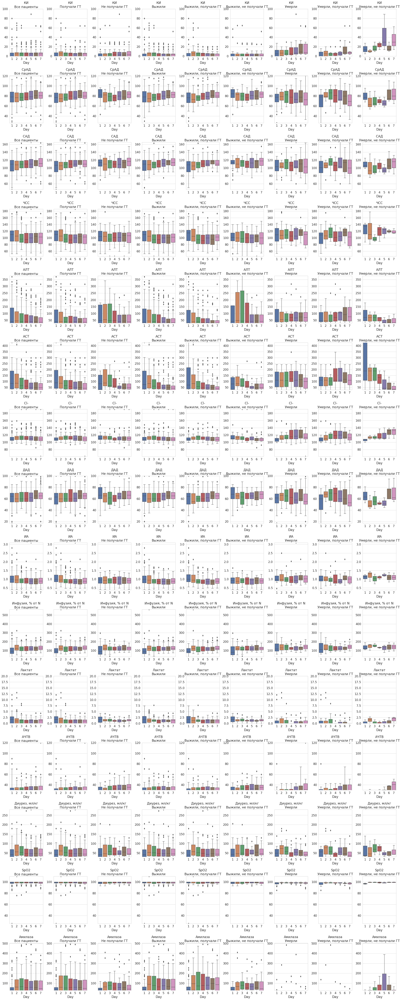

In [21]:
tab_list = [df_all,df_gt,df_nogt, df_surv, df_surv_gt, df_surv_nogt, df_died, df_died_gt, df_died_nogt]
tab_lists = ['Все пациенты','Получали ГТ','Не получали ГТ', 'Выжили', 'Выжили, получали ГТ', 'Выжили, не получали ГТ', 'Умерли', 'Умерли, получали ГТ','Умерли, не получали ГТ']
fig,axis = plt.subplots(15,9,figsize = (30,75))

for k,z in enumerate(params):
    if z!='КИ' and z!='Лактат':
        y_max = df_all[z].max()
        while y_max>(df_all[z].mean()*5):
            y_max = y_max/5
        y_min = df_all[z].min()
        while y_min<(df_all[z].mean()/5):
            y_min = (y_min+1)*5
    elif z=='КИ':
        y_max = 100
        y_min = 0
    elif z=='Лактат':
        y_max = 20
        y_min = 0
    for kk,i in enumerate(tab_list):
        sns.boxplot(x = tab_list[kk]['Day'], y = tab_list[kk][z],orient='vertical',ax=axis[k,kk],).set_ylabel(None)
        axis[k,kk].set_title(f'{z}\n{tab_lists[kk]}')
        axis[k,kk].set_ylim(y_min,y_max)
plt.tight_layout()
plt.show()

* не смотря на то, что на графиках бокс-плот видимой, бросающейся в глаза, разницы не обнаруживается, продолжим графический анализ: проанализируем динамику средних значений

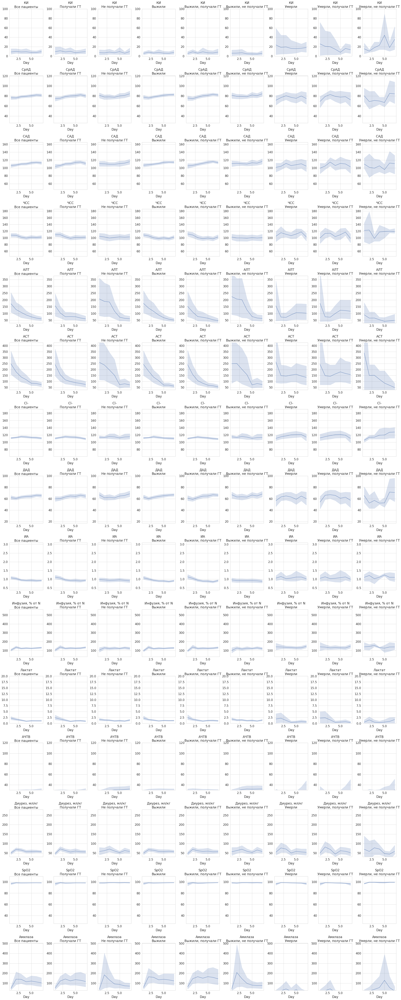

In [22]:
fig,axis = plt.subplots(15,9,figsize = (30,75))
for k,z in enumerate(params):
    if z!='КИ' and z!='Лактат':
        y_max = df_all[z].max()
        while y_max>(df_all[z].mean()*5):
            y_max = y_max/5
        y_min = df_all[z].min()
        while y_min<(df_all[z].mean()/5):
            y_min = (y_min+1)*5
    elif z=='КИ':
        y_max = 100
        y_min = 0
    elif z=='Лактат':
        y_max = 20
        y_min = 0
    for kk,i in enumerate(tab_list):
        sns.lineplot(x = tab_list[kk]['Day'], y = tab_list[kk][z],ax=axis[k,kk],).set_ylabel(None)
        axis[k,kk].set_title(f'{z}\n{tab_lists[kk]}')
        axis[k,kk].set_ylim(y_min,y_max)
plt.tight_layout()
plt.show()

**На графиках светло-голубым цветом обозначены доверительные интервалы средних значений: обращает на себя внимание разные доверительные интервалы средних значений для групп умерших и выживших (у выживших они Уже) и для подгрупп (ГТ+ и ГТ-) в этих же группах (в группах ГТ+ доверительные интервалы также Уже).**<br>
**В связи с этим добавим новые признаки: 2 стандартных отклонения средних значений для каждого параметра в меньшую и большую сторону.**

* сначала без учета p-value посмотрим на медиану, 25 и 75 центили
* затем вычтем из верхней границы межквартильного размаха минимальные и максимальные значения для каждого пациента - и по полученным данным проведем анализ Краскела-Уоллиса на наличие различий между тремя интересующими группами:
    * группа выживших, получавшая ГТ (один из наиболее узких разбросов средних на графиках);
    * выжившие, получавшие ГТ (также достаточно узкий разброс; из-за этого они могут быть "приближены" к выжившим и, возможно, затруднят поиск различий между тремя группами; таким образом, при выявлении различий можно чуть больше доверять полученным результатам)

In [23]:
import warnings
warnings.filterwarnings("ignore")
for i in params:
    i_std_min = str(i+'_std_min')
    i_std_max = str(i+'_std_max')
    for tab in tab_list:
        tab[i_std_min]=0
        tab[i_std_max]=0
        tab.loc[:,i_std_min] = tab[i].mean() - tab[i].std(ddof=1)*2 / np.sqrt(tab.shape[0])
        tab.loc[:,i_std_max] = tab[i].mean() + tab[i].std(ddof=1)*2 / np.sqrt(tab.shape[0])
        
# КИмин,Лактатмин, SPO2max,АЧТВмин, амилаза, САДмин,Хлормин,ДАДмин,СРАДмин, АСТмин,Амилазамакс,амилазамин,хлормакс,лактатмакс
# КИмин,Лактатмин,SPO2max,АЧТВмин,амилаза,САДмин,Хлормин,ДАДмин,СРАДмин, АСТмин,Амилазамакс,амилазамин,хлормакс,лактатмакс,CImax,САДmax,АЛТmin
# КИ,лактат,SpO2,АЧТВ,амилаза,САД,хлор,ДАД,СрАД,АСТ,АЛТ
pd.options.display.max_rows = 350
params2 = df_all.columns[2:].drop(['OUTCOME','GT'])
results2 = []
for day in days:
    for i in params2:
#         if p<0.05:
#             print(i)
#             print(df_all.loc[df_all.Day==day,i].median())
        results2.append([i,day,df_surv_gt.loc[df_surv_gt.Day==day,i].median(),df_surv_gt.loc[df_surv_gt.Day==day,i].quantile(0.25),df_surv_gt.loc[df_surv_gt.Day==day,i].quantile(0.75),\
                        df_died_gt.loc[df_died_gt.Day==day,i].median(),df_died_gt.loc[df_died_gt.Day==day,i].quantile(0.25),df_died_gt.loc[df_died_gt.Day==day,i].quantile(0.75),\
                        df_died_nogt.loc[df_died_nogt.Day==day,i].median(),df_died_nogt.loc[df_died_nogt.Day==day,i].quantile(0.25),df_died_nogt.loc[df_died_nogt.Day==day,i].quantile(0.75)])
#         else:
#             results2.append([i,day,round(p,4)])
result2_df = pd.DataFrame(results2,columns=['Параметр','День','Медиана в группе выживших пациентов ГТ+','25-квантиль в группе выживших пациентов ГТ+','75-квантиль в группе выживших пациентов ГТ+',\
                                           'Медиана в группе умерших пациентов ГТ+','25-квантиль в группе умерших пациентов ГТ+','75-квантили в группе умерших пациентов ГТ+',\
                                           'Медиана в группе умерших пациентов ГТ-','25-квантиль в группе умерших пациентов ГТ-','75-квантили в группе умерших пациентов ГТ-'])
result2_df.groupby('Параметр',as_index=False).mean()[['Параметр','Медиана в группе выживших пациентов ГТ+','25-квантиль в группе выживших пациентов ГТ+','75-квантиль в группе выживших пациентов ГТ+',\
                                           'Медиана в группе умерших пациентов ГТ+','25-квантиль в группе умерших пациентов ГТ+','75-квантили в группе умерших пациентов ГТ+',\
                                           'Медиана в группе умерших пациентов ГТ-','25-квантиль в группе умерших пациентов ГТ-','75-квантили в группе умерших пациентов ГТ-']].sort_values('Параметр')

,Параметр,Медиана в группе выживших пациентов ГТ+,25-квантиль в группе выживших пациентов ГТ+,75-квантиль в группе выживших пациентов ГТ+,Медиана в группе умерших пациентов ГТ+,25-квантиль в группе умерших пациентов ГТ+,75-квантили в группе умерших пациентов ГТ+,Медиана в группе умерших пациентов ГТ-,25-квантиль в группе умерших пациентов ГТ-,75-квантили в группе умерших пациентов ГТ-
0,Cl-,110.000000,105.521429,115.000000,113.534965,107.623876,124.357143,117.328571,112.762787,123.288911
1,Cl-_std_max,112.463360,112.463360,112.463360,120.598545,120.598545,120.598545,123.852853,123.852853,123.852853
2,Cl-_std_min,110.399127,110.399127,110.399127,112.844521,112.844521,112.844521,112.663697,112.663697,112.663697
3,SpO2,99.142857,97.714286,100.000000,98.285714,97.357143,98.785714,98.571429,98.428571,99.142857
4,SpO2_std_max,98.744755,98.744755,98.744755,98.237813,98.237813,98.237813,99.320787,99.320787,99.320787
5,SpO2_std_min,97.680777,97.680777,97.680777,97.112836,97.112836,97.112836,98.393499,98.393499,98.393499
6,АЛТ,34.407143,19.553571,75.914286,68.885714,43.307143,118.178571,55.142857,37.514286,79.260714
7,АЛТ_std_max,101.630837,101.630837,101.630837,150.354012,150.354012,150.354012,77.800417,77.800417,77.800417
8,АЛТ_std_min,64.213844,64.213844,64.213844,74.344690,74.344690,74.344690,41.137678,41.137678,41.137678
9,АСТ,56.528571,33.967857,109.900000,110.857143,78.700000,166.457143,116.971429,71.707143,192.657143


In [24]:
import warnings
warnings.filterwarnings("ignore")
for i in params:
    i_std_min = str(i+'_std_min')
    i_std_max = str(i+'_std_max')
    for tab in tab_list:
        tab[i_std_min]=0
        tab[i_std_max]=0
        for ids in set(tab.ID):
#             tab.loc[tab.ID==ids,i_std_min] = (tab[i].mean() + tab[i].std(ddof=1)*2 / np.sqrt(tab.shape[0])) - tab[tab.ID==ids][i].min()
#             tab.loc[tab.ID==ids,i_std_max] = tab[tab.ID==ids][i].max() - (tab[i].mean() - tab[i].std(ddof=1)*2 / np.sqrt(tab.shape[0]))
            tab.loc[tab.ID==ids,i_std_min] = ((tab[i].mean() + tab[i].std(ddof=1)*2 / np.sqrt(tab.shape[0])) - (tab[i].mean() - tab[i].std(ddof=1)*1.96 / np.sqrt(tab.shape[0]))) - tab[tab.ID==ids][i].min()
            tab.loc[tab.ID==ids,i_std_max] = ((tab[i].mean() + tab[i].std(ddof=1)*2 / np.sqrt(tab.shape[0])) - (tab[i].mean() - tab[i].std(ddof=1)*1.96 / np.sqrt(tab.shape[0]))) - tab[tab.ID==ids][i].max()

**Теперь с помощью метода Краскела-Уоллиса попытаемся определить, есть ли значимые различия между группами пациентов по изучаемым параметрам**<br>
Выбор данного критерия обусловлен непараметрическим распределением данных, независимостью анализируемых выборок (в сформированных группах пациенты не переходят из одной группы в другую) и количеством групп более 2.

In [25]:
# КИмин,Лактатмин, SPO2max,АЧТВмин, амилаза, САДмин,Хлормин,ДАДмин,СРАДмин, АСТмин,Амилазамакс,амилазамин,хлормакс,лактатмакс
# КИмин,Лактатмин,SPO2max,АЧТВмин,амилаза,САДмин,Хлормин,ДАДмин,СРАДмин, АСТмин,Амилазамакс,амилазамин,хлормакс,лактатмакс,CImax,САДmax,АЛТmin
# КИ,лактат,SpO2,АЧТВ,амилаза,САД,хлор,ДАД,СрАД,АСТ,АЛТ
pd.options.display.max_rows = 350
params2 = df_all.columns[2:].drop(['OUTCOME','GT'])
results2 = []
for day in days:
    for i in params2:
        stat, p = stats.kruskal(df_surv_gt.loc[df_surv_gt.Day==day,i],\
                                df_died_gt.loc[df_died_gt.Day==day,i],\
                                df_died_nogt.loc[df_died_nogt.Day==day,i])
#         if p<0.05:
#             print(i)
#             print(df_all.loc[df_all.Day==day,i].median())
        results2.append([i,day,round(p,4),df_surv_gt.loc[df_surv_gt.Day==day,i].median(),df_surv_gt.loc[df_surv_gt.Day==day,i].quantile(0.25),df_surv_gt.loc[df_surv_gt.Day==day,i].quantile(0.75),\
                        df_died_gt.loc[df_died_gt.Day==day,i].median(),df_died_gt.loc[df_died_gt.Day==day,i].quantile(0.25),df_died_gt.loc[df_died_gt.Day==day,i].quantile(0.75),\
                        df_died_nogt.loc[df_died_nogt.Day==day,i].median(),df_died_nogt.loc[df_died_nogt.Day==day,i].quantile(0.25),df_died_nogt.loc[df_died_nogt.Day==day,i].quantile(0.75)])
#         else:
#             results2.append([i,day,round(p,4)])
result2_df = pd.DataFrame(results2,columns=['Параметр','День','p-value','Медиана в группе выживших пациентов ГТ+','25-квантиль в группе выживших пациентов ГТ+','75-квантиль в группе выживших пациентов ГТ+',\
                                           'Медиана в группе умерших пациентов ГТ+','25-квантиль в группе умерших пациентов ГТ+','75-квантили в группе умерших пациентов ГТ+',\
                                           'Медиана в группе умерших пациентов ГТ-','25-квантиль в группе умерших пациентов ГТ-','75-квантили в группе умерших пациентов ГТ-'])
result2_df.groupby('Параметр',as_index=False).mean()[['Параметр','p-value','Медиана в группе выживших пациентов ГТ+','25-квантиль в группе выживших пациентов ГТ+','75-квантиль в группе выживших пациентов ГТ+',\
                                           'Медиана в группе умерших пациентов ГТ+','25-квантиль в группе умерших пациентов ГТ+','75-квантили в группе умерших пациентов ГТ+',\
                                           'Медиана в группе умерших пациентов ГТ-','25-квантиль в группе умерших пациентов ГТ-','75-квантили в группе умерших пациентов ГТ-']].sort_values('p-value')

,Параметр,p-value,Медиана в группе выживших пациентов ГТ+,25-квантиль в группе выживших пациентов ГТ+,75-квантиль в группе выживших пациентов ГТ+,Медиана в группе умерших пациентов ГТ+,25-квантиль в группе умерших пациентов ГТ+,75-квантили в группе умерших пациентов ГТ+,Медиана в группе умерших пациентов ГТ-,25-квантиль в группе умерших пациентов ГТ-,75-квантили в группе умерших пациентов ГТ-
33,КИ_std_min,0.000000,3.913381,-1.086619,3.913381,18.354743,13.854743,18.354743,9.052660,6.052660,10.552660
36,Лактат_std_min,0.000000,-0.400912,-0.650912,0.399088,1.267396,1.267396,1.267396,0.907517,0.407517,0.907517
4,SpO2_std_max,0.000100,-98.946662,-98.946662,-98.446662,-97.886273,-97.886273,-97.886273,-98.081984,-98.581984,-98.081984
14,АЧТВ_std_min,0.000400,-23.076551,-26.076551,-20.076551,10.460938,-20.039062,10.460938,-10.512106,-12.012106,1.987894
15,Амилаза,0.001129,79.228571,26.328571,160.578571,0.000000,0.000000,0.000000,0.000000,0.000000,72.239286
41,САД_std_min,0.006000,-96.760933,-102.260933,-86.760933,-81.529686,-90.029686,-57.029686,-73.584752,-83.084752,-66.584752
21,ДАД_std_min,0.011100,-47.236316,-57.236316,-42.236316,-35.958460,-49.458460,-21.958460,-30.030727,-36.530727,-30.030727
2,Cl-_std_min,0.015900,-101.956409,-104.956409,-98.406409,-94.323516,-102.195893,-91.823516,-96.922735,-97.295113,-92.922735
44,СрАД_std_min,0.017400,-66.256362,-71.256362,-58.923029,-52.134762,-64.801429,-33.968095,-45.108948,-54.608948,-42.775614
11,АСТ_std_min,0.019400,15.973645,-1.676355,25.523645,9.943667,-6.556333,62.443667,122.821070,93.071070,125.471070


* В данном случае выявлено, что минимальные и максимальные значения достоверно различаются для разных групп для целого ряда параметров:
    * катехоламиновый индекс, концентрация лактата,
    * SpO2
    * АЧТВ
    * амилаза крови
    * систолическое артериальное давление
    * диастолическое артериальное давление
    * среднее артериальное давление
    * хлор
    * АСТ
    * АЛТ

Далее мы проведем поиск и анализ данных пациентов, значения параметров у которых "выбиваются" из ДИ среднего наиболее часто (использован порог 2/3 записей), т.е. будет предпринята попытка статистического анализа различий между выжившими и умершими пациентами, а также пациентами ГТ+ и ГТ-, которые наиболее сильно отклоняются от средних значений исследуемых параметров в своих группах; возможно, будет обнаружено значительное различие, например, в случае отклонения значений умерших пациентов в меньшую от среднего сторону, а выживших - в большую сторону от среднего значения.

Сначала составлен список пациентов, значения которых отклонялись более, чем на 1,96std

In [26]:
results3 = []
for k,tab in enumerate(tab_list):
    for patient in tab.ID.unique():
        for day in days:
            checks_true = []
            checks_false = []
            for param in params:
                std = tab.loc[tab['Day']==day,param].std(ddof=1)
                mean = tab.loc[tab['Day']==day,param].mean()
                if mean-1.96*std/np.sqrt(tab[tab['Day']==day].shape[0]) <= tab.loc[(tab['Day']==day)&(tab['ID']==patient),param].values < mean+1.96*std/np.sqrt(tab[tab['Day']==day].shape[0]):
                    checks_true.append(param)
                else:
                    checks_false.append(param)
            results3.append([tab_lists[k],patient,day,checks_true,checks_false])

In [27]:
results3_df = pd.DataFrame(results3, columns = ['Группа пациентов','ID пациента','День лечения','Параметр в пределах среднее +/- 1.96std','Параметры за пределами среднее +/-1.96std'])
results3_df['Количество параметров за пределами 1.96std'] = [len(i) for i in results3_df['Параметры за пределами среднее +/-1.96std']]
results3_df.head()

,Группа пациентов,ID пациента,День лечения,Параметр в пределах среднее +/- 1.96std,Параметры за пределами среднее +/-1.96std,Количество параметров за пределами 1.96std
0,Все пациенты,3,1,"[АЧТВ, Диурез, мл/кг, Амилаза]","[КИ, СрАД, САД, ЧСС, АЛТ, АСТ, Cl-, ДАД, ИА, И...",12
1,Все пациенты,3,2,[Амилаза],"[КИ, СрАД, САД, ЧСС, АЛТ, АСТ, Cl-, ДАД, ИА, И...",14
2,Все пациенты,3,3,"[Инфузия, % от N, АЧТВ]","[КИ, СрАД, САД, ЧСС, АЛТ, АСТ, Cl-, ДАД, ИА, Л...",13
3,Все пациенты,3,4,"[СрАД, САД, ЧСС, АСТ, ДАД, АЧТВ, Амилаза]","[КИ, АЛТ, Cl-, ИА, Инфузия, % от N, Лактат, Ди...",8
4,Все пациенты,3,5,"[СрАД, САД, АСТ, ДАД, АЧТВ]","[КИ, ЧСС, АЛТ, Cl-, ИА, Инфузия, % от N, Лакта...",10


In [28]:
print("Количество значений, отклоняющихся от среднего более, чем на 1.96 std в группе ГТ-")
results3_df[results3_df['Группа пациентов']=='Не получали ГТ'].sort_values('Количество параметров за пределами 1.96std',ascending=False)['Количество параметров за пределами 1.96std'].sum()

Количество значений, отклоняющихся от среднего более, чем на 1.96 std в группе ГТ-


1696

In [29]:
print("Количество значений, отклоняющихся от среднего более, чем на 1.96 std в группе ГТ+")
results3_df[results3_df['Группа пациентов']=='Получали ГТ'].sort_values('Количество параметров за пределами 1.96std',ascending=False)['Количество параметров за пределами 1.96std'].sum()

Количество значений, отклоняющихся от среднего более, чем на 1.96 std в группе ГТ+


4573

Также получен список пациентов, значения которых отклонялись на 1std от среднего

In [30]:
results4 = []
for k,tab in enumerate(tab_list):
    for patient in tab.ID.unique():
        for day in days:
            checks_true = []
            checks_false = []
            for param in params:
                std = tab.loc[tab['Day']==day,param].std(ddof=1)
                mean = tab.loc[tab['Day']==day,param].mean()
                if mean-1*std/np.sqrt(tab[tab['Day']==day].shape[0]) <= tab.loc[(tab['Day']==day)&(tab['ID']==patient),param].values < mean+1*std/np.sqrt(tab[tab['Day']==day].shape[0]):
                    checks_true.append(param)
                else:
                    checks_false.append(param)
            results4.append([tab_lists[k],patient,day,checks_true,checks_false])

In [31]:
results4_df = pd.DataFrame(results4, columns = ['Группа пациентов','ID пациента','День лечения','Параметр в пределах среднее +/- 1std','Параметры за пределами среднее +/-1std'])
results4_df['Количество параметров за пределами 1std'] = [len(i) for i in results4_df['Параметры за пределами среднее +/-1std']]
results4_df.head()

,Группа пациентов,ID пациента,День лечения,Параметр в пределах среднее +/- 1std,Параметры за пределами среднее +/-1std,Количество параметров за пределами 1std
0,Все пациенты,3,1,"[АЧТВ, Диурез, мл/кг]","[КИ, СрАД, САД, ЧСС, АЛТ, АСТ, Cl-, ДАД, ИА, И...",13
1,Все пациенты,3,2,[],"[КИ, СрАД, САД, ЧСС, АЛТ, АСТ, Cl-, ДАД, ИА, И...",15
2,Все пациенты,3,3,"[Инфузия, % от N]","[КИ, СрАД, САД, ЧСС, АЛТ, АСТ, Cl-, ДАД, ИА, Л...",14
3,Все пациенты,3,4,"[СрАД, АСТ, ДАД, Амилаза]","[КИ, САД, ЧСС, АЛТ, Cl-, ИА, Инфузия, % от N, ...",11
4,Все пациенты,3,5,"[СрАД, САД, АСТ, ДАД]","[КИ, ЧСС, АЛТ, Cl-, ИА, Инфузия, % от N, Лакта...",11


In [32]:
print("Количество значений, отклоняющихся от среднего более, чем на 1 std в группе ГТ-")
results4_df[results4_df['Группа пациентов']=='Не получали ГТ'].sort_values('Количество параметров за пределами 1std',ascending=False)['Количество параметров за пределами 1std'].sum()

Количество значений, отклоняющихся от среднего более, чем на 1 std в группе ГТ-


2127

In [33]:
print("Количество значений, отклоняющихся от среднего более, чем на 1 std в группе ГТ+")
results4_df[results4_df['Группа пациентов']=='Получали ГТ'].sort_values('Количество параметров за пределами 1std',ascending=False)['Количество параметров за пределами 1std'].sum()

Количество значений, отклоняющихся от среднего более, чем на 1 std в группе ГТ+


5331

In [34]:
print(f'{len(params)} параметров\n{df_gt.ID.nunique()} пациентов получали ГТ\n{df_nogt.ID.nunique()} пациентов не получали ГТ')

15 параметров
58 пациентов получали ГТ
24 пациентов не получали ГТ


**Итак: всего 15 наблюдаемых параметров**
- Интервал 1,96 сигмы:

**В группе не получавших ГТ: 24 пациентов** - и в ней всего 1655 из 15х24х7=2520 (т.е. 65.67%)  записей не попадают в пределы средних значений.<br>
**В группе, получавшей ГТ: 58 пациента** - и в ней всего 4431 из 15(параметров)х58(пациентов)х7(дней)=6090 (т.е. 72.76%) записей не попадают в пределы средних значений

- Интервал 1 сигма:

**В группе не получавших ГТ: 24 пациентов** - и в ней всего 2092 из 15х24х7=2520 (т.е. 83.02%)  записей не попадают в пределы средних значений.<br>
**В группе, получавшей ГТ: 58 пациента** - и в ней всего 5249 из 15(параметров)х58(пациентов)х7(дней)=6090 (т.е. 86.19%) записей не попадают в пределы средних значений

- Т.о. порядка 65-86% записей пациентов, получавших ГТ и не получавших ГТ сильно "оторваны" от других записей (т.е. расстояние между ними больше или равно 1 сигме); при этом в более узком нормальном распределении наблюдается около 68% значений в пределах 1 сигмы от наблюдаемого среднего - и, соответственно, только 32% за пределами 1 сигмы.
- Это еще раз подтверждает непараметричность распределения исследуемых значений;
- Это же свидетельствует о значительных колебаниях параметров пациентов в каждой группе, а значит, пациенты в разные дни имеют разные характеристики, и результаты ранее проведенного теста Фридмана также заслуживают доверия.

**Ниже мы посмотрим, что это за пациенты: сколько параметров у каждого из них отстоит слишком далеко от среднего по выборке (т.е. "группе").**

In [35]:
a = results3_df[results3_df['Группа пациентов']=='Получали ГТ'].sort_values('Количество параметров за пределами 1.96std',ascending=False).groupby(['ID пациента','День лечения'],as_index=False)['Количество параметров за пределами 1.96std'].sum()
# a.head(50)

In [36]:
b = results3_df[results3_df['Группа пациентов']=='Не получали ГТ'].sort_values('Количество параметров за пределами 1.96std',ascending=False).groupby(['ID пациента','День лечения'],as_index=False)['Количество параметров за пределами 1.96std'].sum()
# b

In [37]:
a = a.rename(columns={'ID пациента':'ID'}).groupby('ID',as_index=False).sum().sort_values('Количество параметров за пределами 1.96std')[['ID','Количество параметров за пределами 1.96std']].merge(df.groupby('ID',as_index=False)[['Day','OUTCOME']].max(),on='ID',how='left')
a['Количество записей'] = 15 * a['Day']
a['За переделами ДИ, %'] = a['Количество параметров за пределами 1.96std'] * 100 / a['Количество записей']
print('Группа ГТ+')
a.sort_values('За переделами ДИ, %',ascending=False)

Группа ГТ+


,ID,Количество параметров за пределами 1.96std,Day,OUTCOME,Количество записей,"За переделами ДИ, %"
51,125,90,7,Survived,105,85.714286
50,121,89,7,Survived,105,84.761905
48,94,88,7,Died,105,83.809524
47,49,87,7,Survived,105,82.857143
57,201,99,8,Survived,120,82.500000
43,128,85,7,Died,105,80.952381
45,122,85,7,Died,105,80.952381
55,79,95,8,Died,120,79.166667
40,8,83,7,Survived,105,79.047619
36,6,82,7,Survived,105,78.095238


* Если исключить первый день, виден его вклад в общее количество отклонившихся от среднего группы параметров: % значений с сильным отклонением от ДИ заметно падает

In [38]:
a_non1 = results3_df.loc[(results3_df['Группа пациентов']=='Получали ГТ')&(results3_df['День лечения']>1),:].sort_values('Количество параметров за пределами 1.96std',ascending=False).groupby(['ID пациента','День лечения'],as_index=False)['Количество параметров за пределами 1.96std'].sum()
a_non1 = a_non1.rename(columns={'ID пациента':'ID'}).groupby('ID',as_index=False).sum().sort_values('Количество параметров за пределами 1.96std')[['ID','Количество параметров за пределами 1.96std']].merge(df.groupby('ID',as_index=False)[['Day','OUTCOME']].max(),on='ID',how='left')
a_non1['Количество записей'] = 15 * a_non1['Day']
a_non1['За переделами ДИ, %'] = a_non1['Количество параметров за пределами 1.96std'] * 100 / a_non1['Количество записей']
print('Группа ГТ+')
a_non1.sort_values('За переделами ДИ, %',ascending=False)

Группа ГТ+


,ID,Количество параметров за пределами 1.96std,Day,OUTCOME,Количество записей,"За переделами ДИ, %"
54,125,80,7,Survived,105,76.190476
49,94,77,7,Died,105,73.333333
47,121,76,7,Survived,105,72.380952
56,201,85,8,Survived,120,70.833333
45,49,74,7,Survived,105,70.476190
44,8,73,7,Survived,105,69.523810
39,128,72,7,Died,105,68.571429
40,122,72,7,Died,105,68.571429
55,79,82,8,Died,120,68.333333
34,6,70,7,Survived,105,66.666667


In [39]:
print('Группа ГТ-')
b = b.rename(columns={'ID пациента':'ID'}).groupby('ID',as_index=False).sum().sort_values('Количество параметров за пределами 1.96std')[['ID','Количество параметров за пределами 1.96std']].merge(df.groupby('ID',as_index=False)[['Day','OUTCOME']].max(),on='ID',how='left')
b['Количество записей'] = 15 * b['Day']
b['За переделами ДИ, %'] = a['Количество параметров за пределами 1.96std'] * 100 / a['Количество записей']
b.sort_values('За переделами ДИ, %',ascending=False)

Группа ГТ-


,ID,Количество параметров за пределами 1.96std,Day,OUTCOME,Количество записей,"За переделами ДИ, %"
9,93,67,11,Died,165,68.571429
6,99,63,8,Survived,120,65.714286
20,45,79,8,Survived,120,62.500000
19,211,77,11,Survived,165,62.500000
12,75,71,12,Survived,180,60.833333
14,62,74,35,Survived,525,60.833333
17,66,77,8,Died,120,60.833333
11,83,69,12,Survived,180,60.000000
4,46,62,8,Survived,120,55.833333
16,47,75,8,Survived,120,54.074074


In [40]:
b_non1 = results3_df.loc[(results3_df['Группа пациентов']=='Не получали ГТ')&(results3_df['День лечения']>1),:].sort_values('Количество параметров за пределами 1.96std',ascending=False).groupby(['ID пациента','День лечения'],as_index=False)['Количество параметров за пределами 1.96std'].sum()
b_non1 = b_non1.rename(columns={'ID пациента':'ID'}).groupby('ID',as_index=False).sum().sort_values('Количество параметров за пределами 1.96std')[['ID','Количество параметров за пределами 1.96std']].merge(df.groupby('ID',as_index=False)[['Day','OUTCOME']].max(),on='ID',how='left')
b_non1['Количество записей'] = 15 * b_non1['Day']
b_non1['За переделами ДИ, %'] = b_non1['Количество параметров за пределами 1.96std'] * 100 / b_non1['Количество записей']
print('Группа ГТ- (без данных за 1й день)')
b_non1.sort_values('За переделами ДИ, %',ascending=False)

Группа ГТ- (без данных за 1й день)


,ID,Количество параметров за пределами 1.96std,Day,OUTCOME,Количество записей,"За переделами ДИ, %"
20,54,69,7,Survived,105,65.714286
12,129,62,7,Died,105,59.047619
19,66,69,8,Died,120,57.500000
17,45,66,8,Survived,120,55.000000
22,29,72,9,Survived,135,53.333333
7,115,55,7,Survived,105,52.380952
15,47,62,8,Survived,120,51.666667
5,7,54,7,Survived,105,51.428571
21,82,69,9,Survived,135,51.111111
9,51,57,8,Survived,120,47.500000


- анализируемые пациенты лечились не менее 7 дней; исследуются 15 параметров, значит, каждый из них имел как минимум 7*15 записей (=105).

In [41]:
patients = a[a['За переделами ДИ, %']>35]['ID'].unique()
df.loc[df.ID.isin(patients),['ID','OUTCOME']].groupby('ID').min().sort_values('OUTCOME').value_counts()

OUTCOME 
Survived    32
Died         9
dtype: int64

* 9 из 11 умерших пациентов, получавших ГТ, отклонялись на 1.96 и более сигм от среднего своей группы (т.е. группы, получавшей ГТ) по более чем 35% параметров; при этом мы проанализировали всего 14 умерших пациентов (остальные умерли ранее 7 дня или не получали ГТ); выживших в этом списке - 31 человек (всего - 47; см. подробный состав групп в начале).
* далее мы отдельно проанализируем и сравним этих 9 умерших и 31 выживших пациента

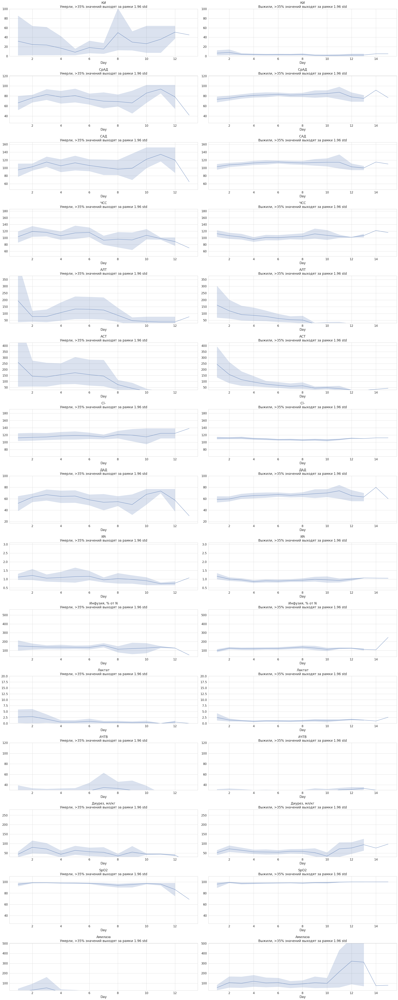

In [42]:
tab_list = [df.loc[(df.ID.isin(patients))&(df.OUTCOME=='Died'),:],df.loc[(df.ID.isin(patients))&(df.OUTCOME=='Survived'),:]]
tab_lists = ['Умерли, >35% значений выходят за рамки 1.96 std','Выжили, >35% значений выходят за рамки 1.96 std']
fig,axis = plt.subplots(15,2,figsize = (30,75))
for k,z in enumerate(params):
    if z!='КИ' and z!='Лактат':
        y_max = df_all[z].max()
        while y_max>(df_all[z].mean()*5):
            y_max = y_max/5
        y_min = df_all[z].min()
        while y_min<(df_all[z].mean()/5):
            y_min = (y_min+1)*5
    elif z=='КИ':
        y_max = 100
        y_min = 0
    elif z=='Лактат':
        y_max = 20
        y_min = 0
    for kk,i in enumerate(tab_list):
        sns.lineplot(x = tab_list[kk]['Day'], y = tab_list[kk][z],ax=axis[k,kk],).set_ylabel(None)
        axis[k,kk].set_title(f'{z}\n{tab_lists[kk]}')
        axis[k,kk].set_ylim(y_min,y_max)
plt.tight_layout()
plt.show()

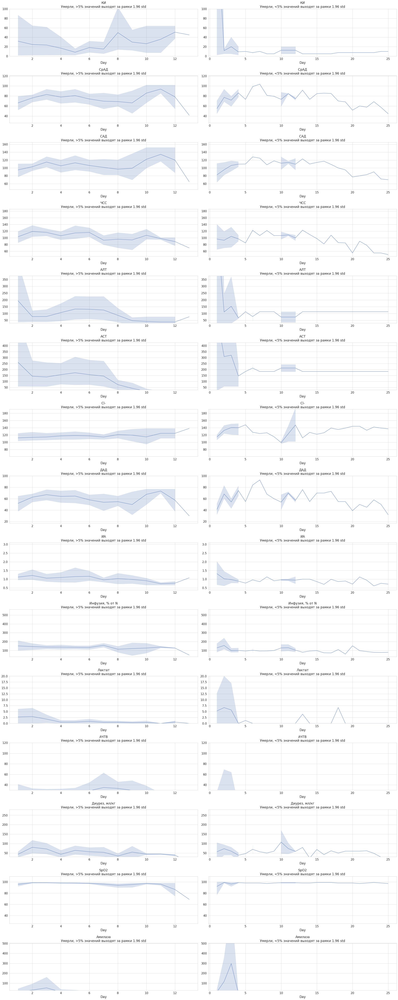

In [43]:
tab_list = [df.loc[(df.ID.isin(patients))&(df.OUTCOME=='Died'),:],df.loc[(~df.ID.isin(patients))&(df.OUTCOME=='Died')&(df.GT==1),:]]
tab_lists = ['Умерли, >5% значений выходят за рамки 1.96 std','Умерли, <5% значений выходят за рамки 1.96 std']
fig,axis = plt.subplots(15,2,figsize = (30,75))
for k,z in enumerate(params):
    if z!='КИ' and z!='Лактат':
        y_max = df_all[z].max()
        while y_max>(df_all[z].mean()*5):
            y_max = y_max/5
        y_min = df_all[z].min()
        while y_min<(df_all[z].mean()/5):
            y_min = (y_min+1)*5
    elif z=='КИ':
        y_max = 100
        y_min = 0
    elif z=='Лактат':
        y_max = 20
        y_min = 0
    for kk,i in enumerate(tab_list):
        sns.lineplot(x = tab_list[kk]['Day'], y = tab_list[kk][z],ax=axis[k,kk],).set_ylabel(None)
        axis[k,kk].set_title(f'{z}\n{tab_lists[kk]}')
        axis[k,kk].set_ylim(y_min,y_max)
plt.tight_layout()
plt.show()

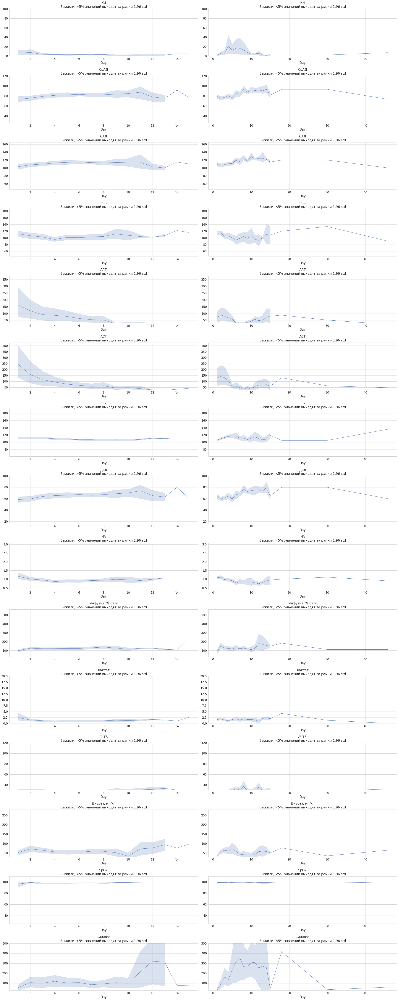

In [44]:
tab_list = [df.loc[(df.ID.isin(patients))&(df.OUTCOME=='Survived'),:],df.loc[(~df.ID.isin(patients))&(df.OUTCOME=='Survived')&(df.GT==1),:]]
tab_lists = ['Выжили, >5% значений выходят за рамки 1.96 std','Выжили, <5% значений выходят за рамки 1.96 std']
fig,axis = plt.subplots(15,2,figsize = (30,75))
for k,z in enumerate(params):
    if z!='КИ' and z!='Лактат':
        y_max = df_all[z].max()
        while y_max>(df_all[z].mean()*5):
            y_max = y_max/5
        y_min = df_all[z].min()
        while y_min<(df_all[z].mean()/5):
            y_min = (y_min+1)*5
    elif z=='КИ':
        y_max = 100
        y_min = 0
    elif z=='Лактат':
        y_max = 20
        y_min = 0
    for kk,i in enumerate(tab_list):
        sns.lineplot(x = tab_list[kk]['Day'], y = tab_list[kk][z],ax=axis[k,kk],).set_ylabel(None)
        axis[k,kk].set_title(f'{z}\n{tab_lists[kk]}')
        axis[k,kk].set_ylim(y_min,y_max)
plt.tight_layout()
plt.show()

In [45]:
# Умершие и получавшие ГТ, выходящие >35% раз за пределы 1.96 std
df.loc[(df.ID.isin(patients))&(df.OUTCOME=='Died'),params].describe().T

,count,mean,std,min,25%,50%,75%,max
КИ,81.0,24.203704,44.244829,0.000000,4.000000,7.500000,20.000000,246.000000
СрАД,81.0,74.962963,20.015827,26.333333,60.000000,75.666667,90.000000,120.666667
САД,81.0,105.802469,26.448261,45.000000,89.000000,102.000000,120.000000,165.000000
ЧСС,81.0,106.716049,25.233031,41.000000,95.000000,105.000000,121.000000,186.000000
АЛТ,81.0,107.038272,164.535558,0.000000,42.800000,66.000000,112.000000,1293.200000
АСТ,81.0,138.992593,230.256034,0.000000,38.000000,104.000000,120.500000,1678.400000
Cl-,81.0,116.684667,15.616053,93.000000,108.744756,111.000000,124.000000,159.000000
ДАД,81.0,59.543210,17.674169,17.000000,50.000000,60.000000,75.000000,99.000000
ИА,81.0,1.071906,0.419976,0.512500,0.811966,1.000000,1.196078,3.100000
"Инфузия, % от N",81.0,137.262723,49.689497,11.952941,107.954545,133.058824,167.058824,300.176471


In [46]:
# Умершие и получавшие ГТ, выходящие <35% раз за пределы 1.96 std
zz = df.loc[(~df.ID.isin(patients))&(df.OUTCOME=='Died')&(df.GT==1),'ID'].unique()
df.loc[df['ID'].isin(zz),params].describe().T

,count,mean,std,min,25%,50%,75%,max
КИ,51.0,31.649020,134.363695,0.000000,5.000000,7.500000,12.500000,956.600000
СрАД,51.0,72.660131,15.457970,43.333333,60.166667,73.333333,85.000000,105.333333
САД,51.0,101.392157,18.328206,60.000000,90.000000,108.000000,115.000000,136.000000
ЧСС,51.0,97.156863,23.931045,50.000000,85.000000,98.000000,110.000000,160.000000
АЛТ,51.0,150.007843,396.617281,0.000000,37.000000,113.000000,113.000000,2865.000000
АСТ,51.0,249.749020,359.553565,0.000000,135.750000,183.000000,241.000000,2458.300000
Cl-,51.0,123.962745,20.895329,60.600000,107.000000,122.000000,139.000000,193.000000
ДАД,51.0,58.294118,15.811760,30.000000,46.500000,58.000000,70.000000,93.000000
ИА,51.0,0.981681,0.310853,0.464000,0.834250,0.939759,1.004505,2.285714
"Инфузия, % от N",51.0,106.096787,36.034563,22.773279,81.849436,98.082192,124.295094,238.833333


In [47]:
# Выжившие и получавшие ГТ, выходящие >35% раз за пределы 1.96 std
df.loc[(df.ID.isin(patients))&(df.OUTCOME=='Survived'),params].describe().T

,count,mean,std,min,25%,50%,75%,max
КИ,279.0,4.144301,8.788512,0.000000,0.000000,2.000000,5.000000,80.000000
СрАД,279.0,80.274791,12.665000,30.000000,72.666667,78.333333,88.333333,117.666667
САД,279.0,111.240143,14.905809,50.000000,100.000000,110.000000,120.000000,163.000000
ЧСС,279.0,103.917563,22.993517,60.000000,89.000000,102.000000,117.000000,173.000000
АЛТ,279.0,82.555018,166.169682,0.000000,18.000000,32.100000,77.500000,1885.200000
АСТ,279.0,103.561470,191.853238,0.000000,30.775000,48.800000,93.150000,1958.500000
Cl-,279.0,109.051594,7.113460,93.000000,104.000000,109.000000,113.000000,140.000000
ДАД,279.0,64.792115,12.819155,20.000000,55.000000,65.000000,70.000000,100.000000
ИА,279.0,0.959554,0.299938,0.461538,0.779661,0.916667,1.073684,2.800000
"Инфузия, % от N",279.0,122.037904,40.138101,0.000000,95.163564,118.750000,140.501773,248.226950


In [48]:
# Выжившие и получавшие ГТ, выходящие <35% раз за пределы 1.96 std
zz = df.loc[(~df.ID.isin(patients))&(df.OUTCOME=='Survived')&(df.GT==1),'ID'].unique()
df.loc[df['ID'].isin(zz),params].describe().T

,count,mean,std,min,25%,50%,75%,max
КИ,539.0,6.895195,16.636284,0.000000,0.000000,5.000000,7.000000,199.200000
СрАД,539.0,82.324675,11.341655,40.000000,73.666667,83.333333,90.000000,116.666667
САД,539.0,113.445269,13.522330,70.000000,105.000000,115.000000,120.000000,170.000000
ЧСС,539.0,107.597403,23.253318,24.000000,90.000000,110.000000,120.000000,180.000000
АЛТ,539.0,62.866030,103.634318,0.000000,24.800000,39.200000,62.000000,1260.700000
АСТ,539.0,83.116883,171.055642,0.000000,30.900000,47.000000,71.450000,2130.600000
Cl-,539.0,111.630740,11.806822,31.000000,104.000000,108.744756,115.500000,169.000000
ДАД,539.0,66.764378,11.686827,5.000000,60.000000,67.000000,75.000000,110.000000
ИА,539.0,0.966743,0.267056,0.200000,0.781385,0.923077,1.097619,2.133333
"Инфузия, % от N",539.0,128.060960,62.974068,14.166667,96.604167,118.333333,143.875000,647.916667


* Выше проанализированны данные о пациентах за все дни;
* теперь же проведем анализ данных за первые 7 дней, как это было сделано выше, но с разделением на 4 группы: выжившие и умершие, получавшие и не получавшие ГТ

In [49]:
pd.options.display.max_rows = 350
params2 = df_all.columns[1:].drop(['OUTCOME','GT'])
results5 = []
df1 = df_all.loc[(df_all.ID.isin(patients))&(df_all.OUTCOME=='Survived')&(df.GT==1),params2] # выжили, имели >35% случаев отклонения более 1.96*std
df2 = df_all.loc[(df_all.ID.isin(patients))&(df_all.OUTCOME=='Died')&(df.GT==1),params2] # умерли, имели >35% случаев отклонения более 1.96*std
df3 = df_all.loc[(df_all.ID.isin(patients))&(df_all.OUTCOME=='Survived')&(df.GT==0),params2] # выжили, имели <35% случаев отклонения более 1.96*std
df4 = df_all.loc[(df_all.ID.isin(patients))&(df_all.OUTCOME=='Died')&(df.GT==0),params2] # умерли, имели <35% случаев отклонения более 2*std
for tab in [df1,df2,df3,df4]:
    for i in params:
            i_std_min = str(i+'_std_min')
            i_std_max = str(i+'_std_max')
            tab.loc[:,i_std_min] = tab[i].mean() - tab[i].std(ddof=1)*2 / np.sqrt(tab.shape[0])
            tab.loc[:,i_std_max] = tab[i].mean() + tab[i].std(ddof=1)*2 / np.sqrt(tab.shape[0])

for i in params2:
    results5.append([i,\
                   df1.loc[:,i].median(),df1.loc[:,i].quantile(0.25),df1.loc[:,i].quantile(0.75),\
                   df2.loc[:,i].median(),df2.loc[:,i].quantile(0.25),df2.loc[:,i].quantile(0.75),\
                   df3.loc[:,i].median(),df3.loc[:,i].quantile(0.25),df3.loc[:,i].quantile(0.75),\
                   df4.loc[:,i].median(),df4.loc[:,i].quantile(0.25),df4.loc[:,i].quantile(0.75)])
#             print('Разница не доказана:',p)
results5_df = pd.DataFrame(results5,columns=['Параметр','Медиана в группе выживших ГТ+ с отклонениями >35% (1)','25-квантиль в группе выживших с отклонениями >35% (1)','75-квантили в группе выживших с отклонениями >35% (1)',\
                                            'Медиана в группе умерших ГТ+ с отклонениями >35% (2)','25-квантиль в группе умерших с отклонениями >35% (2)','75-квантили в группе умерших с отклонениями >35% (2)',\
                                            'Медиана в группе выживших ГТ- с отклонениями >35% (3)','25-квантиль в группе выживших с отклонениями >35% (3)','75-квантили в группе выживших с отклонениями >35% (3)',\
                                            'Медиана в группе умерших ГТ- с отклонениями >35% (4)','25-квантиль в группе умерших с отклонениями >35% (4)','75-квантили в группе умерших с отклонениями >35% (4)'])
results5_df.groupby('Параметр',as_index=False).mean().sort_values('Параметр')

,Параметр,Медиана в группе выживших ГТ+ с отклонениями >35% (1),25-квантиль в группе выживших с отклонениями >35% (1),75-квантили в группе выживших с отклонениями >35% (1),Медиана в группе умерших ГТ+ с отклонениями >35% (2),25-квантиль в группе умерших с отклонениями >35% (2),75-квантили в группе умерших с отклонениями >35% (2),Медиана в группе выживших ГТ- с отклонениями >35% (3),25-квантиль в группе выживших с отклонениями >35% (3),75-квантили в группе выживших с отклонениями >35% (3),Медиана в группе умерших ГТ- с отклонениями >35% (4),25-квантиль в группе умерших с отклонениями >35% (4),75-квантили в группе умерших с отклонениями >35% (4)
0,Cl-,109.250000,104.625000,115.000000,111.500000,107.872378,125.500000,108.000000,104.000000,113.000000,110.000000,107.875000,115.875000
1,Cl-_std_max,111.190536,111.190536,111.190536,122.951405,122.951405,122.951405,110.783806,110.783806,110.783806,114.373224,114.373224,114.373224
2,Cl-_std_min,108.624460,108.624460,108.624460,112.558272,112.558272,112.558272,107.611092,107.611092,107.611092,106.076776,106.076776,106.076776
3,Day,3.000000,2.000000,5.000000,3.000000,2.000000,5.500000,5.000000,3.000000,6.000000,5.000000,3.750000,6.000000
4,SpO2,99.000000,97.000000,100.000000,98.000000,97.000000,99.000000,99.000000,97.000000,100.000000,98.000000,98.000000,99.000000
5,SpO2_std_max,98.676056,98.676056,98.676056,98.182675,98.182675,98.182675,98.905699,98.905699,98.905699,98.882580,98.882580,98.882580
6,SpO2_std_min,96.149340,96.149340,96.149340,96.375464,96.375464,96.375464,98.033077,98.033077,98.033077,97.117420,97.117420,97.117420
7,АЛТ,56.850000,20.250000,129.875000,66.000000,42.800000,189.850000,27.100000,18.000000,44.937500,44.900000,37.625000,108.250000
8,АЛТ_std_max,166.050454,166.050454,166.050454,211.536627,211.536627,211.536627,68.466008,68.466008,68.466008,89.173500,89.173500,89.173500
9,АЛТ_std_min,84.197959,84.197959,84.197959,80.751745,80.751745,80.751745,38.919706,38.919706,38.919706,43.296500,43.296500,43.296500


In [50]:
import warnings
warnings.filterwarnings("ignore")
for i in params:
    i_std_min = str(i+'_std_min')
    i_std_max = str(i+'_std_max')
    for ids in set(df_all.ID):
#             tab.loc[tab.ID==ids,i_std_min] = (tab[i].mean() + tab[i].std(ddof=1)*2 / np.sqrt(tab.shape[0])) - tab[tab.ID==ids][i].min()
#             tab.loc[tab.ID==ids,i_std_max] = tab[tab.ID==ids][i].max() - (tab[i].mean() - tab[i].std(ddof=1)*2 / np.sqrt(tab.shape[0]))
        df_all.loc[df_all.ID==ids,i_std_min] = ((df_all[i].mean() + df_all[i].std(ddof=1)*2 / np.sqrt(df_all.shape[0])) - (df_all[i].mean() - df_all[i].std(ddof=1)*1.96 / np.sqrt(df_all.shape[0]))) - df_all[df_all.ID==ids][i].min()
        df_all.loc[df_all.ID==ids,i_std_max] = ((df_all[i].mean() + df_all[i].std(ddof=1)*2 / np.sqrt(df_all.shape[0])) - (df_all[i].mean() - df_all[i].std(ddof=1)*1.96 / np.sqrt(df_all.shape[0]))) - df_all[df_all.ID==ids][i].max()

pd.options.display.max_rows = 350
params2 = df_all.columns[1:].drop(['OUTCOME','GT'])
results5 = []
df1 = df_all.loc[(df_all.ID.isin(patients))&(df_all.OUTCOME=='Survived')&(df.GT==1),params2] # выжили, имели >35% случаев отклонения более 1.96*std
df2 = df_all.loc[(df_all.ID.isin(patients))&(df_all.OUTCOME=='Died')&(df.GT==1),params2] # умерли, имели >35% случаев отклонения более 1.96*std
df3 = df_all.loc[(df_all.ID.isin(patients))&(df_all.OUTCOME=='Survived')&(df.GT==0),params2] # выжили, имели <35% случаев отклонения более 1.96*std
df4 = df_all.loc[(df_all.ID.isin(patients))&(df_all.OUTCOME=='Died')&(df.GT==0),params2] # умерли, имели <35% случаев отклонения более 2*std
for i in params2:
    stat, p = stats.kruskal(df1.loc[:,i],df2.loc[:,i],df3.loc[:,i],df4.loc[:,i])
#         print('*'*50)
#         print(i)
    results5.append([i,round(p,4),\
                   df1.loc[:,i].median(),df1.loc[:,i].quantile(0.25),df1.loc[:,i].quantile(0.75),\
                   df2.loc[:,i].median(),df2.loc[:,i].quantile(0.25),df2.loc[:,i].quantile(0.75),\
                   df3.loc[:,i].median(),df3.loc[:,i].quantile(0.25),df3.loc[:,i].quantile(0.75),\
                   df4.loc[:,i].median(),df4.loc[:,i].quantile(0.25),df4.loc[:,i].quantile(0.75)])
#             print('Разница не доказана:',p)
results5_df = pd.DataFrame(results5,columns=['Параметр','p-value','Медиана в группе выживших ГТ+ с отклонениями >35% (1)','25-квантиль в группе выживших с отклонениями >35% (1)','75-квантили в группе выживших с отклонениями >35% (1)',\
                                            'Медиана в группе умерших ГТ+ с отклонениями >35% (2)','25-квантиль в группе умерших с отклонениями >35% (2)','75-квантили в группе умерших с отклонениями >35% (2)',\
                                            'Медиана в группе выживших ГТ- с отклонениями >35% (3)','25-квантиль в группе выживших с отклонениями >35% (3)','75-квантили в группе выживших с отклонениями >35% (3)',\
                                            'Медиана в группе умерших ГТ- с отклонениями >35% (4)','25-квантиль в группе умерших с отклонениями >35% (4)','75-квантили в группе умерших с отклонениями >35% (4)'])
results5_df.groupby('Параметр',as_index=False).mean().sort_values('p-value')

,Параметр,p-value,Медиана в группе выживших ГТ+ с отклонениями >35% (1),25-квантиль в группе выживших с отклонениями >35% (1),75-квантили в группе выживших с отклонениями >35% (1),Медиана в группе умерших ГТ+ с отклонениями >35% (2),25-квантиль в группе умерших с отклонениями >35% (2),75-квантили в группе умерших с отклонениями >35% (2),Медиана в группе выживших ГТ- с отклонениями >35% (3),25-квантиль в группе выживших с отклонениями >35% (3),75-квантили в группе выживших с отклонениями >35% (3),Медиана в группе умерших ГТ- с отклонениями >35% (4),25-квантиль в группе умерших с отклонениями >35% (4),75-квантили в группе умерших с отклонениями >35% (4)
42,САД_std_min,0.0000,-96.291651,-102.291651,-87.291651,-67.291651,-91.291651,-57.291651,-97.291651,-104.541651,-87.291651,-97.291651,-101.791651,-87.291651
32,КИ,0.0000,2.500000,0.000000,5.000000,7.500000,2.000000,20.000000,0.000000,0.000000,5.000000,4.500000,0.000000,5.000000
26,ИА,0.0000,0.949138,0.804545,1.097727,1.097345,0.950495,1.343561,0.884620,0.730938,1.019565,0.834058,0.716717,0.970000
44,СрАД_std_max,0.0000,-86.440336,-94.440336,-79.857003,-87.773669,-91.440336,-71.107003,-87.773669,-97.773669,-81.773669,-97.773669,-97.773669,-96.940336
47,ЧСС_std_max,0.0000,-121.116281,-135.616281,-106.116281,-126.116281,-171.116281,-126.116281,-116.116281,-136.116281,-106.116281,-122.116281,-126.116281,-120.116281
45,СрАД_std_min,0.0000,-66.107003,-72.440336,-56.773669,-41.107003,-58.440336,-31.107003,-67.773669,-73.107003,-61.023669,-71.107003,-79.273669,-64.440336
22,ДАД_std_min,0.0000,-47.811789,-57.811789,-42.811789,-27.811789,-41.811789,-17.811789,-50.311789,-57.811789,-46.311789,-57.811789,-67.811789,-49.811789
18,Амилаза_std_min,0.0000,14.253486,-20.246514,35.653486,35.653486,35.653486,35.653486,13.353486,-13.546514,35.653486,35.653486,35.653486,35.653486
17,Амилаза_std_max,0.0000,-61.046514,-268.046514,28.353486,35.653486,35.653486,35.653486,-40.446514,-109.546514,35.653486,35.653486,35.653486,35.653486
16,Амилаза,0.0000,52.700000,0.000000,146.100000,0.000000,0.000000,0.000000,47.850000,0.000000,122.600000,0.000000,0.000000,0.000000


**Как видно, при различных принципах формирования выборок для сравнения, убедительных данных о значимом различии выборок между собой по принципу использования ГТ не наблюдается.**<br>
**Далее мы попытаемся оценить различия между группами пациентов в случаях однократного (в первый день) и многократного (больше одного дня, а также однократного после 1го дня) использования ГТ.**

---

## Анализ продолжительности использования ГТ
* данный анализ проведен в несколько (5) этапов

### Этап 1
#### Пациенты делятся на 2 группы:

1. Получает гормонотерапию в первый день
2. Не получает гормонотерапию в первый день.

**Ограничения: решение о назначении гормонотерапии (ГТ) определялось исходя из наличия показаний.**

#### Нулевая гипотеза: разницы между группами нет.

Просмотр первых 5 записей

In [51]:
# 1й день - день поступления пациента
df_1 = df[df['Day']==1].copy()
df_1.head()

,ID,Day,Возраст,GT,САД,ДАД,СрАД,ЧСС,ИА,SpO2,...,Лактат,Амилаза,АЛТ,АСТ,АЧТВ,"Инфузия, % от N",КИ,Площадь тела,"Диурез, мл/кг",OUTCOME
0,1,1,6.00,0.0,100.0,65.0,76.666667,108.0,1.080000,100.0,...,0.0,94.2,50.2,86.0,23.6,130.487805,0.0,0.7300,43.500000,Survived
6,2,1,0.42,0.0,100.0,66.0,77.333333,115.0,1.150000,100.0,...,0.0,18.3,31.3,46.0,31.5,124.255952,5.0,0.2908,23.571429,Survived
12,3,1,13.00,1.0,120.0,80.0,93.333333,80.0,0.666667,100.0,...,0.0,38.8,40.8,90.3,26.0,73.750000,0.0,1.1500,50.909091,Survived
31,4,1,8.00,0.0,110.0,65.0,80.000000,124.0,1.127273,100.0,...,0.0,15.3,11.2,35.3,29.1,294.736842,5.0,0.8500,25.666667,Survived
36,5,1,11.00,1.0,115.0,75.0,88.333333,110.0,0.956522,98.0,...,0.0,65.6,27.4,52.5,26.9,36.666667,0.0,1.0300,29.400000,Survived


Описательная статистика:
    группа 1

In [52]:
# Пациенты, которые получали ГТ имеют параметр GT=1
df_1_1 = df_1[df_1['GT']==1].loc[:,target_columns]
df_1_1.describe().T

,count,mean,std,min,25%,50%,75%,max
ID,88.0,106.375000,64.528228,3.000000,47.750000,99.500000,162.250000,215.000000
Day,88.0,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000
Возраст,88.0,8.797348,5.160294,0.250000,4.000000,8.500000,13.000000,17.000000
GT,88.0,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000
САД,88.0,104.795455,21.548213,45.000000,90.000000,106.500000,118.500000,155.000000
ДАД,88.0,60.034091,15.818256,17.000000,50.000000,60.500000,70.000000,100.000000
СрАД,88.0,74.954545,16.927098,26.333333,66.666667,77.666667,85.666667,113.333333
ЧСС,88.0,111.465909,24.578726,54.000000,96.000000,112.500000,122.000000,172.000000
ИА,88.0,1.128057,0.422854,0.412903,0.855820,1.078499,1.273694,2.800000
SpO2,88.0,97.272727,8.681765,26.000000,98.000000,99.000000,100.000000,100.000000


Описательная статистика: группа 2

In [53]:
# Пациенты, которые не получали ГТ имеют параметр GT=0
df_1_0 = df_1[df_1['GT']==0].loc[:,target_columns]
df_1_0.describe().T

,count,mean,std,min,25%,50%,75%,max
ID,115.0,102.408696,59.924499,1.000000,53.000000,102.000000,150.000000,216.000000
Day,115.0,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000
Возраст,115.0,9.192725,5.549760,0.250000,4.000000,9.000000,14.500000,18.000000
GT,115.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
САД,115.0,106.460870,17.396454,70.000000,92.500000,110.000000,120.000000,159.000000
ДАД,115.0,63.678261,13.223814,30.000000,55.500000,60.000000,70.000000,119.000000
СрАД,115.0,77.939130,13.730104,43.333333,68.833333,77.333333,86.333333,117.333333
ЧСС,115.0,109.913043,22.587671,40.000000,92.000000,110.000000,125.000000,165.000000
ИА,115.0,1.069361,0.327999,0.407692,0.825121,1.000000,1.211702,2.133333
SpO2,115.0,98.252174,3.942222,70.000000,98.000000,100.000000,100.000000,100.000000


In [54]:
# сравнение средних
a = pd.DataFrame(df_1_1[target_columns[2:-1]].mean()).rename(columns = {0:'Группа 1: получает ГТ'})
a_ = []
for i in target_columns[2:-1]:    
          a_.append(df_1_0[df_1_0[i]>0][i].mean())
a['Группа 2: не получает ГТ'] = a_
a.fillna(0)

,Группа 1: получает ГТ,Группа 2: не получает ГТ
Возраст,8.797348,9.192725
GT,1.000000,0.000000
САД,104.795455,106.460870
ДАД,60.034091,63.678261
СрАД,74.954545,77.939130
ЧСС,111.465909,109.913043
ИА,1.128057,1.069361
SpO2,97.272727,98.252174
Масса тела,36.119318,35.856522
Cl-,108.195129,109.759751


**При простом сравнении средних значений видны не самые сильные различия, которые можно было бы ожидать: в группе, получавшей ГТ чуть меньше АД, чуть выше ЧСС и индекс Альговера, ниже уровень ионов хлора, АЛТ, АСТ, АЧТВ, объем назначенной инфузии и катехоламинов.**<br>
**Видно, что среднее знаений параметров в двух группах очень близки друг к другу; однако наличие или отсутствие разницы между группами нужно доказать**

In [55]:
# Размер выборки
print(f'Количество пациентов в группах:\nПервая группа\t{df_1_1.ID.nunique()}\nВторая группа\t{df_1_0.ID.nunique()}')

Количество пациентов в группах:
Первая группа	88
Вторая группа	115


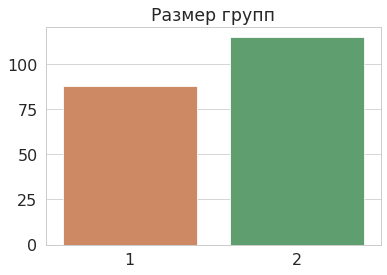

In [56]:
sns.barplot(data = [[0],[df_1_1.ID.nunique()],[df_1_0.ID.nunique()]])
plt.xlim(0.5)
plt.title('Размер групп');

#### Гистограммы значений параметров.
**Гистограммы построены для того, чтобы визуально оценить нормальность распределения признаков: видно, что только в случае среднего артериального давления в группе без ГТ можно наблюдать близкое к нормальному распределение. Поэтому дальше мы будем использовать непараметрический тест Краскела-Уоллиса для независимых выборок разного размера.**<br>
**На этих гистограммах также более удобно оценить медиану (изучается в тесте Краскела-Уоллиса) каждого параметра.**

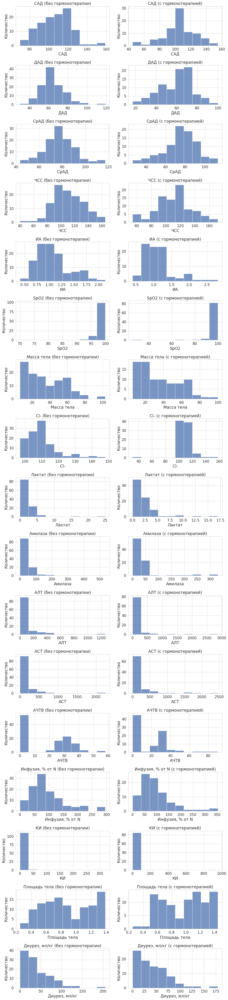

In [57]:
figure,ax = plt.subplots(len(target_columns[4:-1]),2,figsize=(14,60))
sns.set(style='whitegrid', rc={"grid.linewidth": 0.1})
sns.set_context("paper", font_scale=1.8)
for k,i in enumerate(target_columns[4:-1]):
    sns.histplot(df_1[df_1['GT']==0][i],bins=10,ax=ax[k,0])
    sns.histplot(df_1[df_1['GT']==1][i],bins=10,ax=ax[k,1])
    ax[k,0].set_title(i+' (без гормонотерапии)')
    ax[k,1].set_title(i+' (с гормонотерапией)')
    ax[k,0].set(ylabel='Количество')
    ax[k,1].set(ylabel='Количество')
plt.tight_layout()

* На графиках четко видна асимметричность распределения величин в двух выборках, 2 и более пика или резкое преобладание одного значения параметра над другими. Только два параметра (среднее АД и диастолическое АД) в группе пациентов, не получавшей ГТ, имеет близкое к нормальному распределение.
* т.к. графики далеки от нормального распределения, проверка на значимость различий выполнена с использованием критерия **Краскела-Уоллиса** (реализация критерия в sklearn позволяет анализировать от 2х групп)

In [58]:
columns = ['Вариант','Показатель','Значимость различий','p_value','alpha']
append_list = []
for k,i in enumerate(target_columns[4:-1]):
    group0 = df_1[df_1['GT']==0][i]
    group1 = df_1[df_1['GT']==1][i]
    alpha = 0.05
    test_value, p  = stats.kruskal(group0,group1)
    if alpha<p:
        append_list.append(['Этап 1',i,'значимость различия не доказана',p,alpha,df_1[df_1['GT']==0][i].median(),df_1[df_1['GT']==0][i].quantile(0.25),df_1[df_1['GT']==0][i].quantile(0.75),\
                           df_1[df_1['GT']==1][i].median(),df_1[df_1['GT']==1][i].quantile(0.25),df_1[df_1['GT']==1][i].quantile(0.75)])
    else:
        append_list.append(['Этап 1',i,'обнаружены значимые различия',p,alpha,df_1[df_1['GT']==0][i].median(),df_1[df_1['GT']==0][i].quantile(0.25),df_1[df_1['GT']==0][i].quantile(0.75),\
                           df_1[df_1['GT']==1][i].median(),df_1[df_1['GT']==1][i].quantile(0.25),df_1[df_1['GT']==1][i].quantile(0.75)])
        
# Для текстового вывода результатов - раскомментируйте данные строки;        
#     if alpha<p:
#         print(f'Разница по параметру {i} между двумя группами не доказана.')
#         print(f'\tСтатистика теста = {test_value}, p-значение = {p}')
#     else:
#         print(f'По параметру {i} наблюдается статистически достоверная разница между двумя группами.')
#         print(f'\tСтатистика теста = {test_value}, p-значение = {p}')

#### На основе проведенного теста (результаты приведены в сводной таблице ниже) можно сделать вывод, что различий между двумя группами пациентов по исследуемым параметрам не наблюдается; это подтверждается графически и с помощью теста Краскела-Уоллиса.
* Исходя из этого, можно предположить 2 варианта:
    - подобранная терапия обеспечивает относительную стабилизацию состояния уже в первые сутки: группы пациентов, нуждающиеся в ГТ и не нуждающиеся в ней, имеют сходные гемодинамические и биохимические показатели;
    - ГТ фактически никак не влияет на гемодинамические и биохимические показатели, а между группами пациентов просто нет существенной разницы; это предположение, вероятно, следует отклонить, т.к. гемодинамические эффекты глюкокортикоидов достаточно хорошо изучены.

### Этап 2
#### Пациенты делятся на 2 группы:

1. Получает гормонотерапию **только в первый день**.
2. Получает гормонотерапию **в первый И последующие дни**.

#### Нулевая гипотеза: разницы между группами нет.

In [59]:
# Составление списков пациентов получавших ГТ более 1 дня и только один (первый) день
# выбираем из датасета df  Day>1, GT = 1 и только тех пациентов, которые находятся в списке df_1_gt_1 (получали ГТ в первый день)
df_1_gt_1 = df.loc[(df.GT==1) & (df.Day==1),'ID'].unique()
a = df.loc[(df['Day']>1)&(df['ID'].isin(df_1_gt_1)),:].groupby('ID', as_index=False).max()
df_gt_more1day = df.loc[df.ID.isin(a.loc[a.GT==1,'ID']),:]
print(f'{df_gt_more1day["ID"].nunique()} получали ГТ более 1 дня.')
# есть данные и за 1 и за остальные дни; но в первый день они получали ГТ, а в др.дни - не получали
df_gt_only1day = df.loc[df.ID.isin(a.loc[a.GT==0,'ID']),:]
print(f'{df_gt_only1day["ID"].nunique()} получали ГТ только в 1й день')

67 получали ГТ более 1 дня.
12 получали ГТ только в 1й день


In [60]:
# не было ни одного пациента, который бы получал ГТ и находился в ОРИТ только 1 день
df.loc[(df['Day'].max()==1)&(df['ID'].isin(df_1_gt_1)),:].groupby('ID', as_index=False).max().shape[0]

0

In [61]:
# Размер выборки
print(f'Количество пациентов в группах:\nПервая группа\t{df_gt_only1day.ID.nunique()}\nВторая группа\t{df_gt_more1day.ID.nunique()}')

Количество пациентов в группах:
Первая группа	12
Вторая группа	67


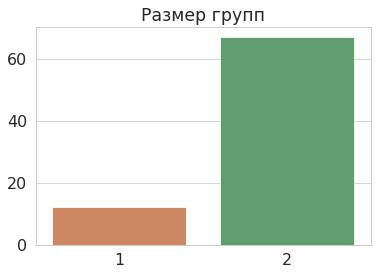

In [62]:
sns.barplot(data = [[0],[df_gt_only1day["ID"].nunique()],[df_gt_more1day["ID"].nunique()]])
plt.xlim(0.5)
plt.title('Размер групп');

Описательная статистика: 1 группа

In [63]:
# Описательная статистика пациентов, которые получали ГТ только в 1й день
df_gt_only1day[target_columns[2:]].describe().T

,count,mean,std,min,25%,50%,75%,max
Возраст,62.0,7.338710,3.922167,3.000000,4.000000,6.125000,11.750000,15.000000
GT,62.0,0.193548,0.398304,0.000000,0.000000,0.000000,0.000000,1.000000
САД,62.0,110.774194,13.216258,80.000000,102.750000,113.500000,118.750000,150.000000
ДАД,62.0,63.887097,12.420376,35.000000,55.000000,63.000000,70.000000,100.000000
СрАД,62.0,79.516129,11.562561,50.000000,73.083333,77.500000,85.750000,116.666667
ЧСС,62.0,101.145161,19.627554,60.000000,89.000000,98.500000,118.250000,165.000000
ИА,62.0,0.933377,0.257408,0.500000,0.780200,0.865385,1.065152,2.062500
SpO2,62.0,98.774194,2.321809,90.000000,98.000000,99.000000,100.000000,110.000000
Масса тела,62.0,32.741935,22.338627,12.000000,15.000000,21.500000,57.500000,70.000000
Cl-,62.0,107.988371,6.955691,99.400000,102.300000,108.000000,110.750000,129.000000


Описательная статистика: 2 группа

In [64]:
# Описательная статистика пациентов, которые получали ГТ в 1й и любой (любые) последующие дни
df_gt_more1day[target_columns[2:]].describe().T

,count,mean,std,min,25%,50%,75%,max
Возраст,548.0,10.438564,5.361711,0.250000,5.000000,12.000000,16.000000,17.000000
GT,548.0,0.653285,0.476359,0.000000,0.000000,1.000000,1.000000,1.000000
САД,548.0,112.124088,17.412910,45.000000,104.000000,112.500000,120.000000,165.000000
ДАД,548.0,65.399635,13.792632,5.000000,60.000000,65.000000,75.000000,100.000000
СрАД,548.0,80.974453,14.174995,26.333333,73.333333,81.666667,90.083333,120.666667
ЧСС,548.0,105.155109,23.767145,41.000000,88.750000,105.000000,120.000000,186.000000
ИА,548.0,0.966663,0.312359,0.412903,0.775182,0.909091,1.090909,3.100000
SpO2,548.0,98.155109,4.290591,26.000000,98.000000,99.000000,100.000000,100.000000
Масса тела,548.0,42.937956,22.495475,6.000000,20.000000,45.000000,60.000000,100.000000
Cl-,548.0,110.713831,12.268808,31.000000,104.000000,108.744756,114.000000,193.000000


In [65]:
# сравнение средних
a = pd.DataFrame(df_gt_more1day[target_columns[2:-1]].mean()).rename(columns = {0:'ГТ\: 1 и последующие дни'})
a_ = []
for i in target_columns[2:-1]:    
          a_.append(df_gt_only1day[df_gt_only1day[i]>0][i].mean())
a['ГТ: только 1й день'] = a_
a

,ГТ\: 1 и последующие дни,ГТ: только 1й день
Возраст,10.438564,7.338710
GT,0.653285,1.000000
САД,112.124088,110.774194
ДАД,65.399635,63.887097
СрАД,80.974453,79.516129
ЧСС,105.155109,101.145161
ИА,0.966663,0.933377
SpO2,98.155109,98.774194
Масса тела,42.937956,32.741935
Cl-,110.713831,107.988371


### Гистограммы значений и QQ-плот для оценки нормальности распределения
**В данном случае мы добавили график QQ-плот (квантиль-квантиль), т.к. в некоторых случаях при просмотре гистограмм неочевидно, что параметры имеют непараметрическое распределение.**

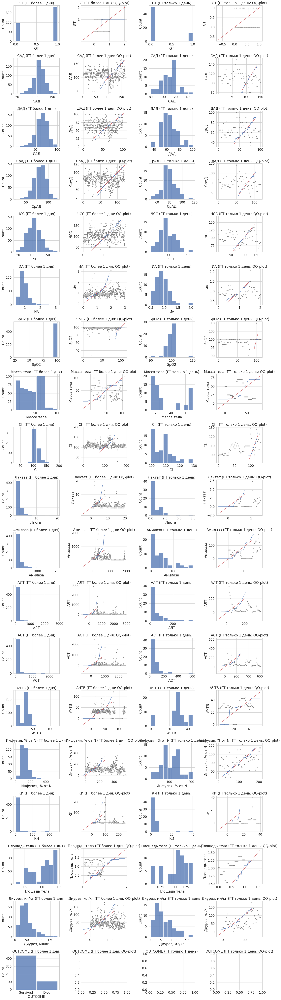

In [66]:
# for k,i in enumerate(target_columns[3:]):
#     print('Параметр =',i,'\nСреднее = ',df_gt_more1day[i].mean(),'std =',df_gt_more1day[i].std(ddof=1))
figure,ax = plt.subplots(len(target_columns[3:]),4,figsize=(19,70))
for k,i in enumerate(target_columns[3:]):
    try:
        sns.histplot(df_gt_more1day[i],bins=10,ax=ax[k,0])
        interval = np.linspace(0,1,int(df_gt_more1day[i].count()))
        x = stats.norm.ppf(np.linspace(0,1,int(df_gt_more1day[i].count())),loc=df_gt_more1day[i].mean(),scale=df_gt_more1day[i].std(ddof=1))
        y = np.quantile(df_gt_more1day[i],interval)
        sns.lineplot(x = x,y = x,ax=ax[k,1],color='r')
        sns.lineplot(x = x,y = y,ax=ax[k,1],color='b')
        sns.scatterplot(x = np.linspace(0,int(df_gt_more1day[i].max()),int(df_gt_more1day[i].count())),y = df_gt_more1day[i],ax=ax[k,1],color='grey')
        sns.histplot(df_gt_only1day[i],bins=10,ax=ax[k,2])
        interval = np.linspace(0,1,int(df_gt_only1day[i].count()))
        x = stats.norm.ppf(np.linspace(0,1,int(df_gt_only1day[i].count())),loc=df_gt_only1day[i].mean(),scale=df_gt_only1day[i].std(ddof=1))
        y = np.quantile(df_gt_only1day[i],interval)
        sns.lineplot(x = x,y = x,ax=ax[k,3],color='r')
        sns.lineplot(x = x,y = y,ax=ax[k,3],color='b')
        sns.scatterplot(x = np.linspace(0,int(df_gt_only1day[i].max()),int(df_gt_only1day[i].count())),y = df_gt_only1day[i],ax=ax[k,3],color='grey')
        ax[k,0].set_title(i+' (ГТ более 1 дня)')
        ax[k,1].set_title(i+' (ГТ более 1 дня: QQ-plot)')
        ax[k,2].set_title(i+' (ГТ только 1 день)')
        ax[k,3].set_title(i+' (ГТ только 1 день: QQ-plot)')
        plt.tight_layout()

    except Exception:
        ax[k,0].set_title(i+' (ГТ более 1 дня)')
        ax[k,1].set_title(i+' (ГТ более 1 дня: QQ-plot)')
        ax[k,2].set_title(i+' (ГТ только 1 день)')
        ax[k,3].set_title(i+' (ГТ только 1 день: QQ-plot)')
        plt.tight_layout()
        pass

### По представленным графикам нельзя говорить о нормальном распределении. Разница между двумя группами оценивалась тестом Краскела-Уоллиса.

In [67]:
for k,i in enumerate(target_columns[3:-1]):
    group0 = df_gt_more1day[i]
    group1 = df_gt_only1day[i]
    alpha = 0.05
    test_value, p  = stats.kruskal(group0,group1)
    if alpha<p:
        append_list.append(['Этап 2',i,'значимость различия не доказана',p,alpha,group0.median(),group0.quantile(0.25),group0.quantile(0.75),\
                           group1.median(),group1.quantile(0.25),group1.quantile(0.75)])
    else:
        append_list.append(['Этап 2',i,'обнаружены значимые различия',p,alpha,group0.median(),group0.quantile(0.25),group0.quantile(0.75),\
                           group1.median(),group1.quantile(0.25),group1.quantile(0.75)])
#     if alpha<p:
#         print(f'Разница по параметру {i} между двумя группами не доказана.')
#         print(f'\tСтатистика теста = {test_value}, p-значение = {p}')
#     else:
#         print(f'По параметру {i} наблюдается статистически достоверная разница между двумя группами.')
#         print(f'\tСтатистика теста = {test_value}, p-значение = {p}')

* По большинству параметров в этом случае наблюдается статистически достоверная разница;
* Между двумя группами (см. результаты в сводной таблице ниже) обнаружены статистически значимые различия по большинству параметров:
    - САД;
    - ДАД;
    - СрАД;
    - ИА;
    - SpO2;
    - Cl-;
    - масса тела
    - лактат;
    - АЛТ;
    - АСТ;
    - АЧТВ;
    - волемическая нагрузка, % от нормы;
    - КИ;
    - площадь тела;
    - диурез;

* Обращает на себя внимание то, что в группе с ГТ 1 день снижены КИ и волемическая нагрузка.

### Этап 3
#### Пациенты делятся на 2 группы:

1. Получает гормонотерапию **только в первый день**.
2. **Не получает** гормонотерапию в первый и **получает** ее в последующие дни.

**Ограничения: решение о назначении гормонотерапии (ГТ) определялось исходя из наличия показаний.**

#### Нулевая гипотеза: разницы между группами нет.

In [68]:
# df_gt_only1day - пациенты получают ГТ только в 1й день
df_not1_users = df.loc[(~df['ID'].isin(df_1_gt_1))&(df.GT==1),'ID']
df_not1 = df.loc[df.ID.isin(df_not1_users),:]

In [69]:
print(f' Размер первой группы = {df_gt_only1day.ID.nunique()}')

 Размер первой группы = 12


In [70]:
print(f' Размер второй группы = {df_not1.ID.nunique()}')

 Размер второй группы = 25


In [71]:
df_gt_only1day[target_columns[2:]].drop('GT',axis=1).describe().T

,count,mean,std,min,25%,50%,75%,max
Возраст,62.0,7.338710,3.922167,3.000000,4.000000,6.125000,11.750000,15.000000
САД,62.0,110.774194,13.216258,80.000000,102.750000,113.500000,118.750000,150.000000
ДАД,62.0,63.887097,12.420376,35.000000,55.000000,63.000000,70.000000,100.000000
СрАД,62.0,79.516129,11.562561,50.000000,73.083333,77.500000,85.750000,116.666667
ЧСС,62.0,101.145161,19.627554,60.000000,89.000000,98.500000,118.250000,165.000000
ИА,62.0,0.933377,0.257408,0.500000,0.780200,0.865385,1.065152,2.062500
SpO2,62.0,98.774194,2.321809,90.000000,98.000000,99.000000,100.000000,110.000000
Масса тела,62.0,32.741935,22.338627,12.000000,15.000000,21.500000,57.500000,70.000000
Cl-,62.0,107.988371,6.955691,99.400000,102.300000,108.000000,110.750000,129.000000
Лактат,62.0,0.732258,1.322538,0.000000,0.000000,0.000000,1.300000,7.400000


In [72]:
df_not1[target_columns[2:]].drop('GT',axis=1).describe().T

,count,mean,std,min,25%,50%,75%,max
Возраст,331.0,10.277002,5.753904,0.750000,5.000000,14.000000,15.000000,17.000000
САД,331.0,110.873112,13.746919,70.000000,100.000000,110.000000,120.000000,170.000000
ДАД,331.0,64.891239,11.953963,30.000000,55.500000,65.000000,75.000000,110.000000
СрАД,331.0,80.218530,11.624494,46.666667,71.833333,80.000000,90.000000,116.666667
ЧСС,331.0,107.743202,23.686409,24.000000,90.000000,109.000000,120.500000,180.000000
ИА,331.0,0.989235,0.267801,0.200000,0.810795,0.970874,1.109244,2.056338
SpO2,331.0,98.564955,1.922241,82.000000,98.000000,99.000000,100.000000,100.000000
Масса тела,331.0,39.172205,21.802536,7.500000,15.000000,50.000000,50.000000,80.000000
Cl-,331.0,114.955073,12.467300,60.600000,106.000000,111.000000,121.000000,169.000000
Лактат,331.0,1.192749,1.615327,-1.100000,0.000000,1.100000,1.600000,25.000000


In [73]:
# сравнение средних
a = pd.DataFrame(df_gt_only1day[target_columns[2:-1]].drop('GT',axis=1).mean()).rename(columns = {0:'Группа 1: получает ГТ'})
a_ = []
for i in target_columns[2:-1]:
    if i != 'GT':
        a_.append(df_not1[df_not1[i]>0][i].mean())
a['Группа 2: не получает ГТ'] = a_
a

,Группа 1: получает ГТ,Группа 2: не получает ГТ
Возраст,7.338710,10.277002
САД,110.774194,110.873112
ДАД,63.887097,64.891239
СрАД,79.516129,80.218530
ЧСС,101.145161,107.743202
ИА,0.933377,0.989235
SpO2,98.774194,98.564955
Масса тела,32.741935,39.172205
Cl-,107.988371,114.955073
Лактат,0.732258,1.649583


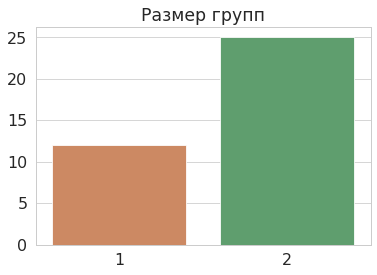

In [74]:
sns.barplot(data = [[0],[df_gt_only1day.ID.nunique()],[df_not1.ID.nunique()]])
plt.xlim(0.5)
plt.title('Размер групп');

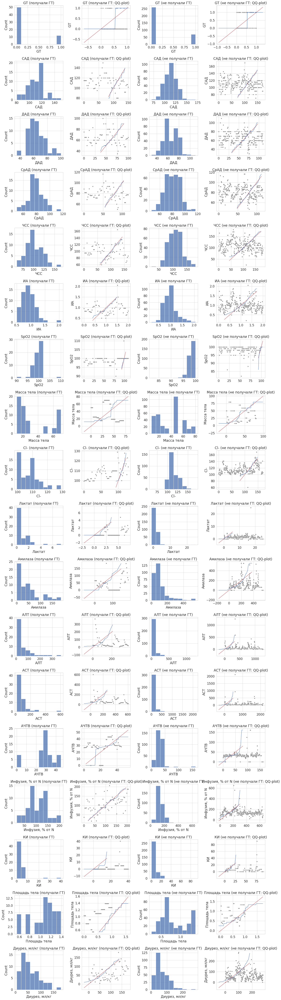

In [75]:
# for k,i in enumerate(target_columns[3:]):
#     print('Параметр =',i,'\nСреднее = ',df_gt_more1day[i].mean(),'std =',df_gt_more1day[i].std(ddof=1))
figure,ax = plt.subplots(len(target_columns[3:-1]),4,figsize=(19,70))
for k,i in enumerate(target_columns[3:-1]):
    try:
        sns.histplot(df_gt_only1day[i],bins=10,ax=ax[k,0])
        interval = np.linspace(0,1,int(df_gt_only1day[i].count()))
        x = stats.norm.ppf(np.linspace(0,1,int(df_gt_only1day[i].count())),loc=df_gt_only1day[i].mean(),scale=df_gt_only1day[i].std(ddof=1))
        y = np.quantile(df_gt_only1day[i],interval)
        sns.lineplot(x = x,y = x,ax=ax[k,1],color='r')
        sns.lineplot(x = x,y = y,ax=ax[k,1],color='b')
        sns.scatterplot(x = np.linspace(0,int(df_gt_only1day[i].max()),int(df_gt_only1day[i].count())),y = df_gt_only1day[i],ax=ax[k,1],color='grey')
        sns.histplot(df_not1[i],bins=10,ax=ax[k,2])
        interval = np.linspace(0,1,int(df_not1[i].count()))
        x = stats.norm.ppf(np.linspace(0,1,int(df_not1[i].count())),loc=df_not1[i].mean(),scale=df_not1[i].std(ddof=1))
        y = np.quantile(df_not1[i],interval)
        sns.lineplot(x = x,y = x,ax=ax[k,3],color='r')
        sns.lineplot(x = x,y = y,ax=ax[k,3],color='b')
        sns.scatterplot(x = np.linspace(0,int(df_not1[i].max()),int(df_not1[i].count())),y = df_not1[i],ax=ax[k,3],color='grey')
        ax[k,0].set_title(i+' (получали ГТ)')
        ax[k,1].set_title(i+' (получали ГТ: QQ-plot)')
        ax[k,2].set_title(i+' (не получали ГТ)')
        ax[k,3].set_title(i+' (не получали ГТ: QQ-plot)')
        plt.tight_layout()

    except Exception:
        ax[k,0].set_title(i+' (получали ГТ)')
        ax[k,1].set_title(i+' (получали ГТ: QQ-plot)')
        ax[k,2].set_title(i+' (не получали ГТ)')
        ax[k,3].set_title(i+' (не получали ГТ: QQ-plot)')
        plt.tight_layout()
        pass

In [76]:
for k,i in enumerate(target_columns[3:-1]):
    group0 = df_gt_only1day[i]
    group1 = df_not1[i]
    alpha = 0.05
    test_value, p  = stats.kruskal(group0,group1)
    if alpha<p:
        append_list.append(['Этап 3',i,'значимость различия не доказана',p,alpha,group0.median(),group0.quantile(0.25),group0.quantile(0.75),\
                           group1.median(),group1.quantile(0.25),group1.quantile(0.75)])
    else:
        append_list.append(['Этап 3',i,'обнаружены значимые различия',p,alpha,group0.median(),group0.quantile(0.25),group0.quantile(0.75),\
                           group1.median(),group1.quantile(0.25),group1.quantile(0.75)])
#     if alpha<p:
#         print(f'Разница по параметру {i} между двумя группами не доказана.')
#         print(f'\tСтатистика теста = {test_value}, p-значение = {p}')
#     else:
#         print(f'По параметру {i} наблюдается статистически достоверная разница между двумя группами.')
#         print(f'\tСтатистика теста = {test_value}, p-значение = {p}')

**результаты представлены в сводной таблице (см. ниже)**

### Этап 4
#### Пациенты делятся на 2 группы:
1. Получает гормонотерапию **только в первый день**
2. Не получает гормонотерапию за все время лечения

In [77]:
# df_gt_only1day - пациенты получают ГТ только в 1й день
df_only1 = df.loc[df.ID.isin(df_gt_only1day.ID.unique()),:]
# поле GT будет содержать 1, если пациент получал ГТ в какой-нибудь день
a = df.groupby('ID',as_index=False)['GT'].max()
users = a.loc[a['GT']==1,'ID'].values
df_noGT = df.loc[~df.ID.isin(users),:]

In [78]:
df_only1[target_columns[2:]].drop('GT',axis=1).describe().T

,count,mean,std,min,25%,50%,75%,max
Возраст,62.0,7.338710,3.922167,3.000000,4.000000,6.125000,11.750000,15.000000
САД,62.0,110.774194,13.216258,80.000000,102.750000,113.500000,118.750000,150.000000
ДАД,62.0,63.887097,12.420376,35.000000,55.000000,63.000000,70.000000,100.000000
СрАД,62.0,79.516129,11.562561,50.000000,73.083333,77.500000,85.750000,116.666667
ЧСС,62.0,101.145161,19.627554,60.000000,89.000000,98.500000,118.250000,165.000000
ИА,62.0,0.933377,0.257408,0.500000,0.780200,0.865385,1.065152,2.062500
SpO2,62.0,98.774194,2.321809,90.000000,98.000000,99.000000,100.000000,110.000000
Масса тела,62.0,32.741935,22.338627,12.000000,15.000000,21.500000,57.500000,70.000000
Cl-,62.0,107.988371,6.955691,99.400000,102.300000,108.000000,110.750000,129.000000
Лактат,62.0,0.732258,1.322538,0.000000,0.000000,0.000000,1.300000,7.400000


In [79]:
df_noGT[target_columns[2:]].drop('GT',axis=1).describe().T

,count,mean,std,min,25%,50%,75%,max
Возраст,442.0,9.533793,5.402981,0.250000,4.000000,11.000000,15.000000,18.000000
САД,442.0,110.757919,15.134701,50.000000,100.000000,110.000000,120.000000,170.000000
ДАД,442.0,64.291855,11.203473,26.000000,60.000000,64.500000,70.000000,119.000000
СрАД,442.0,79.780543,11.529464,34.000000,73.333333,80.000000,86.666667,117.333333
ЧСС,442.0,105.434389,23.485828,40.000000,90.000000,107.000000,120.000000,180.000000
ИА,442.0,0.977722,0.290774,0.381356,0.772942,0.989181,1.127008,2.250000
SpO2,442.0,98.490950,2.585703,70.000000,98.000000,99.000000,100.000000,100.000000
Масса тела,442.0,40.165158,23.323659,6.000000,16.500000,40.000000,60.000000,103.000000
Cl-,442.0,111.731211,14.160864,85.000000,104.000000,108.744756,113.925000,191.000000
Лактат,442.0,1.231652,1.371163,0.000000,0.000000,1.100000,1.700000,17.000000


In [80]:
# сравнение средних
a = pd.DataFrame(df_only1[target_columns[2:-1]].drop('GT',axis=1).mean()).rename(columns = {0:'Группа 1: ГТ только в 1й день'})
a_ = []
for i in target_columns[2:-1]:
    if i != 'GT':
        a_.append(df_noGT[df_noGT[i]>0][i].mean())
a['Группа 2: не получает ГТ'] = a_
a

,Группа 1: ГТ только в 1й день,Группа 2: не получает ГТ
Возраст,7.338710,9.533793
САД,110.774194,110.757919
ДАД,63.887097,64.291855
СрАД,79.516129,79.780543
ЧСС,101.145161,105.434389
ИА,0.933377,0.977722
SpO2,98.774194,98.490950
Масса тела,32.741935,40.165158
Cl-,107.988371,111.731211
Лактат,0.732258,1.744840


In [81]:
# Размер выборки
print(f'Количество пациентов в группах:\nПервая группа\t{df_only1.ID.nunique()}\nВторая группа\t{df_noGT.ID.nunique()}')

Количество пациентов в группах:
Первая группа	12
Вторая группа	90


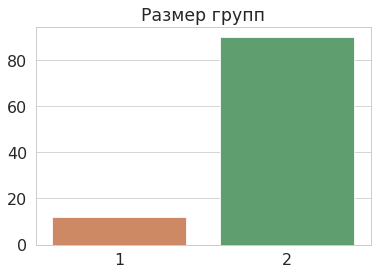

In [82]:
sns.barplot(data = [[0],[df_only1.ID.nunique()],[df_noGT.ID.nunique()]])
plt.xlim(0.5)
plt.title('Размер групп');

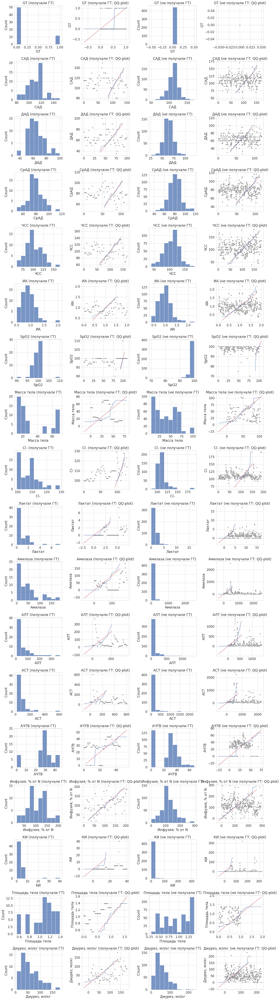

In [83]:
# for k,i in enumerate(target_columns[3:]):
#     print('Параметр =',i,'\nСреднее = ',df_gt_more1day[i].mean(),'std =',df_gt_more1day[i].std(ddof=1))
figure,ax = plt.subplots(len(target_columns[3:-1]),4,figsize=(19,70))
for k,i in enumerate(target_columns[3:-1]):
    try:
        sns.histplot(df_only1[i],bins=10,ax=ax[k,0])
        interval = np.linspace(0,1,int(df_only1[i].count()))
        x = stats.norm.ppf(np.linspace(0,1,int(df_only1[i].count())),loc=df_only1[i].mean(),scale=df_only1[i].std(ddof=1))
        y = np.quantile(df_only1[i],interval)
        sns.lineplot(x = x,y = x,ax=ax[k,1],color='r')
        sns.lineplot(x = x,y = y,ax=ax[k,1],color='b')
        sns.scatterplot(x = np.linspace(0,int(df_only1[i].max()),int(df_only1[i].count())),y = df_only1[i],ax=ax[k,1],color='grey')
        sns.histplot(df_noGT[i],bins=10,ax=ax[k,2])
        interval = np.linspace(0,1,int(df_noGT[i].count()))
        x = stats.norm.ppf(np.linspace(0,1,int(df_noGT[i].count())),loc=df_noGT[i].mean(),scale=df_noGT[i].std(ddof=1))
        y = np.quantile(df_noGT[i],interval)
        sns.lineplot(x = x,y = x,ax=ax[k,3],color='r')
        sns.lineplot(x = x,y = y,ax=ax[k,3],color='b')
        sns.scatterplot(x = np.linspace(0,int(df_noGT[i].max()),int(df_noGT[i].count())),y = df_noGT[i],ax=ax[k,3],color='grey')
        ax[k,0].set_title(i+' (получали ГТ)')
        ax[k,1].set_title(i+' (получали ГТ: QQ-plot)')
        ax[k,2].set_title(i+' (не получали ГТ)')
        ax[k,3].set_title(i+' (не получали ГТ: QQ-plot)')
        plt.tight_layout()

    except Exception:
        ax[k,0].set_title(i+' (получали ГТ)')
        ax[k,1].set_title(i+' (получали ГТ: QQ-plot)')
        ax[k,2].set_title(i+' (не получали ГТ)')
        ax[k,3].set_title(i+' (не получали ГТ: QQ-plot)')
        plt.tight_layout()
        pass

In [84]:
for k,i in enumerate(target_columns[3:-1]):
    group0 = df_only1[i]
    group1 = df_noGT[i]
    alpha = 0.05
    test_value, p  = stats.kruskal(group0,group1)
    if alpha<p:
        append_list.append(['Этап 4',i,'значимость различия не доказана',p,alpha,group0.median(),group0.quantile(0.25),group0.quantile(0.75),\
                           group1.median(),group1.quantile(0.25),group1.quantile(0.75)])
    else:
        append_list.append(['Этап 4',i,'обнаружены значимые различия',p,alpha,group0.median(),group0.quantile(0.25),group0.quantile(0.75),\
                           group1.median(),group1.quantile(0.25),group1.quantile(0.75)])
#     if alpha<p:
#         print(f'Разница по параметру {i} между двумя группами не доказана.')
#         print(f'\tСтатистика теста = {test_value}, p-значение = {p}')
#     else:
#         print(f'По параметру {i} наблюдается статистически достоверная разница между двумя группами.')
#         print(f'\tСтатистика теста = {test_value}, p-значение = {p}')

**результаты представлены в сводной таблице (см. ниже)**

### Этап 5
#### Пациенты делятся на 2 группы:

1. Получает гормонотерапию **в любой день**.
2. **Не получает** ни разу за время лечения.

**Ограничения: решение о назначении гормонотерапии (ГТ) определялось исходя из наличия показаний.**

#### Нулевая гипотеза: разницы между группами нет.

In [85]:
df_any_users = df.loc[df.GT==1,'ID'].unique()
df_any = df.loc[df.ID.isin(df_any_users),:]
df_noGT_users = df.groupby('ID',as_index=False).max()
df_noGT_users = df_noGT_users.loc[df_noGT_users.GT==0,'ID']
df_noGT = df.loc[df.ID.isin(df_noGT_users),:]

In [86]:
df_any[target_columns[2:]].drop('GT',axis=1).describe().T

,count,mean,std,min,25%,50%,75%,max
Возраст,950.0,10.169496,5.463123,0.250000,5.000000,12.000000,15.000000,17.000000
САД,950.0,111.498947,15.995175,45.000000,101.000000,110.000000,120.000000,170.000000
ДАД,950.0,65.114737,13.107262,5.000000,56.000000,65.000000,75.000000,110.000000
СрАД,950.0,80.576140,13.194491,26.333333,73.333333,80.833333,90.000000,120.666667
ЧСС,950.0,105.881053,23.499379,24.000000,90.000000,105.000000,120.000000,186.000000
ИА,950.0,0.974400,0.296070,0.200000,0.782609,0.926121,1.096178,3.100000
SpO2,950.0,98.324211,3.627861,26.000000,98.000000,99.000000,100.000000,110.000000
Масса тела,950.0,40.862105,22.366497,6.000000,20.000000,45.000000,60.000000,100.000000
Cl-,950.0,111.966233,12.231454,31.000000,104.000000,109.000000,116.000000,193.000000
Лактат,950.0,1.293474,1.844823,-1.100000,0.000000,1.100000,1.700000,25.000000


In [87]:
df_noGT[target_columns[2:]].drop('GT',axis=1).describe().T

,count,mean,std,min,25%,50%,75%,max
Возраст,442.0,9.533793,5.402981,0.250000,4.000000,11.000000,15.000000,18.000000
САД,442.0,110.757919,15.134701,50.000000,100.000000,110.000000,120.000000,170.000000
ДАД,442.0,64.291855,11.203473,26.000000,60.000000,64.500000,70.000000,119.000000
СрАД,442.0,79.780543,11.529464,34.000000,73.333333,80.000000,86.666667,117.333333
ЧСС,442.0,105.434389,23.485828,40.000000,90.000000,107.000000,120.000000,180.000000
ИА,442.0,0.977722,0.290774,0.381356,0.772942,0.989181,1.127008,2.250000
SpO2,442.0,98.490950,2.585703,70.000000,98.000000,99.000000,100.000000,100.000000
Масса тела,442.0,40.165158,23.323659,6.000000,16.500000,40.000000,60.000000,103.000000
Cl-,442.0,111.731211,14.160864,85.000000,104.000000,108.744756,113.925000,191.000000
Лактат,442.0,1.231652,1.371163,0.000000,0.000000,1.100000,1.700000,17.000000


In [88]:
# сравнение средних
a = pd.DataFrame(df_any[target_columns[2:-1]].drop('GT',axis=1).mean()).rename(columns = {0:'Группа 1: получает ГТ'})
a_ = []
for i in target_columns[2:-1]:
    if i != 'GT':
        a_.append(df_noGT[df_noGT[i]>0][i].mean())
a['Группа 2: не получает ГТ'] = a_
a

,Группа 1: получает ГТ,Группа 2: не получает ГТ
Возраст,10.169496,9.533793
САД,111.498947,110.757919
ДАД,65.114737,64.291855
СрАД,80.576140,79.780543
ЧСС,105.881053,105.434389
ИА,0.974400,0.977722
SpO2,98.324211,98.490950
Масса тела,40.862105,40.165158
Cl-,111.966233,111.731211
Лактат,1.293474,1.744840


In [89]:
# Размер выборки
print(f'Количество пациентов в группах:\nПервая группа\t{df_any.ID.nunique()}\nВторая группа\t{df_noGT.ID.nunique()}')

Количество пациентов в группах:
Первая группа	113
Вторая группа	90


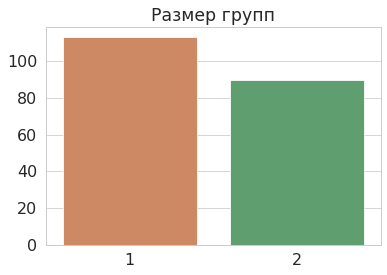

In [90]:
sns.barplot(data = [[0],[df_any.ID.nunique()],[df_noGT.ID.nunique()]])
plt.xlim(0.5)
plt.title('Размер групп');

#### Гистограммы значений и графики QQ-плот изучаемых параметров.

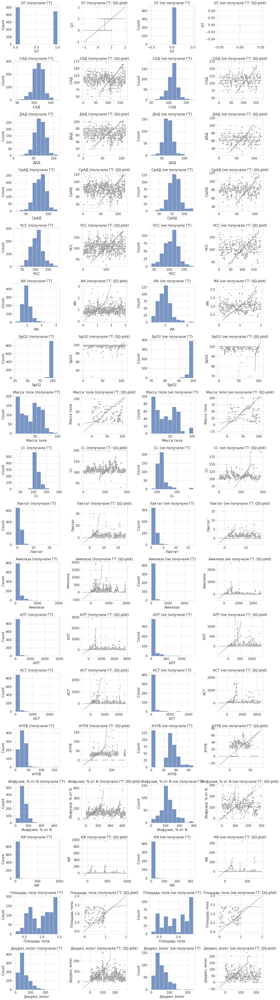

In [91]:
# for k,i in enumerate(target_columns[3:]):
#     print('Параметр =',i,'\nСреднее = ',df_gt_more1day[i].mean(),'std =',df_gt_more1day[i].std(ddof=1))
figure,ax = plt.subplots(len(target_columns[3:-1]),4,figsize=(19,70))
for k,i in enumerate(target_columns[3:-1]):
    try:
        sns.histplot(df_any[i],bins=10,ax=ax[k,0])
        interval = np.linspace(0,1,int(df_any[i].count()))
        x = stats.norm.ppf(np.linspace(0,1,int(df_any[i].count())),loc=df_any[i].mean(),scale=df_any[i].std(ddof=1))
        y = np.quantile(df_any[i],interval)
        sns.lineplot(x = x,y = x,ax=ax[k,1],color='r')
        sns.lineplot(x = x,y = y,ax=ax[k,1],color='b')
        sns.scatterplot(x = np.linspace(0,int(df_any[i].max()),int(df_any[i].count())),y = df_any[i],ax=ax[k,1],color='grey')
        sns.histplot(df_noGT[i],bins=10,ax=ax[k,2])
        interval = np.linspace(0,1,int(df_noGT[i].count()))
        x = stats.norm.ppf(np.linspace(0,1,int(df_noGT[i].count())),loc=df_noGT[i].mean(),scale=df_noGT[i].std(ddof=1))
        y = np.quantile(df_noGT[i],interval)
        sns.lineplot(x = x,y = x,ax=ax[k,3],color='r')
        sns.lineplot(x = x,y = y,ax=ax[k,3],color='b')
        sns.scatterplot(x = np.linspace(0,int(df_noGT[i].max()),int(df_noGT[i].count())),y = df_noGT[i],ax=ax[k,3],color='grey')
        ax[k,0].set_title(i+' (получали ГТ)')
        ax[k,1].set_title(i+' (получали ГТ: QQ-plot)')
        ax[k,2].set_title(i+' (не получали ГТ)')
        ax[k,3].set_title(i+' (не получали ГТ: QQ-plot)')
        plt.tight_layout()

    except Exception:
        ax[k,0].set_title(i+' (получали ГТ)')
        ax[k,1].set_title(i+' (получали ГТ: QQ-plot)')
        ax[k,2].set_title(i+' (не получали ГТ)')
        ax[k,3].set_title(i+' (не получали ГТ: QQ-plot)')
        plt.tight_layout()
        pass

* И снова на графиках QQ-плот отчетливо видно, что данные распределены непараметрически.
* Дальнейший анализ - с помощью критерия Краскела-Уоллиса

In [92]:
for k,i in enumerate(target_columns[3:-1]):
    group0 = df_any[i]
    group1 = df_noGT[i]
    alpha = 0.05
    test_value, p  = stats.kruskal(group0,group1)
    if alpha<p:
        append_list.append(['Этап 5',i,'значимость различия не доказана',p,alpha,group0.median(),group0.quantile(0.25),group0.quantile(0.75),\
                           group1.median(),group1.quantile(0.25),group1.quantile(0.75)])
    else:
        append_list.append(['Этап 5',i,'обнаружены значимые различия',p,alpha,group0.median(),group0.quantile(0.25),group0.quantile(0.75),\
                           group1.median(),group1.quantile(0.25),group1.quantile(0.75)])
    if alpha<p:
        print(f'Разница по параметру {i} между двумя группами не доказана.')
        print(f'\tСтатистика теста = {test_value}, p-значение = {p}')
    else:
        print(f'По параметру {i} наблюдается статистически достоверная разница между двумя группами.')
        print(f'\tСтатистика теста = {test_value}, p-значение = {p}')

По параметру GT наблюдается статистически достоверная разница между двумя группами.
	Статистика теста = 308.14877267399817, p-значение = 5.527209682796086e-69
Разница по параметру САД между двумя группами не доказана.
	Статистика теста = 0.789104211346105, p-значение = 0.3743711298061947
Разница по параметру ДАД между двумя группами не доказана.
	Статистика теста = 2.7054287237733887, p-значение = 0.10000719410523369
Разница по параметру СрАД между двумя группами не доказана.
	Статистика теста = 3.0993025343491, p-значение = 0.07832584439605056
Разница по параметру ЧСС между двумя группами не доказана.
	Статистика теста = 0.11643911886382965, p-значение = 0.7329291102177846
Разница по параметру ИА между двумя группами не доказана.
	Статистика теста = 1.6827012673646609, p-значение = 0.1945659039824976
Разница по параметру SpO2 между двумя группами не доказана.
	Статистика теста = 1.4013909315768618, p-значение = 0.23649082215979317
Разница по параметру Масса тела между двумя группами н

* В результате была обнаружена статистически достоверная разница между группами по параметру Амилаза и КИ.
* По параметру КИ обращает на себя внимание один выброс в группе, получавшей ГТ (см. график). Рассчитаем статистику без него.

In [93]:
group0 = df_any['КИ'].drop(df_any.loc[df_any['КИ']>800,:].index,axis=0)
group1 = df_noGT['КИ']
alpha = 0.05
test_value, p  = stats.kruskal(group0,group1)
if alpha<p:
    print(f'Разница по параметру КИ между двумя группами не доказана.')
    print(f'\tСтатистика теста = {test_value}, p-значение = {p}')
else:
    print(f'По параметру КИ наблюдается статистически достоверная разница между двумя группами.')
    print(f'\tСтатистика теста = {test_value}, p-значение = {p}')

По параметру КИ наблюдается статистически достоверная разница между двумя группами.
	Статистика теста = 44.23698594591091, p-значение = 2.909321225967024e-11


* Даже после устранения этого выброса сохраняется значимость различий между группами.
* Различия по КИ и амилазе могут свидетельствовать о тяжести состояния данных пациентов. В то время как параметры гемодинамики могут быть скорректированы гормональной поддержкой преднизолоном, дексаметазоном, инотропными препаратами и волемической нагрузкой, становится необходимым использовать индексы и биохимические маркеры повреждения органов для оценки состояния и прогноза заболевания.

In [94]:
def highlight_greaterthan(x):
    color = 'lightgreen' if x<0.05 else 'white'
    return 'background-color: %s' % color
columns = ['Вариант', 'Показатель', 'Значимость различий', 'p_value', 'alpha','Медиана (1)','25 центиль (1)','75 центиль (1)','Медиана (2)','25 центиль (2)','75 центиль (2)']
df_results = pd.DataFrame(append_list).set_axis(columns, axis=1)
df_results.columns = columns
df_results = df_results.drop(['Значимость различий','alpha'], axis=1).pivot(columns = ['Вариант'],index = 'Показатель',values = ['p_value', 'Медиана (1)','25 центиль (1)','75 центиль (1)','Медиана (2)','25 центиль (2)','75 центиль (2)']).drop('GT',axis=0)
df_results = df_results.style.applymap(highlight_greaterthan)
df_results

---

## Анализ выживаемости при использовании ГТ

#### Пациенты делятся на 2 группы:

1. Выжившие.
2. Умершие.

**По этим двум группам отдельно сравниваются пациенты получавшие и не получавшие ГТ**

**Ограничения: решение о назначении гормонотерапии (ГТ) определялось исходя из наличия показаний.**

#### Нулевая гипотеза: разницы между группами нет.

#### Графический анализ
* графики распределения значений параметров 2х групп пациентов (выживших и умерших): все дни лечения

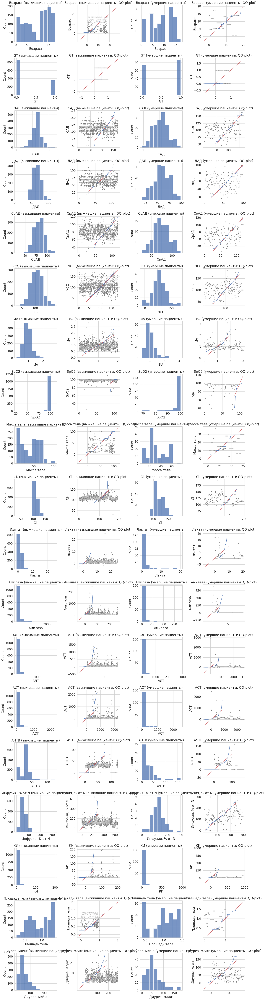

In [95]:
group0 = df[df['OUTCOME']=='Survived']
group1 = df[df['OUTCOME']=='Died']
figure,ax = plt.subplots(len(target_columns[2:-1]),4,figsize=(19,75))
for k,i in enumerate(target_columns[2:-1]):
    try:
        sns.histplot(group0[i],bins=10,ax=ax[k,0])
        interval = np.linspace(0,1,int(group0[i].count()))
        x = stats.norm.ppf(np.linspace(0,1,int(group0[i].count())),loc=group0[i].mean(),scale=group0[i].std(ddof=1))
        y = np.quantile(group0[i],interval)
        sns.lineplot(x = x,y = x,ax=ax[k,1],color='r')
        sns.lineplot(x = x,y = y,ax=ax[k,1],color='b')
        sns.scatterplot(x = np.linspace(0,int(group0[i].max()),int(group0[i].count())),y = group0[i],ax=ax[k,1],color='grey')
        sns.histplot(group1[i],bins=10,ax=ax[k,2])
        interval = np.linspace(0,1,int(group1[i].count()))
        x = stats.norm.ppf(np.linspace(0,1,int(group1[i].count())),loc=group1[i].mean(),scale=group1[i].std(ddof=1))
        y = np.quantile(group1[i],interval)
        sns.lineplot(x = x,y = x,ax=ax[k,3],color='r')
        sns.lineplot(x = x,y = y,ax=ax[k,3],color='b')
        sns.scatterplot(x = np.linspace(0,int(group1[i].max()),int(group1[i].count())),y = group1[i],ax=ax[k,3],color='grey')
        ax[k,0].set_title(i+' (выжившие пациенты)')
        ax[k,1].set_title(i+' (выжившие пациенты: QQ-plot)')
        ax[k,2].set_title(i+' (умершие пациенты)')
        ax[k,3].set_title(i+' (умершие пациенты: QQ-plot)')
        plt.tight_layout()

    except Exception:
        ax[k,0].set_title(i+' (выжившие пациенты)')
        ax[k,1].set_title(i+' (выжившие пациенты: QQ-plot)')
        ax[k,2].set_title(i+' (умершие пациенты)')
        ax[k,3].set_title(i+' (умершие пациенты: QQ-plot)')
        plt.tight_layout()
        pass

1. **Все вместе**:

    - получавшие ГТ;
    - не получавшие ГТ.

In [96]:
df.groupby('OUTCOME',as_index=False)['ID'].nunique().replace({'Died':'Умерли','Survived':'Выжили'})

,OUTCOME,ID
0,Умерли,19
1,Выжили,184


**Имеется сильная асимметрия выборки: большинство пациентов выжили; 19 - умерли.**

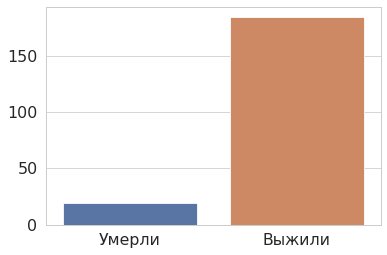

In [97]:
# количество умерших (Died) и выживших (Survived) пациентов
fig, ax = plt.subplots()
sns.barplot(data = [[i] for i in df.groupby('OUTCOME',as_index=False)['ID'].nunique()['ID']])
ax.set_xticklabels(['Умерли', 'Выжили'])
plt.show()

Описательная статистика: **Выжившие пациенты**

In [98]:
# описательная статистика выживших пациентов
df[df['OUTCOME']=='Survived'][target_columns[2:-1]].describe().T

,count,mean,std,min,25%,50%,75%,max
Возраст,1232.0,10.154795,5.538551,0.25,4.000000,12.000000,15.000000,18.000000
GT,1232.0,0.293831,0.455701,0.00,0.000000,0.000000,1.000000,1.000000
САД,1232.0,112.331981,14.082478,50.00,104.000000,110.000000,120.000000,170.000000
ДАД,1232.0,65.692370,11.614174,5.00,60.000000,65.000000,73.000000,119.000000
СрАД,1232.0,81.238907,11.469878,30.00,73.333333,81.333333,88.333333,117.666667
ЧСС,1232.0,105.797890,23.279370,24.00,90.000000,106.000000,120.000000,180.000000
ИА,1232.0,0.962915,0.278175,0.20,0.772727,0.933333,1.100000,2.800000
SpO2,1232.0,98.581169,2.996055,26.00,98.000000,99.000000,100.000000,110.000000
Масса тела,1232.0,41.689123,23.182670,6.00,18.000000,45.000000,60.000000,103.000000
Cl-,1232.0,110.864558,11.799959,31.00,104.000000,108.744756,114.000000,191.000000


Описательная статистика: **Умершие пациенты**

In [99]:
# описательная статистика умерших пациентов
df[df['OUTCOME']=='Died'][target_columns[2:-1]].describe().T

,count,mean,std,min,25%,50%,75%,max
Возраст,160.0,8.526563,4.473692,0.250000,5.250000,9.000000,13.000000,17.000000
GT,160.0,0.543750,0.499646,0.000000,0.000000,1.000000,1.000000,1.000000
САД,160.0,103.037500,23.474565,45.000000,86.500000,103.000000,117.000000,165.000000
ДАД,160.0,58.393750,16.823949,17.000000,46.750000,59.500000,70.000000,99.000000
СрАД,160.0,73.275000,18.274426,26.333333,60.000000,73.333333,86.833333,120.666667
ЧСС,160.0,105.287500,25.105410,41.000000,90.000000,106.000000,121.250000,186.000000
ИА,160.0,1.072014,0.384730,0.464000,0.838539,0.990990,1.191877,3.100000
SpO2,160.0,96.806250,4.984879,69.000000,98.000000,98.000000,99.000000,100.000000
Масса тела,160.0,32.568750,16.142300,6.000000,20.000000,30.000000,43.000000,75.000000
Cl-,160.0,119.799886,17.324053,60.600000,108.744756,114.500000,133.250000,193.000000


In [100]:
# сравнение средних
a = pd.DataFrame(df[df['OUTCOME']=='Died'][target_columns[2:-1]].drop('GT',axis=1).mean()).rename(columns = {0:'Группа 1: умерли'})
a_ = []
for i in target_columns[2:-1]:
    if i != 'GT':
        a_.append(df[df['OUTCOME']=='Survived'][i].mean())
a['Группа 2: выжили'] = a_
a

,Группа 1: умерли,Группа 2: выжили
Возраст,8.526563,10.154795
САД,103.037500,112.331981
ДАД,58.393750,65.692370
СрАД,73.275000,81.238907
ЧСС,105.287500,105.797890
ИА,1.072014,0.962915
SpO2,96.806250,98.581169
Масса тела,32.568750,41.689123
Cl-,119.799886,110.864558
Лактат,1.350625,1.263872


**Проверка наличия значимой разницы между группами выживших и умерших пациентов**

In [101]:
# для сохранения результатов в виде таблицы
columns = ['Вариант','Показатель','Значимость различий','p_value','alpha']
append_list = []
# т.к. выборки разного размера, в одной из них - мало данных, распределение не нормальное (графики ниже), воспользуемся тестом Краскела-Уоллиса
for k,i in enumerate(target_columns[2:-1]):
    group0 = df[df['OUTCOME']=='Survived'][i]
    group1 = df[df['OUTCOME']=='Died'][i]
    alpha = 0.05
    test_value, p  = stats.kruskal(group0,group1)
    if alpha<p:
        append_list.append(['Все пациенты',i,'значимость различия не доказана',p,alpha,group0.median(),group0.quantile(0.25),group0.quantile(0.75),\
                           group1.median(),group1.quantile(0.25),group1.quantile(0.75)])
    else:
        append_list.append(['Все пациенты',i,'обнаружены значимые различия',p,alpha,group0.median(),group0.quantile(0.25),group0.quantile(0.75),\
                           group1.median(),group1.quantile(0.25),group1.quantile(0.75)])

2. **Пациенты, получавшие ГТ**

In [102]:
a = df[df['GT']==1].groupby('OUTCOME',as_index=False)['ID'].nunique().replace({'Died':'Умерли','Survived':'Выжили'})
a.columns=['Исход','Количество пациентов']
a

,Исход,Количество пациентов
0,Умерли,14
1,Выжили,99


In [103]:
# Группа 1: умерли
df[(df['OUTCOME']=='Died')&(df['GT']==1)][target_columns[2:-1]].describe().T

,count,mean,std,min,25%,50%,75%,max
Возраст,87.0,7.028736,3.970190,0.250000,4.833333,6.666667,9.000000,17.000000
GT,87.0,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000
САД,87.0,99.160920,21.265691,45.000000,82.500000,102.000000,114.000000,165.000000
ДАД,87.0,57.034483,16.770994,17.000000,45.000000,58.000000,70.000000,93.000000
СрАД,87.0,71.076628,17.668692,26.333333,59.666667,71.666667,84.833333,115.000000
ЧСС,87.0,104.321839,28.342381,41.000000,87.000000,107.000000,121.500000,186.000000
ИА,87.0,1.095675,0.420074,0.464000,0.858396,1.000000,1.192099,3.100000
SpO2,87.0,97.091954,4.105108,70.000000,97.500000,98.000000,99.000000,100.000000
Масса тела,87.0,27.137931,13.913497,6.000000,20.000000,25.000000,30.000000,75.000000
Cl-,87.0,122.959288,18.820388,95.000000,108.744756,120.000000,139.000000,193.000000


In [104]:
# Группа 2: выжили
df[(df['OUTCOME']=='Survived')&(df['GT']==1)][target_columns[2:-1]].describe().T

,count,mean,std,min,25%,50%,75%,max
Возраст,362.0,9.588113,5.599449,0.666667,4.000000,11.000000,14.000000,17.000000
GT,362.0,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000
САД,362.0,110.812155,15.094827,50.000000,100.000000,110.000000,120.000000,163.000000
ДАД,362.0,63.944751,12.661248,20.000000,55.000000,64.000000,70.000000,100.000000
СрАД,362.0,79.567219,12.645701,30.000000,71.416667,79.333333,87.333333,117.666667
ЧСС,362.0,106.569061,24.055843,52.000000,90.000000,106.000000,120.000000,176.000000
ИА,362.0,0.991421,0.320478,0.412903,0.782143,0.936364,1.116447,2.800000
SpO2,362.0,98.345304,4.565266,26.000000,98.000000,99.000000,100.000000,100.000000
Масса тела,362.0,39.592541,23.571319,7.500000,17.000000,35.000000,60.000000,100.000000
Cl-,362.0,110.585869,10.139686,31.000000,105.000000,108.872378,115.000000,153.000000


In [105]:
# сравнение средних
a = pd.DataFrame(df[(df['OUTCOME']=='Died')&(df['GT']==1)][target_columns[2:-1]].drop('GT',axis=1).mean()).rename(columns = {0:'Группа 1: умерли'})
a_ = []
for i in target_columns[2:-1]:
    if i != 'GT':
        a_.append(df[(df['OUTCOME']=='Survived')&(df['GT']==1)][i].mean())
a['Группа 2: выжили'] = a_
a

,Группа 1: умерли,Группа 2: выжили
Возраст,7.028736,9.588113
САД,99.160920,110.812155
ДАД,57.034483,63.944751
СрАД,71.076628,79.567219
ЧСС,104.321839,106.569061
ИА,1.095675,0.991421
SpO2,97.091954,98.345304
Масса тела,27.137931,39.592541
Cl-,122.959288,110.585869
Лактат,1.714943,1.490608


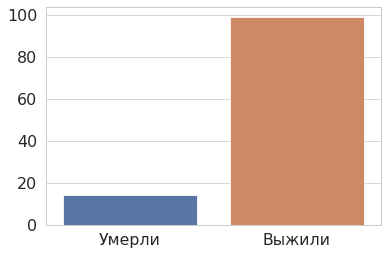

In [106]:
# количество умерших (0) и выживших (1) пациентов, получавших ГТ
fig, ax = plt.subplots()
sns.barplot(data = [[i] for i in df[df['GT']==1].groupby('ID')['OUTCOME'].first().value_counts()[::-1]]);
ax.set_xticklabels(['Умерли', 'Выжили'])
plt.show()

**Проверка наличия значимой разницы между группами выживших и умерших пациентов, получавших ГТ**

In [107]:
# т.к. выборки разного размера, в одной из них - мало данных, распределение не нормальное (графики ниже), воспользуемся тестом Краскела-Уоллиса
for k,i in enumerate(target_columns[2:-1]):
    group0 = df[(df['OUTCOME']=='Survived')&(df['GT']==1)][i]
    group1 = df[(df['OUTCOME']=='Died')&(df['GT']==1)][i]
    alpha = 0.05
    try:        
        test_value, p  = stats.kruskal(group0,group1)
        if alpha<p:
            append_list.append(['Получали ГТ',i,'значимость различия не доказана',p,alpha,group0.median(),group0.quantile(0.25),group0.quantile(0.75),\
                           group1.median(),group1.quantile(0.25),group1.quantile(0.75)])
        else:
            append_list.append(['Получали ГТ',i,'обнаружены значимые различия',p,alpha,group0.median(),group0.quantile(0.25),group0.quantile(0.75),\
                           group1.median(),group1.quantile(0.25),group1.quantile(0.75)])
    except Exception:
        pass

3. **Пациенты, не получавшие ГТ**

In [108]:
gt_users = df.loc[df['GT']==1,'ID'].unique()
a = df[(df['GT']==0)&(~df.ID.isin(gt_users))].groupby('OUTCOME',as_index=False)['ID'].nunique().replace({'Died':'Умерли','Survived':'Выжили'})
a.columns=['Исход','Количество пациентов']
a

,Исход,Количество пациентов
0,Умерли,5
1,Выжили,85


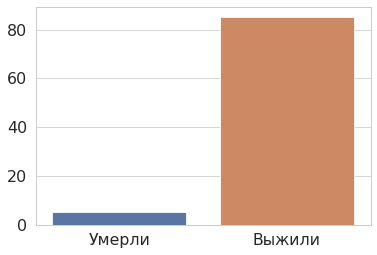

In [109]:
# количество умерших (0) и выживших (1) пациентов, не получавших ГТ
fig, ax = plt.subplots()
sns.barplot(data = [[i] for i in df[(df['GT']==0)&(~df.ID.isin(gt_users))].groupby('ID')['OUTCOME'].first().value_counts()[::-1]]);
ax.set_xticklabels(['Умерли', 'Выжили'])
plt.show()

In [110]:
# Группа 1: умерли
df[(df['OUTCOME']=='Died')&(df['GT']==0)&(~df.ID.isin(gt_users))][target_columns[2:-1]].describe().T

,count,mean,std,min,25%,50%,75%,max
Возраст,28.0,10.000000,5.429685,1.000000,9.250000,12.000000,13.000000,17.000000
GT,28.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
САД,28.0,98.035714,22.280172,50.000000,85.000000,93.000000,111.500000,142.000000
ДАД,28.0,55.250000,16.249501,26.000000,44.500000,52.000000,62.000000,96.000000
СрАД,28.0,69.511905,17.695058,34.000000,58.000000,66.666667,77.666667,110.666667
ЧСС,28.0,115.964286,22.701741,64.000000,101.500000,117.000000,125.750000,178.000000
ИА,28.0,1.236859,0.355690,0.731707,0.981818,1.183473,1.361928,2.200000
SpO2,28.0,97.071429,5.401842,75.000000,98.000000,99.000000,99.250000,100.000000
Масса тела,28.0,40.000000,17.747196,12.000000,33.000000,40.000000,56.000000,56.000000
Cl-,28.0,121.229421,13.127313,100.000000,108.744756,116.000000,132.000000,141.000000


In [111]:
# Группа 2: выжили
df[(df['OUTCOME']=='Survived')&(df['GT']==0)&(~df.ID.isin(gt_users))][target_columns[2:-1]].describe().T

,count,mean,std,min,25%,50%,75%,max
Возраст,414.0,9.502262,5.406316,0.250000,4.000000,11.000000,15.000000,18.000000
GT,414.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
САД,414.0,111.618357,14.156998,70.000000,102.000000,110.000000,120.000000,170.000000
ДАД,414.0,64.903382,10.528427,30.000000,60.000000,65.000000,70.000000,119.000000
СрАД,414.0,80.475040,10.669506,43.333333,73.333333,80.000000,86.666667,117.333333
ЧСС,414.0,104.722222,23.393624,40.000000,90.000000,105.000000,120.000000,180.000000
ИА,414.0,0.960196,0.277759,0.381356,0.765913,0.973903,1.110561,2.250000
SpO2,414.0,98.586957,2.255136,70.000000,98.000000,99.000000,100.000000,100.000000
Масса тела,414.0,40.176329,23.670259,6.000000,16.500000,37.000000,60.000000,103.000000
Cl-,414.0,111.088820,14.011761,85.000000,104.000000,108.744756,113.000000,191.000000


In [112]:
# сравнение средних
a = pd.DataFrame(df[(df['OUTCOME']=='Died')&(df['GT']==0)&(~df.ID.isin(gt_users))][target_columns[2:-1]].drop('GT',axis=1).mean()).rename(columns = {0:'Группа 1: умерли'})
a_ = []
for i in target_columns[2:-1]:
    if i != 'GT':
        a_.append(df[(df['OUTCOME']=='Survived')&(df['GT']==0)&(~df.ID.isin(gt_users))][i].mean())
a['Группа 2: выжили'] = a_
a

,Группа 1: умерли,Группа 2: выжили
Возраст,10.000000,9.502262
САД,98.035714,111.618357
ДАД,55.250000,64.903382
СрАД,69.511905,80.475040
ЧСС,115.964286,104.722222
ИА,1.236859,0.960196
SpO2,97.071429,98.586957
Масса тела,40.000000,40.176329
Cl-,121.229421,111.088820
Лактат,1.546429,1.210362


**Проверка наличия значимой разницы между группами выживших и умерших пациентов, неполучавших ГТ**

In [113]:
# т.к. выборки разного размера, в одной из них - мало данных, распределение не нормальное, воспользуемся тестом Краскела-Уоллиса
for k,i in enumerate(target_columns[2:-1]):
    group0 = df[(df['OUTCOME']=='Survived')&(df['GT']==0)][i]
    group1 = df[(df['OUTCOME']=='Died')&(df['GT']==0)][i]
    alpha = 0.05
    try:        
        test_value, p  = stats.kruskal(group0,group1)
        if alpha<p:
            append_list.append(['Не получали ГТ',i,'значимость различия не доказана',p,alpha,group0.median(),group0.quantile(0.25),group0.quantile(0.75),\
                           group1.median(),group1.quantile(0.25),group1.quantile(0.75)])
        else:
            append_list.append(['Не получали ГТ',i,'обнаружены значимые различия',p,alpha,group0.median(),group0.quantile(0.25),group0.quantile(0.75),\
                           group1.median(),group1.quantile(0.25),group1.quantile(0.75)])
    except Exception:
        pass

## 1й день

1. **Все вместе**
2. **Получавшие ГТ**
3. **Неполучавшие ГТ**

#### При анализе первого дня количество анализируемых пациентов не изменяется (все находились в ОРИТ хотя бы 1 день)

1

In [114]:
# т.к. выборки разного размера, в одной из них - мало данных, распределение не нормальное, воспользуемся тестом Краскела-Уоллиса
for k,i in enumerate(target_columns[2:-1]):
    group0 = df[(df['OUTCOME']=='Survived')&(df.Day==1)][i]
    group1 = df[(df['OUTCOME']=='Died')&(df.Day==1)][i]
    alpha = 0.05
    test_value, p  = stats.kruskal(group0,group1)
    if alpha<p:
        append_list.append(['Все пациенты, 1й день',i,'значимость различия не доказана',p,alpha,group0.median(),group0.quantile(0.25),group0.quantile(0.75),\
                           group1.median(),group1.quantile(0.25),group1.quantile(0.75)])
    else:
        append_list.append(['Все пациенты, 1й день',i,'обнаружены значимые различия',p,alpha,group0.median(),group0.quantile(0.25),group0.quantile(0.75),\
                           group1.median(),group1.quantile(0.25),group1.quantile(0.75)])
print(f'Выживших: {group0.shape[0]}, умерших: {group1.shape[0]}')

Выживших: 184, умерших: 19


In [115]:
a0 = df[(df['OUTCOME']=='Survived')&(df.Day==1)]
df[(df['OUTCOME']=='Survived')&(df.Day==1)].describe().T

,count,mean,std,min,25%,50%,75%,max
ID,184.0,105.146739,63.918025,1.000000,47.750000,107.500000,157.500000,216.000000
Day,184.0,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000
Возраст,184.0,8.988207,5.359763,0.250000,4.000000,8.500000,14.000000,18.000000
GT,184.0,0.407609,0.492730,0.000000,0.000000,0.000000,1.000000,1.000000
САД,184.0,107.000000,18.267592,50.000000,94.750000,110.000000,120.000000,159.000000
ДАД,184.0,63.179348,13.639600,20.000000,55.000000,60.000000,70.000000,119.000000
СрАД,184.0,77.786232,14.272743,30.000000,69.083333,78.000000,86.666667,117.333333
ЧСС,184.0,110.809783,22.699551,40.000000,94.000000,110.000000,124.000000,172.000000
ИА,184.0,1.081798,0.365621,0.407692,0.828591,1.038462,1.224465,2.800000
SpO2,184.0,98.173913,6.102241,26.000000,98.000000,100.000000,100.000000,100.000000


In [116]:
b0 = df[(df['OUTCOME']=='Died')&(df.Day==1)]
df[(df['OUTCOME']=='Died')&(df.Day==1)].describe().T

,count,mean,std,min,25%,50%,75%,max
ID,19.0,94.263158,35.529084,30.000000,78.500000,91.000000,95.500000,205.000000
Day,19.0,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000
Возраст,19.0,9.342105,5.659097,0.250000,5.125000,9.000000,14.000000,17.000000
GT,19.0,0.684211,0.477567,0.000000,0.000000,1.000000,1.000000,1.000000
САД,19.0,93.526316,24.541050,45.000000,72.500000,99.000000,111.000000,130.000000
ДАД,19.0,51.631579,18.294536,17.000000,40.000000,53.000000,65.000000,81.000000
СрАД,19.0,65.596491,19.754849,26.333333,49.166667,68.333333,80.166667,95.666667
ЧСС,19.0,108.421053,30.229338,54.000000,88.000000,110.000000,133.500000,160.000000
ИА,19.0,1.220780,0.421409,0.464000,0.970702,1.173333,1.443137,2.285714
SpO2,19.0,94.473684,8.585313,70.000000,94.500000,98.000000,99.000000,100.000000


In [117]:
# сравнение средних
a = pd.DataFrame(b0[(b0['OUTCOME']=='Died')&(b0['Day']==1)][target_columns[2:-1]].drop('GT',axis=1).mean()).rename(columns = {0:'Группа 1: умерли'})
a_ = []
for i in target_columns[2:-1]:
    if i != 'GT':
        a_.append(a0[(a0['OUTCOME']=='Survived')&(a0['Day']==1)][i].mean())
a['Группа 2: выжили'] = a_
a

,Группа 1: умерли,Группа 2: выжили
Возраст,9.342105,8.988207
САД,93.526316,107.000000
ДАД,51.631579,63.179348
СрАД,65.596491,77.786232
ЧСС,108.421053,110.809783
ИА,1.220780,1.081798
SpO2,94.473684,98.173913
Масса тела,35.631579,36.005435
Cl-,112.959698,108.681024
Лактат,3.684211,1.627717


Возраст


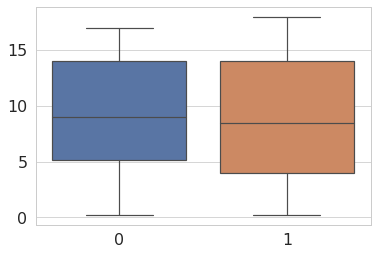

САД


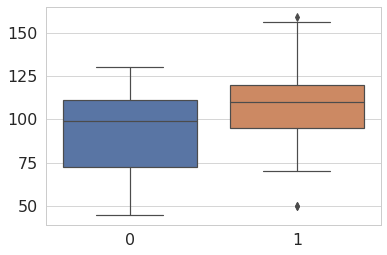

ДАД


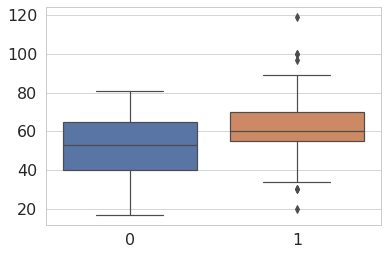

СрАД


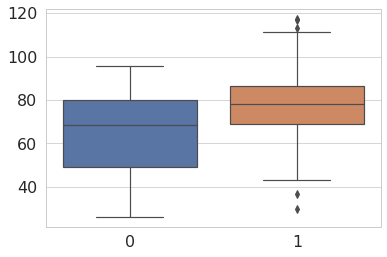

ЧСС


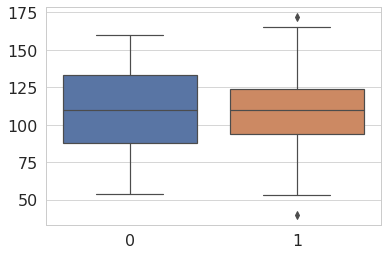

ИА


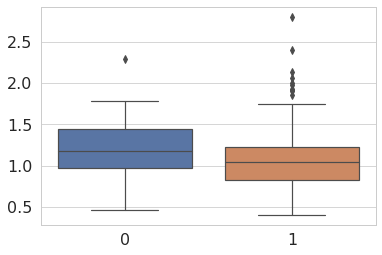

SpO2


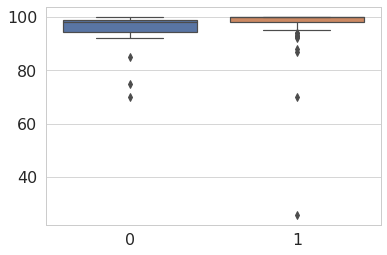

Масса тела


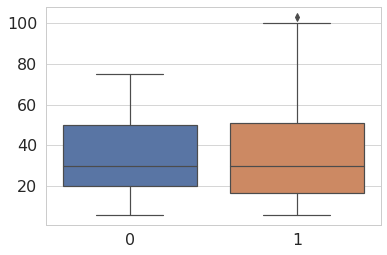

Cl-


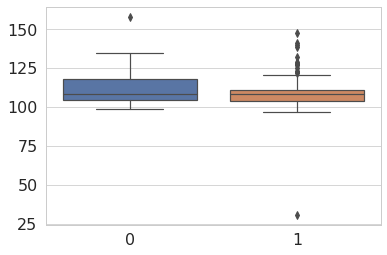

Лактат


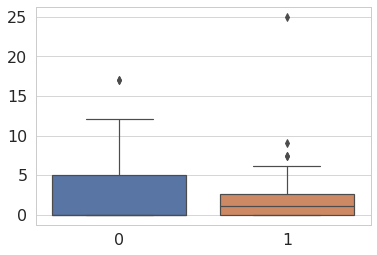

Амилаза


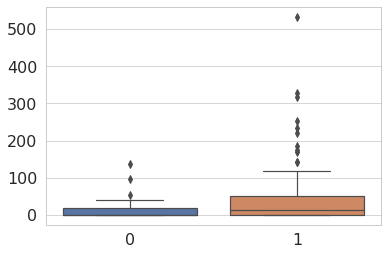

АЛТ


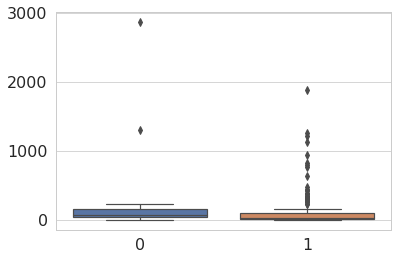

АСТ


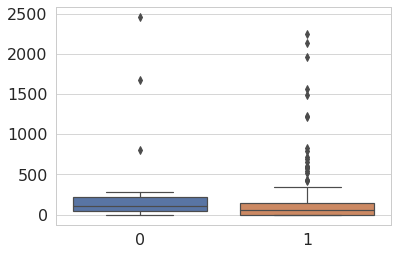

АЧТВ


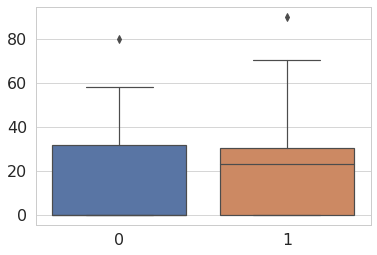

Инфузия, % от N


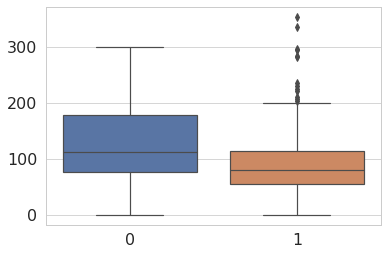

КИ


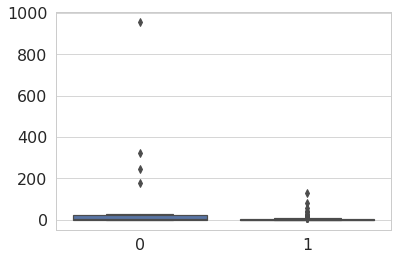

Площадь тела


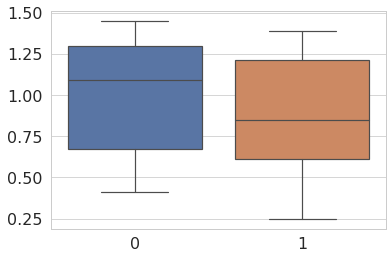

Диурез, мл/кг


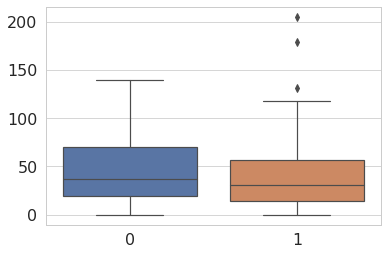

In [118]:
for i in a0.columns[2:-1]:
    if i!='GT':
        print(i)
        sns.boxplot(data = [b0[i],a0[i]]);
        plt.show()

2

In [119]:
# т.к. выборки разного размера, в одной из них - мало данных, распределение не нормальное, воспользуемся тестом Краскела-Уоллиса
for k,i in enumerate(target_columns[2:-1]):
    group0 = df[(df['OUTCOME']=='Survived')&(df.Day==1)&(df.GT==1)][i]
    group1 = df[(df['OUTCOME']=='Died')&(df.Day==1)&(df.GT==1)][i]
    alpha = 0.05
    try:
        test_value, p  = stats.kruskal(group0,group1)
        if alpha<p:
            append_list.append(['Получали ГТ, 1й день',i,'значимость различия не доказана',p,alpha,group0.median(),group0.quantile(0.25),group0.quantile(0.75),\
                           group1.median(),group1.quantile(0.25),group1.quantile(0.75)])
        else:
            append_list.append(['Получали ГТ, 1й день',i,'обнаружены значимые различия',p,alpha,group0.median(),group0.quantile(0.25),group0.quantile(0.75),\
                           group1.median(),group1.quantile(0.25),group1.quantile(0.75)])
    except Exception:
        pass
print(f'Выживших, получавших ГТ: {group0.shape[0]}, умерших, получавших ГТ: {group1.shape[0]}')

Выживших, получавших ГТ: 75, умерших, получавших ГТ: 13


In [120]:
a1 = df[(df['OUTCOME']=='Survived')&(df.Day==1)&(df.GT==1)]
a1.describe().T

,count,mean,std,min,25%,50%,75%,max
ID,75.0,108.093333,67.853812,3.000000,39.500000,116.000000,174.500000,215.000000
Day,75.0,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000
Возраст,75.0,8.862222,5.144140,0.666667,4.000000,9.000000,13.000000,17.000000
GT,75.0,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000
САД,75.0,107.160000,19.811299,50.000000,95.000000,108.000000,119.000000,155.000000
ДАД,75.0,62.013333,14.497431,20.000000,51.000000,62.000000,70.000000,100.000000
СрАД,75.0,77.062222,15.414366,30.000000,68.000000,78.000000,87.500000,113.333333
ЧСС,75.0,113.226667,22.916165,62.000000,98.000000,115.000000,122.000000,172.000000
ИА,75.0,1.118873,0.420857,0.412903,0.854497,1.076190,1.267943,2.800000
SpO2,75.0,97.733333,8.679478,26.000000,98.000000,100.000000,100.000000,100.000000


In [121]:
b1 = df[(df['OUTCOME']=='Died')&(df.Day==1)&(df.GT==1)]
b1.describe().T

,count,mean,std,min,25%,50%,75%,max
ID,13.0,96.461538,40.879121,30.000000,80.000000,91.000000,96.000000,205.000000
Day,13.0,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000
Возраст,13.0,8.423077,5.449416,0.250000,5.000000,6.666667,14.000000,17.000000
GT,13.0,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000
САД,13.0,91.153846,26.635960,45.000000,70.000000,90.000000,110.000000,130.000000
ДАД,13.0,48.615385,18.768495,17.000000,30.000000,52.000000,65.000000,78.000000
СрАД,13.0,62.794872,20.595099,26.333333,46.666667,68.333333,80.000000,93.000000
ЧСС,13.0,101.307692,31.784128,54.000000,80.000000,100.000000,120.000000,160.000000
ИА,13.0,1.181043,0.447806,0.464000,0.950495,1.173333,1.333333,2.285714
SpO2,13.0,94.615385,8.539501,70.000000,93.000000,99.000000,99.000000,100.000000


In [122]:
# сравнение средних
a = pd.DataFrame(b1[(b1['OUTCOME']=='Died')&(b1['GT']==1)][target_columns[2:-1]].drop('GT',axis=1).mean()).rename(columns = {0:'Группа 1: умерли'})
a_ = []
for i in target_columns[2:-1]:
    if i != 'GT':
        a_.append(a1[(a1['OUTCOME']=='Survived')&(a1['GT']==1)][i].mean())
a['Группа 2: выжили'] = a_
a

,Группа 1: умерли,Группа 2: выжили
Возраст,8.423077,8.862222
САД,91.153846,107.160000
ДАД,48.615385,62.013333
СрАД,62.794872,77.062222
ЧСС,101.307692,113.226667
ИА,1.181043,1.118873
SpO2,94.615385,97.733333
Масса тела,34.076923,36.473333
Cl-,112.806885,107.395758
Лактат,3.500000,1.688000


Возраст


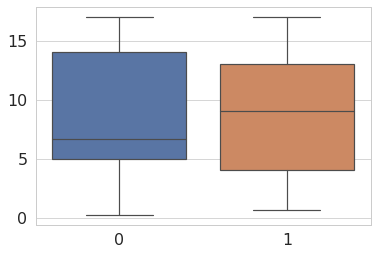

САД


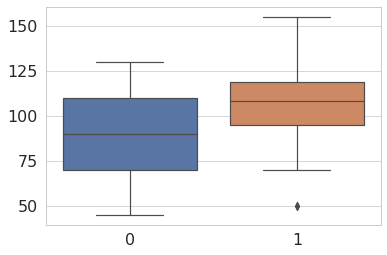

ДАД


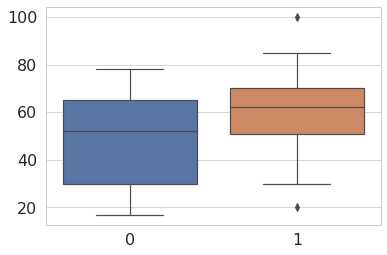

СрАД


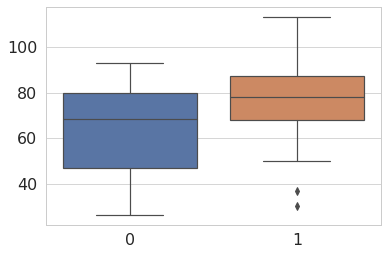

ЧСС


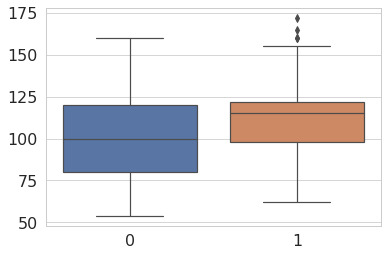

ИА


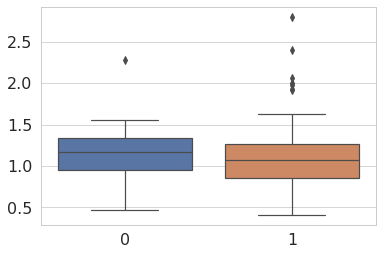

SpO2


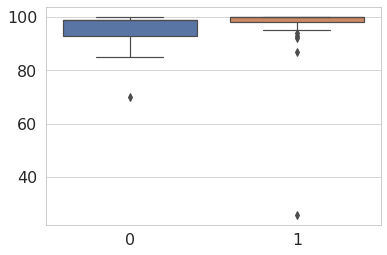

Масса тела


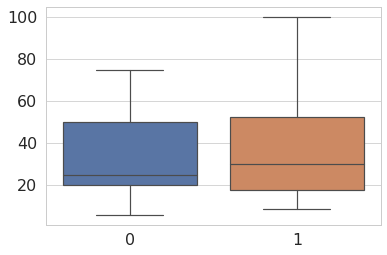

Cl-


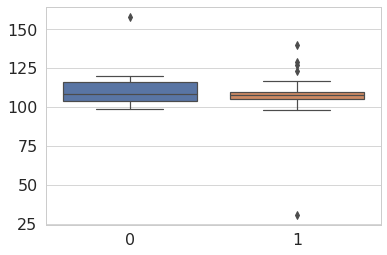

Лактат


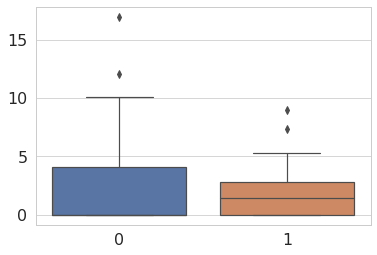

Амилаза


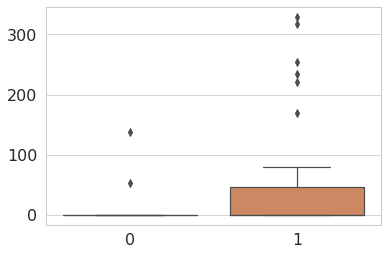

АЛТ


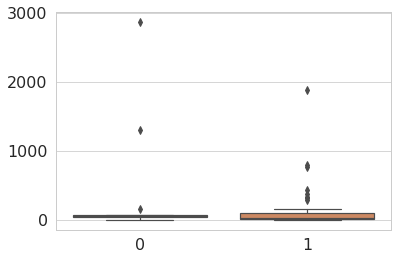

АСТ


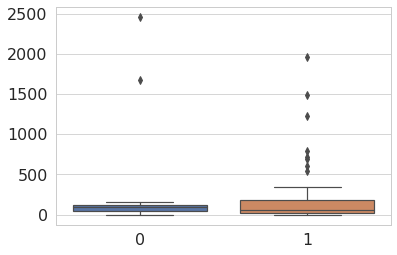

АЧТВ


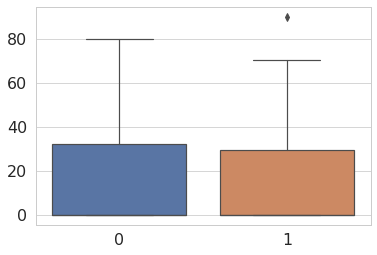

Инфузия, % от N


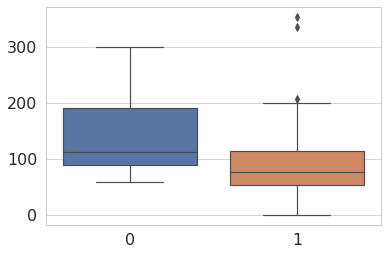

КИ


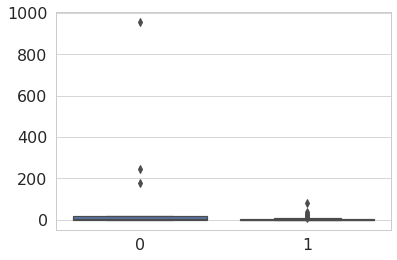

Площадь тела


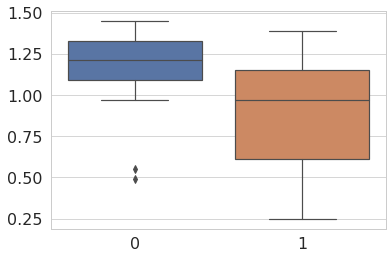

Диурез, мл/кг


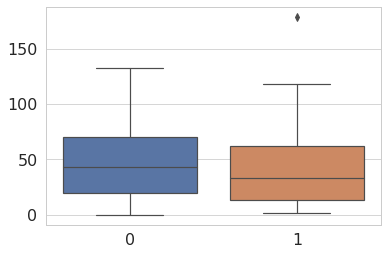

In [123]:
for i in a1.columns[2:-1]:
    if i!='GT':
        print(i)
        sns.boxplot(data = [b1[i],a1[i]]);
        plt.show()

3

In [124]:
# т.к. выборки разного размера, в одной из них - мало данных, распределение не нормальное, воспользуемся тестом Краскела-Уоллиса
for k,i in enumerate(target_columns[2:-1]):
    group0 = df[(df['OUTCOME']=='Survived')&(df.Day==1)&(df.GT==0)][i]
    group1 = df[(df['OUTCOME']=='Died')&(df.Day==1)&(df.GT==0)][i]
    alpha = 0.05
    try:
        test_value, p  = stats.kruskal(group0,group1)
        if alpha<p:
            append_list.append(['Не получали ГТ, 1й день',i,'значимость различия не доказана',p,alpha,group0.median(),group0.quantile(0.25),group0.quantile(0.75),\
                           group1.median(),group1.quantile(0.25),group1.quantile(0.75)])
        else:
            append_list.append(['Не получали ГТ, 1й день',i,'обнаружены значимые различия',p,alpha,group0.median(),group0.quantile(0.25),group0.quantile(0.75),\
                           group1.median(),group1.quantile(0.25),group1.quantile(0.75)])
    except Exception:
        pass
print(f'Выживших, не получавших ГТ: {group0.shape[0]}; умерших, не получавших ГТ: {group1.shape[0]}')

Выживших, не получавших ГТ: 109; умерших, не получавших ГТ: 6


In [125]:
a2 = df[(df['OUTCOME']=='Survived')&(df.Day==1)&(df.GT==0)]
a2.describe().T

,count,mean,std,min,25%,50%,75%,max
ID,109.0,103.119266,61.300976,1.000000,51.000000,105.000000,152.000000,216.000000
Day,109.0,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000
Возраст,109.0,9.074893,5.525062,0.250000,4.000000,8.000000,14.000000,18.000000
GT,109.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
САД,109.0,106.889908,17.218820,70.000000,94.000000,110.000000,120.000000,159.000000
ДАД,109.0,63.981651,13.024181,30.000000,57.000000,60.000000,70.000000,119.000000
СрАД,109.0,78.284404,13.481875,43.333333,70.000000,77.333333,86.666667,117.333333
ЧСС,109.0,109.146789,22.503837,40.000000,92.000000,110.000000,124.000000,165.000000
ИА,109.0,1.056287,0.321774,0.407692,0.807692,1.000000,1.166667,2.133333
SpO2,109.0,98.477064,3.354368,70.000000,98.000000,100.000000,100.000000,100.000000


In [126]:
b2 = df[(df['OUTCOME']=='Died')&(df.Day==1)&(df.GT==0)]
b2.describe().T

,count,mean,std,min,25%,50%,75%,max
ID,6.0,89.500000,22.223861,66.000000,76.500000,85.500000,94.500000,129.000000
Day,6.0,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000
Возраст,6.0,11.333333,6.088240,1.000000,9.000000,12.500000,16.000000,17.000000
GT,6.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
САД,6.0,98.666667,20.471118,70.000000,84.750000,102.500000,110.500000,125.000000
ДАД,6.0,58.166667,16.869104,40.000000,43.250000,58.000000,69.750000,81.000000
СрАД,6.0,71.666667,17.953025,50.000000,57.083333,72.833333,83.333333,95.666667
ЧСС,6.0,123.833333,21.179392,88.000000,114.500000,130.000000,138.750000,144.000000
ИА,6.0,1.306877,0.380837,0.888889,1.031304,1.212792,1.630896,1.785714
SpO2,6.0,94.166667,9.495613,75.000000,96.250000,97.500000,98.750000,100.000000


In [127]:
# сравнение средних
gt_1day_users = df.loc[(df.Day==1)&(df.GT==1),'ID'].unique()
a = pd.DataFrame(b2[(b2['OUTCOME']=='Died')&(b2['GT']==0)&(~b2.ID.isin(gt_1day_users))][target_columns[2:-1]].drop('GT',axis=1).mean()).rename(columns = {0:'Группа 1: умерли'})
a_ = []
for i in target_columns[2:-1]:
    if i != 'GT':
        a_.append(a2[(a2['OUTCOME']=='Survived')&(a2['GT']==0)&(~a2.ID.isin(gt_1day_users))][i].mean())
a['Группа 2: выжили'] = a_
a

,Группа 1: умерли,Группа 2: выжили
Возраст,11.333333,9.074893
САД,98.666667,106.889908
ДАД,58.166667,63.981651
СрАД,71.666667,78.284404
ЧСС,123.833333,109.146789
ИА,1.306877,1.056287
SpO2,94.166667,98.477064
Масса тела,39.000000,35.683486
Cl-,113.290793,109.565381
Лактат,4.083333,1.586239


Возраст


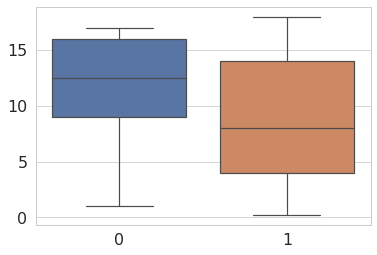

САД


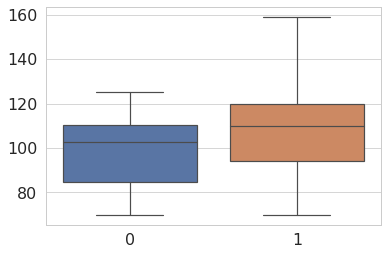

ДАД


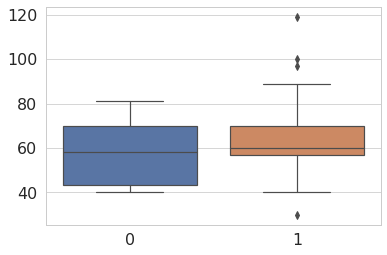

СрАД


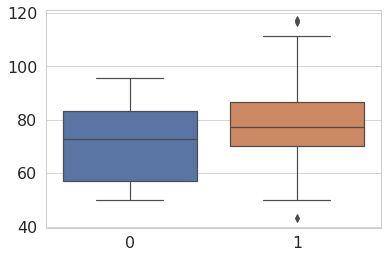

ЧСС


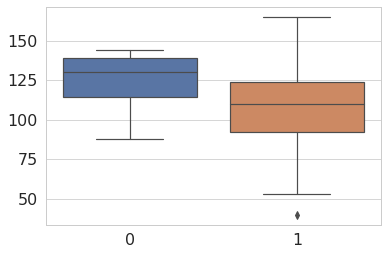

ИА


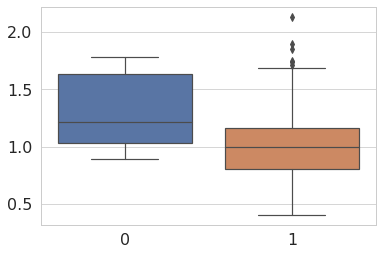

SpO2


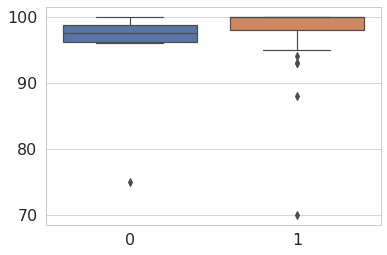

Масса тела


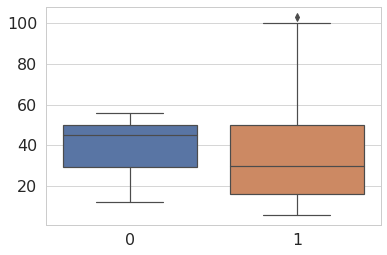

Cl-


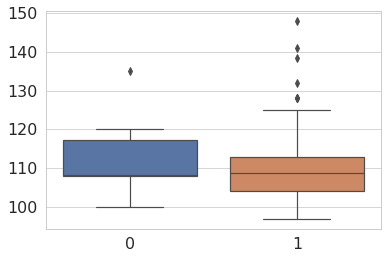

Лактат


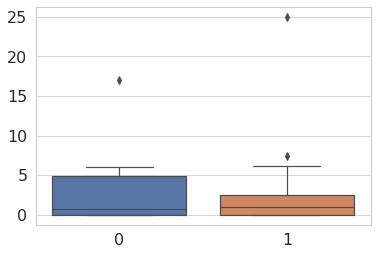

Амилаза


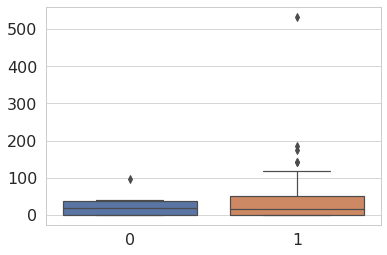

АЛТ


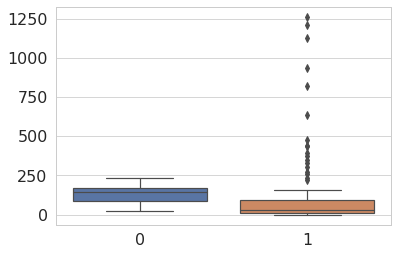

АСТ


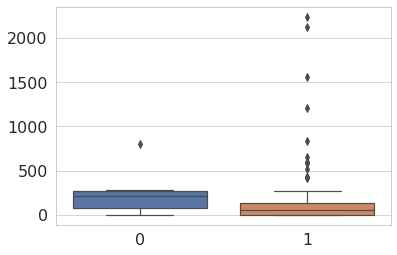

АЧТВ


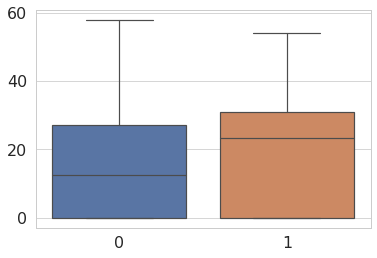

Инфузия, % от N


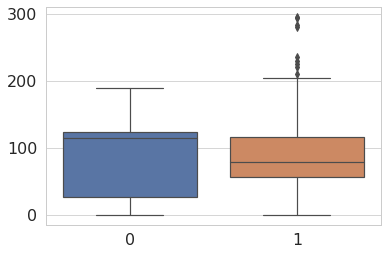

КИ


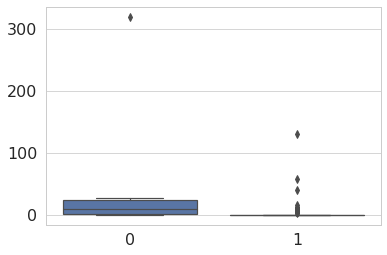

Площадь тела


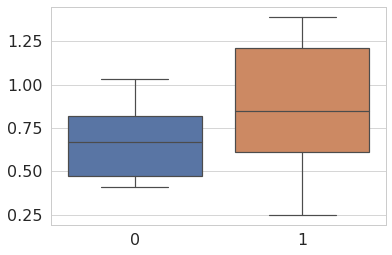

Диурез, мл/кг


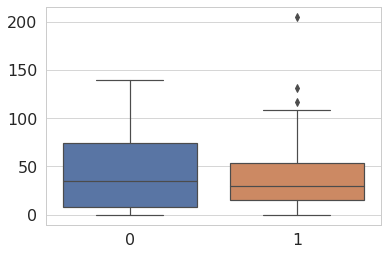

In [128]:
for i in a2.columns[2:-1]:
    if i!='GT':
        print(i)
        sns.boxplot(data = [b2[i],a2[i]]);
        plt.show()

Возраст


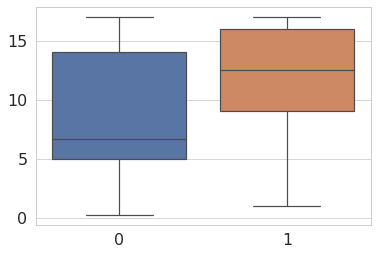

САД


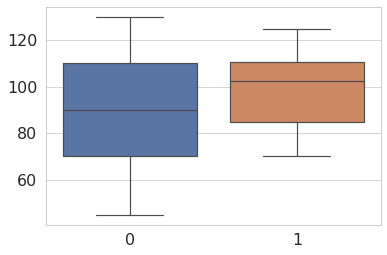

ДАД


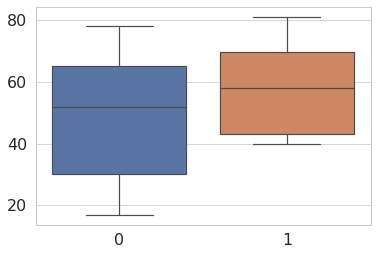

СрАД


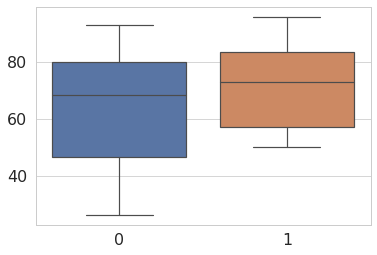

ЧСС


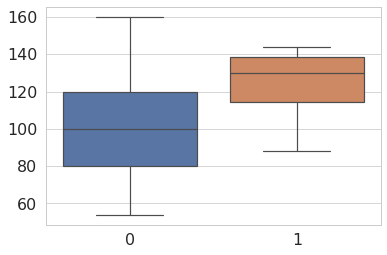

ИА


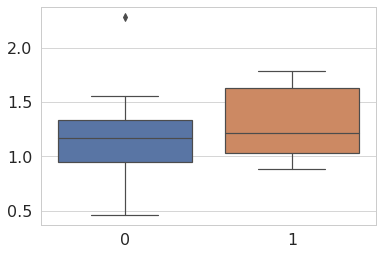

SpO2


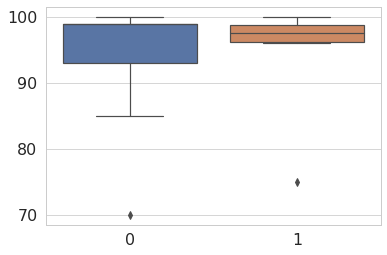

Масса тела


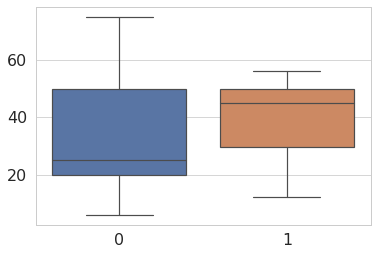

Cl-


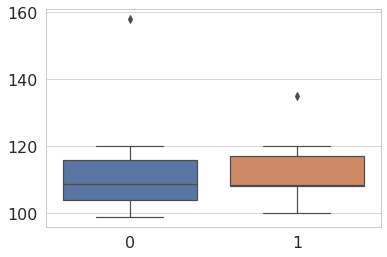

Лактат


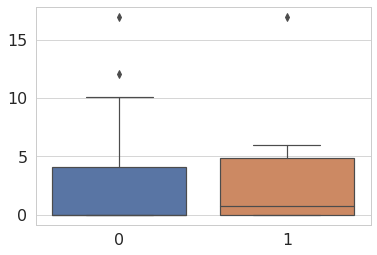

Амилаза


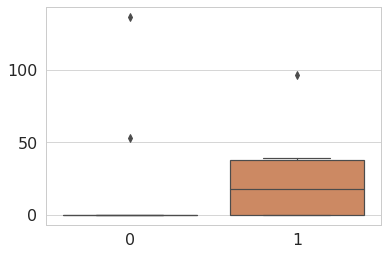

АЛТ


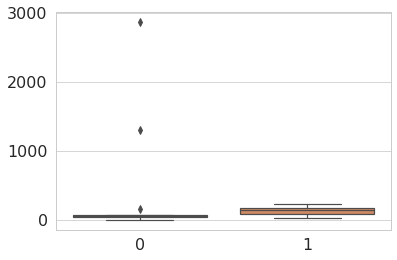

АСТ


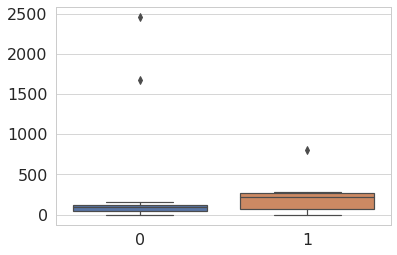

АЧТВ


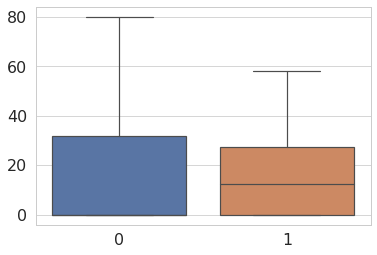

Инфузия, % от N


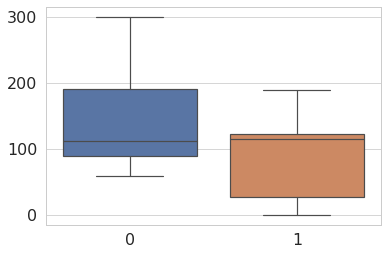

КИ


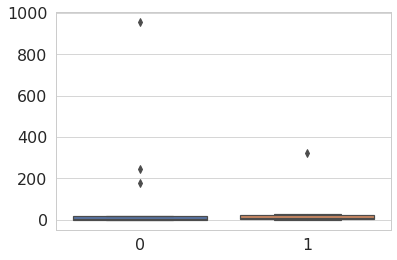

Площадь тела


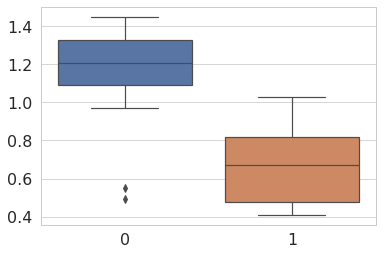

Диурез, мл/кг


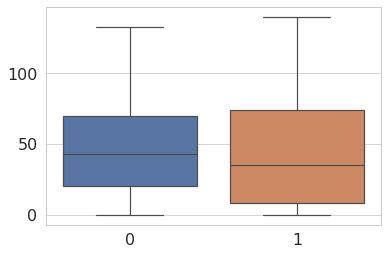

In [129]:
for i in b1.columns[2:-1]:
    if i!='GT':
        print(i)
        sns.boxplot(data = [b1[i],b2[i]]);
        plt.show()

**Результаты проведенного анализа по исходам заболеваний**
* зеленый цвет = разница между группами умерших и выживших пациентов статистически значима;
* белый = разница между группами по параметру не доказана

In [130]:
def highlight_greaterthan(x):
    color = 'lightgreen' if x<0.05 else 'white'
    return 'background-color: %s' % color
columns = ['Вариант', 'Показатель', 'Значимость различий', 'p_value', 'alpha','Медиана (1)','25 центиль (1)','75 центиль (1)','Медиана (2)','25 центиль (2)','75 центиль (2)']
df_results = pd.DataFrame(append_list).set_axis(columns,axis=1)
df_results = df_results.pivot(columns = 'Вариант',index = 'Показатель',values = ['p_value','Медиана (1)','25 центиль (1)','75 центиль (1)','Медиана (2)','25 центиль (2)','75 центиль (2)']).drop('GT',axis=0).style.applymap(highlight_greaterthan)
df_results